### _GeoCryoAI Codebase_ for Environmental Research Letters (ERL-116349)
### Investigating Permafrost Carbon Dynamics in Alaska with Artificial Intelligence
### Author: Bradley A. Gay
### Date: 08/20/2022 (Updated: 08/02/2023)

# Libraries and Functions

In [3]:
import os, sys
import datetime
import re
import glob
import requests
import warnings
#
import bs4
import eofs
import pyts
import pyarrow
import numpy as np
import pandas as pd
#import polars
#import polars as pl
import pickle
import math
import time
import cftime
#
import sklearn
import tensorflow as tf
import tensorflow.keras.backend as K
import keras.backend as K
import keras.optimizers
import keras_tuner
import statsmodels
import pyrsgis
#
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import io
##
from numpy import isnan, array, count_nonzero
from pandas import read_csv, DataFrame, concat
from itertools import groupby, islice
from operator import itemgetter
from pathlib import Path
from datetime import datetime as dt
from datetime import timedelta
from pyrsgis import raster
#
from pywaffle import Waffle
from eofs.standard import Eof
from statsmodels.tsa.arima.model import ARIMA
#
from sklearn import linear_model
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, PowerTransformer, Normalizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, consensus_score, explained_variance_score,r2_score, roc_auc_score, roc_curve
from sklearn.metrics import jaccard_score, mean_squared_error, nan_euclidean_distances, precision_score
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import *
from keras_tuner.engine.hyperparameters import HyperParameters
from keras_tuner.tuners import RandomSearch, BayesianOptimization, Hyperband
from keras_tuner import HyperModel
#import tensorflow_addons as tfa
#from tensorflow_addons.metrics.r_square import RSquare
from keras_tuner.tuners import *
from keras import backend as K
from keras import optimizers 
from keras.preprocessing import *
from keras.models import Sequential
from keras.layers import Dense, InputLayer, Dropout, Flatten, BatchNormalization, Conv1D, Bidirectional
from keras.layers import *
from keras.activations import swish, elu, gelu, selu, sigmoid, relu, tanh, linear, softmax, swish
from keras.layers import MaxPool1D
from keras import *
from keras.models import Model, Sequential
import os

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import rioxarray as rxr
import spectral
from spectral import *
import earthpy as et
import xarray as xr
from libpysal.weights import lat2W
from esda.moran import Moran

from keras.layers import Reshape
import pydot
import pydotplus
import graphviz
from keras import layers
from keras import models
from keras.utils import plot_model
import datetime
from datetime import datetime

# Prettier plotting with seaborn
sns.set(font_scale=1.5, style="white")
# 1. Initialize the notebook using the necessary libraries
import zipfile
import getpass
from osgeo import gdal 
import codecs # for text parsing code
import netrc
import rasterio as rio
import glob
import rioxarray
from rasterio.plot import show # plotting raster data
from rasterio.plot import show_hist #histograms of raster data

%matplotlib inline
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000


### FUNCTIONS ###
################################################################################################

import math
def divisorGenerator(n):
    large_divisors = []
    for i in range(1, int(math.sqrt(n) + 1)):
        if n % i == 0:
            yield i
            if i*i != n:
                large_divisors.append(n / i)
    for divisor in reversed(large_divisors):
        yield divisor

def series_to_supervised(data, lags = 1, forecasting_steps = 1, dropna=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    for i in range(lags, 0, -1):
        cols.append(df.shift(i))
        names += [(df.columns[j], str('t-%d') %  i) for j in range(n_vars)]
    for a in range(0, forecasting_steps):
        cols.append(df.shift(-a))
        if a == 0:
            names += [(df.columns[b], str('t')) for b in range(n_vars)]
        else:
            names += [(df.columns[b], str('t+%d') %  a) for b in range(n_vars)]
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    agg = agg.loc[:,~agg.columns.duplicated()]
    if dropna:
        agg.dropna(inplace=True)
    return agg

In [ ]:
import tensorflow_addons #comment out after first execution

In [7]:
import tensorflow.keras
from tensorflow.python.keras.utils import conv_utils, tf_utils
from tensorflow_addons.metrics.r_square import RSquare
from keras_tuner import HyperModel
from keras_tuner.engine.hyperparameters import HyperParameters
from keras_tuner.tuners import RandomSearch, BayesianOptimization, Hyperband

# Load the TensorBoard notebook extension.
%load_ext tensorboard

from datetime import datetime
from packaging import version
import tensorflow as tf
from tensorflow import keras

# Import necessary libraries
import pandas as pd
import numpy as np                               # Import numpy
from skimage import data, io   # Import skimage library (data - Test images and example data.
#                          io - Reading, saving, and displaying images.)
from skimage.color import rgb2gray
import matplotlib.pyplot as plt                  # Import matplotlib.pyplot (Plotting framework in Python.)
%matplotlib inline
import os                                        # This module provides a portable way of using operating system dependent functionality.
#os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import warnings
# Suppress warnings
warnings.filterwarnings('ignore')
from IPython.display import display
import cv2 as cv
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from tensorflow.keras import utils
from tensorflow.keras.models import Sequential,load_model
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
import seaborn as sns

print("TensorFlow version: ", tf.__version__)
assert version.parse(tf.__version__).release[0] >= 2, \
    "This notebook requires TensorFlow 2.0 or above."
import tensorboard
tensorboard.__version__
# Clear any logs from previous runs
#rm -rf ./logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
TensorFlow version:  2.13.0-dev20230406


'2.13.0'

# In Situ

## Load

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/df_ak.pkl')
with open(file, 'rb') as f:
    df = pickle.load(f)

In [ ]:
#legacy=df
df

In [ ]:
#df=df.drop(df.columns[0:2],axis=1)
#df=df.drop(df.columns[-5],axis=1)
df.index=df.iloc[:,2]
df.index=pd.to_datetime(df.index, format='%Y')
df.index.name = None

In [ ]:
#print(df.columns.values.tolist())

In [ ]:
df=df.sort_index()
df.rename(columns = {'CH4_MIXING_RATION_MEAN':'CH4_MIXING_RATIO_MEAN'}, inplace = True)
df.rename(columns = {'CH4_MIXING_RATION_STD':'CH4_MIXING_RATIO_STD'}, inplace = True)

In [ ]:
df=df.drop(df.columns[0:5],axis=1) #Objects

In [ ]:
df=df.drop(df.columns[44],axis=1)

In [ ]:
df=df.replace(np.nan, -9999)

In [ ]:
df=df.loc[df.iloc[:,15] > -20103115.48]

In [ ]:
df=df.loc[df.iloc[:,15] > -19632788.15]

In [ ]:
df=df.loc[df.iloc[:,15] < 6.69e+19]

In [ ]:
df=df.loc[df.iloc[:,15] < 7.29e+16]

In [ ]:
df=df.loc[df.iloc[:,15] < 8817006896.0]

In [ ]:
df=df.loc[df.iloc[:,15] > -19632788.15]

In [ ]:
df=df.loc[df.iloc[:,19] < 733410.482]

In [ ]:
df

In [ ]:
alt=pd.DataFrame(df.iloc[:,-1]).replace(-9999,np.nan).dropna().sort_index()

In [ ]:
plt.plot(alt.values)

In [ ]:
ch4=pd.DataFrame(df.iloc[:,19]).replace(-9999,np.nan).dropna().sort_index()

In [ ]:
plt.plot(ch4.values)

In [ ]:
co2=pd.DataFrame(df.iloc[:,7]).replace(-9999,np.nan).dropna().sort_index()

In [ ]:
plt.plot(co2.values)

In [ ]:
df

In [ ]:
sns.distplot(df.iloc[:,-1].replace(-9999,np.nan).dropna())

In [ ]:
df2=df.replace(-9999,np.nan)

In [ ]:
numeric_cols=df.columns.values
for col in numeric_cols:
    missing = df2[col].isnull()
    num_missing = np.sum(missing)
    if num_missing > 0:  # only do the imputation for the columns that have missing values.
#        print('imputing missing values for: {}'.format(col))
        df2['{}_ismissing'.format(col)] = missing
        #med = df[col].median()
        df2[col] = df2[col].fillna(method='ffill').fillna(method='bfill')

In [ ]:
#Imputer
df2=df2.drop(df2.iloc[:,-91:],axis=1)

In [ ]:
sns.distplot(df2.iloc[:,-1])

In [ ]:
df2

In [ ]:
df

In [ ]:
plt.plot(df.iloc[:,-1].values)

In [ ]:
plt.plot(df2.iloc[:,-1].values)

In [ ]:
#df.describe().transpose()

In [ ]:
df=df2

In [ ]:
# file = os.path.join('/Users/bradleygay/Downloads/df_pre-clean.pkl')
# with open(file, 'wb') as f:
#     pickle.dump(df,f)
file = os.path.join('/Users/bradleygay/Downloads/df_clean.pkl')
with open(file, 'wb') as f:
    pickle.dump(df,f)

## Load Clean

In [8]:
file = os.path.join('/Users/bradleygay/Downloads/df_clean.pkl')
with open(file, 'rb') as f:
    df=pickle.load(f)

### ALT

In [9]:
reframed_alt=series_to_supervised(df,3,1)

In [10]:
reframed_alt.drop(reframed_alt.iloc[:,-91:-1],axis=1, inplace=True)

In [ ]:
Xalt=reframed_alt.iloc[:,:-1] #features
yalt=pd.DataFrame(reframed_alt.iloc[:,-1]) #target

### CH4

In [13]:
reframed_ch4=series_to_supervised(df,3,1)

In [14]:
reframed_ch4.drop(reframed_ch4.iloc[:,-91:-78],axis=1, inplace=True)
reframed_ch4.drop(reframed_ch4.iloc[:,-66:],axis=1, inplace=True)
reframed_ch4.drop(reframed_ch4.iloc[:,-12:-6],axis=1, inplace=True)
reframed_ch4.drop(reframed_ch4.iloc[:,-5:],axis=1, inplace=True)

In [ ]:
Xch4=reframed_ch4.iloc[:,:-1] #features
ych4=pd.DataFrame(reframed_ch4.iloc[:,-1]) #target

### CO2

In [15]:
reframed_co2=series_to_supervised(df,3,1)

In [16]:
reframed_co2.drop(reframed_co2.iloc[:,-91:-87],axis=1,inplace=True)
reframed_co2.drop(reframed_co2.iloc[:,-78:],axis=1,inplace=True)
reframed_co2.drop(reframed_co2.iloc[:,-9:-6],axis=1,inplace=True)
reframed_co2.drop(reframed_co2.iloc[:,-5:],axis=1,inplace=True)

In [ ]:
Xco2=reframed_co2.iloc[:,:-1] #features
yco2=pd.DataFrame(reframed_co2.iloc[:,-1]) #target

In [ ]:
# # df1=dfnew.iloc[:,:17];
# # df2=dfnew.iloc[:,29:];
# # df1=df.iloc[:,:15];
# # df2=df.iloc[:,16:];
# df1=reframed.iloc[:,:19];
# df2=reframed.iloc[:,20:];
# df3=pd.concat([df1,df2],axis=1);

# Xch4=df3 #features
# ych4=pd.DataFrame(reframed.loc[:,'CH4_1_1_1'])  #target

In [ ]:
# df1=df.iloc[:,:10];
# df2=df.iloc[:,11:];
# df3=pd.concat([df1,df2],axis=1);

# Xco2=df3 #features
# yco2=pd.DataFrame(df.loc[:,'CO2_1_1_1'])  #target

### Archive

##### Save

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/Xalt.pkl')
with open(file, 'wb') as f:
    pickle.dump(Xalt,f)

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/yalt.pkl')
with open(file, 'wb') as f:
    pickle.dump(yalt,f)

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/Xch4.pkl')
with open(file, 'wb') as f:
    pickle.dump(Xch4,f)

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/ych4.pkl')
with open(file, 'wb') as f:
    pickle.dump(ych4,f)

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/Xco2.pkl')
with open(file, 'wb') as f:
    pickle.dump(Xco2,f)

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/yco2.pkl')
with open(file, 'wb') as f:
    pickle.dump(yco2,f)

##### Continue

In [ ]:
#Xalt.shape, Xch4.shape, Xco2.shape
#yalt.shape, ych4.shape, yco2.shape
#ych4.min()
#X, y = Xalt, yalt

In [ ]:
# X=X.replace(-9999,np.nan).fillna(method='bfill').fillna(method='ffill')
# y=y.replace(-9999,np.nan).fillna(method='bfill').fillna(method='ffill')

In [ ]:
#1969-2018:1772964/2441246#0.7262537245324724
#1969-2019:2043752/2441246#0.8371757700780667
#1969-2020:2226109/2441246#0.9118741003569488

# from sklearn.model_selection import train_test_split
# X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=False,
#                                    test_size=0.20, random_state=40)
# X_train=X.loc[:'2019',:]; y_train=y.loc[:'2019'];
# X_test=X.loc['2020':,:]; y_test=y.loc['2020':];

In [ ]:
# X_train=X.loc[:'2018',:]; y_train=y.loc[:'2018'];
# X_valid=X.loc['2019':'2020',:]; y_valid=y.loc['2019':'2020'];
# X_test=X.loc['2021':,:]; y_test=y.loc['2021':];

In [ ]:
Xalt.shape, Xch4.shape, Xco2.shape

In [ ]:
yalt.shape, ych4.shape, yco2.shape

In [ ]:
ych4.min()

In [ ]:
X, y = Xalt, yalt

##### Train/Test

In [ ]:
#train, valid, test = reframed_alt.loc['1969':'2018',:],reframed_alt.loc['2019':'2020', :], reframed_alt.loc['2021':, :]

In [ ]:
#ALT
X_train, y_train, X_valid, y_valid, X_test, y_test = reframed_alt.loc['1969':'2018',:], reframed_alt.loc['1969':'2018',:], \
reframed_alt.loc['2019':'2020', :], reframed_alt.loc['2019':'2020',:], reframed_altalt.loc['2021':'2022', :], reframed_alt.loc['2021':'2022',:]
#never outputs last mentioned key 
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)#, random_state=1)
# X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.22)#, random_state=1) # 0.25 x 0.8 = 0.2

In [ ]:
#CH4
X_trainch4, y_trainch4, X_validch4, y_validch4, X_testch4, y_testch4 = Xch4.loc['2003':'2018',:], ych4.loc['2003':'2018',:], Xch4.loc['2019':'2020',:], \
ych4.loc['2019':'2020',:], Xch4.loc['2021':,:], ych4.loc['2021':,:]
# X_trainch4, X_testch4, y_trainch4, y_testch4 = train_test_split(Xch4, ych4, test_size=0.1)#, random_state=1)
# X_trainch4, X_validch4, y_trainch4, y_validch4 = train_test_split(X_trainch4, y_trainch4, test_size=0.22)#, random_state=1) # 0.25 x 0.8 = 0.2

In [ ]:
#CO2
X_trainco2, y_trainco2, X_validco2, y_validco2, X_testco2, y_testco2 = Xco2.loc['2003':'2018',:], yco2.loc['2003':'2018',:], \
Xco2.loc['2019':'2020',:], yco2.loc['2019':'2020',:], Xco2.loc['2021':,:], yco2.loc['2021':,:]
# X_trainco2, X_testco2, y_trainco2, y_testco2 = train_test_split(Xco2, yco2, test_size=0.1)#, random_state=1)
# X_trainco2, X_validco2, y_trainco2, y_validco2 = train_test_split(X_trainco2, y_trainco2, test_size=0.22)#, random_state=1) # 0.25 x 0.8 = 0.2

In [ ]:
# # split the data
# from fast_ml.model_development import train_valid_test_split
# X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df, target = 'ALT', train_size=0.7, valid_size=0.2, test_size=0.1)
# #X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df, target = 'CH4_1_1_1', train_size=0.7, valid_size=0.2, test_size=0.1)
# #X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df, target = 'CO2_1_1_1', train_size=0.7, valid_size=0.2, test_size=0.1)

In [ ]:
X_train.shape, X_valid.shape, X_test.shape

In [ ]:
X_trainch4.shape, X_validch4.shape, X_testch4.shape

In [ ]:
X_trainco2.shape, X_validco2.shape, X_testco2.shape

##### SAVE

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/X_testalt.pkl')
with open(file, 'wb') as f:
    pickle.dump(X_test,f)

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/y_testalt.pkl')
with open(file, 'wb') as f:
    pickle.dump(y_test,f)

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/X_testch4.pkl')
with open(file, 'wb') as f:
    pickle.dump(X_testch4,f)

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/y_testch4.pkl')
with open(file, 'wb') as f:
    pickle.dump(y_testch4,f)

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/X_testco2.pkl')
with open(file, 'wb') as f:
    pickle.dump(X_testco2,f)

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/y_testco2.pkl')
with open(file, 'wb') as f:
    pickle.dump(y_testco2,f)

#### Playground

In [ ]:
# # split the data
# from fast_ml.model_development import train_valid_test_split
# X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df, target = 'ALT', train_size=0.7, valid_size=0.2, test_size=0.1)
# #X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df, target = 'CH4_1_1_1', train_size=0.7, valid_size=0.2, test_size=0.1)
# #X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df, target = 'CO2_1_1_1', train_size=0.7, valid_size=0.2, test_size=0.1)

In [ ]:
#X=X_train.sort_index(); y=y_train.sort_index()

In [ ]:
plt.plot(y_train.replace(-9999,np.nan).dropna().values)
plt.plot(y_valid.replace(-9999,np.nan).dropna().values)
plt.plot(y_test.replace(-9999,np.nan).dropna().values)
plt.grid()
plt.show()

In [ ]:
plt.plot(y_train.sort_index().replace(-9999,np.nan).dropna().values)#1713754
plt.plot(y_valid.sort_index().replace(-9999,np.nan).dropna().values)#483367
plt.plot(y_test.sort_index().replace(-9999,np.nan).dropna().values)#244125
plt.grid()
plt.show()

In [ ]:
#df.loc['2021':'2022']
#1772964/2441246#0.7262537245324724
#614894/2441246#0.25187711521083905
#453145/2441246#0.18562037582447652
#215137/2441246#0.08812589964305113

In [ ]:
#df.loc['2021':'2021','CH4_1_1_1']
#1413747/2369279#0.5966992490120412
#1754385/2369279#0.7404721014283249
#453145/2369279#0.1912586065212244
#270788/2369279
#161749/2369279

In [ ]:
#df.loc['2021':'2021','CO2_1_1_1']
#1413747/2369279#0.5966992490120412
#1754385/2369279#0.7404721014283249
#453145/2369279#0.1912586065212244
#270788/2369279
#161749/2369279

In [ ]:
X_train=df.iloc[:,-1].replace(-9999,np.nan);
X_trainch4=X_trainch4.replace(-9999,np.nan);
X_trainco2=X_trainco2.replace(-9999,np.nan);

In [ ]:
from pandas import read_csv
from matplotlib import pyplot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [ ]:
plt.figure(figsize=(9,6),dpi=1000)
plot_acf(df.loc[:,'CO2_1_1_1'].replace(-9999,np.nan).dropna())
plt.grid()
plt.show()

In [ ]:
# plt.plot(X_trainch4.replace(-9999,np.nan).dropna().values)
# plt.show()

In [ ]:
plt.figure(figsize=(9,6),dpi=1000)
plot_pacf(df.loc[:,'CO2_1_1_1'].replace(-9999,np.nan).dropna(), lags=50)
plt.grid()
plt.show()

In [ ]:
# #Walk forward validation
# series = read_csv('sunspots.csv', header=0, index_col=0)
# X = series.values
# n_train = 500
# n_records = len(X)
# for i in range(n_train, n_records):
#  train, test = X[0:i], X[i:i+1]
#  print('train=%d, test=%d' % (len(train), len(test)))

In [ ]:
plt.figure(figsize=(9,6),dpi=1000)
rolling_mean = df.loc[:,'ALT'].replace(-9999,np.nan).dropna().rolling(window = 12).mean().values
rolling_std = df.loc[:,'ALT'].replace(-9999,np.nan).dropna().rolling(window = 12).std().values
plt.plot(df.loc[:,'ALT'].replace(-9999,np.nan).dropna().values, color = 'blue', label = 'Original')
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean')#.replace(-9999,np.nan).dropna()
plt.plot(rolling_std, color = 'black', label = 'Rolling Std')
plt.legend(loc = 'best')
plt.title('Rolling Mean & Rolling Standard Deviation')
plt.grid()
plt.show()

In [ ]:
plt.plot(dfnew.loc[:,'ALT'].replace(-9999,np.nan).dropna())

In [ ]:
from statsmodels.tsa.stattools import adfuller
# Dickey–Fuller test:
result = adfuller(df.loc[:,'CO2_1_1_1'].replace(-9999,np.nan).dropna())
print('ADF Statistic: {}'.format(result[0]))
print('p-value: {}'.format(result[1]))
print('Critical Values:')
for key, value in result[4].items():
    print('\t{}: {}'.format(key, value))

In [ ]:
get_stationarity()

In [ ]:
dfnew[iloc-:,1]

In [ ]:
#X_train

In [ ]:
X_train=X_train.drop(X_train.columns[-92:],axis=1)

In [ ]:
#X=X_train;
X_train.shape, y_train.shape

In [ ]:
nans(X_trainch4)

In [ ]:
X_trainch4=X_trainch4.drop(X_trainch4.columns[-92:],axis=1)

In [ ]:
#X_trainch4
X_trainch4.shape, y_trainch4.shape

In [ ]:
nans(X_trainco2)

In [ ]:
X_trainco2=X_trainco2.drop(X_trainco2.columns[-92:],axis=1)

In [ ]:
#X_trainco2
X_trainco2.shape, y_trainco2.shape

## Scale and Supervision

### ALT

In [11]:
reframed_alt=reframed_alt.sort_index()

In [ ]:
# trainXalt, trainyalt=reframed_alt.loc[:'2017', reframed_alt.columns != ('ALT', 't')], \
# reframed_alt.loc[:'2017', reframed_alt.columns == ('ALT', 't'):]
# validXalt, validyalt=reframed_alt.loc['2018':'2020', reframed_alt.columns != ('ALT', 't')], \
# reframed_alt.loc['2018':'2020', reframed_alt.columns == ('ALT', 't'):]
# testXalt, testyalt=reframed_alt.loc['2021':, reframed_alt.columns != ('ALT', 't')], \
# reframed_alt.loc['2021':, reframed_alt.columns == ('ALT', 't'):]

In [12]:
trainXalt, trainyalt=reframed_alt.iloc[:,:-1][:'2017'],reframed_alt.iloc[:,-1:][:'2017']
validXalt, validyalt=reframed_alt.iloc[:,:-1]['2018':'2020'],reframed_alt.iloc[:,-1:]['2018':'2020']
testXalt, testyalt=reframed_alt.iloc[:,:-1]['2021':],reframed_alt.iloc[:,-1:]['2021':]

In [ ]:
# from fast_ml.model_development import train_valid_test_split
# trainX, trainy, validX, validy, testX, testy = train_valid_test_split(reframed_alt, target = ('ALT', 't+1'), 
#                                                                             train_size=0.7, valid_size=0.2, test_size=0.1)        

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)#, random_state=1)
# X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.22)#, random_state=1) # 0.25 x 0.8 = 0.2

# # split the data
# from fast_ml.model_development import train_valid_test_split
# X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df, target = 'ALT', train_size=0.7, valid_size=0.2, test_size=0.1)
# #X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df, target = 'CH4_1_1_1', train_size=0.7, valid_size=0.2, test_size=0.1)
# #X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df, target = 'CO2_1_1_1', train_size=0.7, valid_size=0.2, test_size=0.1)

In [ ]:
trainXalt=X_trainalt; trainyalt=y_trainalt; validXalt=X_validalt; validyalt=y_validalt; testXalt=X_testalt; testyalt=y_testalt

In [13]:
print(trainXalt.shape), print(trainyalt.shape)
print(validXalt.shape), print(validyalt.shape)
print(testXalt.shape), print(testyalt.shape)

(1432318, 273)
(1432318, 1)
(793782, 273)
(793782, 1)
(215137, 273)
(215137, 1)


(None, None)

In [ ]:
# # Need to scale the features for neural networks, otherwise the training doesn't converge.

In [ ]:
# #SUPERVISION
# trainXsup=series_to_supervised(trainX, lags=3, forecasting_steps=1, dropna=True)
# # X_valid_scaled_sup=series_to_supervised(X_valid_scaled, lags=3, forecasting_steps=1, dropna=True)
# # X_test_scaled_sup=series_to_supervised(X_test_scaled, lags=3, forecasting_steps=1, dropna=True)
# # X_train_scaled_sup.shape, X_valid_scaled_sup.shape, X_test_scaled_sup.shape
# validXsup=series_to_supervised(validX, lags=3, forecasting_steps=1, dropna=True)
# testXsup=series_to_supervised(testX, lags=3, forecasting_steps=1, dropna=True)
# trainXsup.shape, validXsup.shape, testXsup.shape

# #SUPERVISION
# trainysup=series_to_supervised(trainy, lags=3, forecasting_steps=1, dropna=True)
# validysup=series_to_supervised(validy, lags=3, forecasting_steps=1, dropna=True)
# testysup=series_to_supervised(testy, lags=3, forecasting_steps=1, dropna=True)
# trainysup.shape, validysup.shape, testysup.shape

In [14]:
# Need to scale the features for neural networks, otherwise the training doesn't converge.
Xscaleralt = StandardScaler()
trainXscalt = Xscaleralt.fit_transform(trainXalt)
validXscalt = Xscaleralt.transform(validXalt)
testXscalt = Xscaleralt.transform(testXalt)

In [15]:
yscaleralt = StandardScaler()
trainyscalt = yscaleralt.fit_transform(pd.DataFrame(trainyalt).to_numpy().reshape(1432318,1))
validyscalt = yscaleralt.transform(pd.DataFrame(validyalt).to_numpy().reshape(793782,1))
testyscalt = yscaleralt.transform(pd.DataFrame(testyalt).to_numpy().reshape(215137,1))

In [16]:
trainXscalt.shape, validXscalt.shape, testXscalt.shape

((1432318, 273), (793782, 273), (215137, 273))

In [17]:
# Reshaped for LSTM later on...renamed to reframed to allow rescaled venture through regression
trainXscaltref=trainXscalt.reshape(1432318, 1, 273);
validXscaltref=validXscalt.reshape(793782, 1, 273);
testXscaltref=testXscalt.reshape(215137, 1, 273);

In [18]:
trainyscalt.shape, validyscalt.shape, testyscalt.shape

((1432318, 1), (793782, 1), (215137, 1))

In [19]:
# Reshaped for LSTM later on...renamed to reframed to allow rescaled venture through regression
trainyscaltref=trainyscalt.reshape(1432318, 1, 1);
validyscaltref=validyscalt.reshape(793782, 1, 1);
testyscaltref=testyscalt.reshape(215137, 1, 1);

In [ ]:
#df
#df.loc[:, df.columns != 'CH4_1_1_2']
trainXch4, trainych4=df.loc[:'2017',df.columns != 'CH4_1_1_2'],df.loc[:'2017',df.columns == 'CH4_1_1_2']
validXch4, validych4=df.loc['2018':'2020',df.columns != 'CH4_1_1_2'],df.loc['2018':'2020',df.columns == 'CH4_1_1_2']
testXch4, testych4=df.loc['2021':,df.columns != 'CH4_1_1_2'],df.loc['2021':,df.columns == 'CH4_1_1_2']

### CH4

In [44]:
reframed_ch4=reframed_ch4.sort_index()

In [ ]:
#reframed_ch4.iloc[:,-1].name
#reframed_ch4.loc[:'2017',:('CH4_1_1_2', 't+1')]

In [ ]:
# #plt.plot(reframed_ch4.iloc[:,-1]['2011':].values)
# reframed_ch4.iloc[:,-1]['2011':].shape
# #2136270/11
# 11*.1

In [ ]:
trainXch4=X_trainch4; trainych4=y_trainch4; validXch4=X_validch4; validych4=y_validch4; testXch4=X_testch4; 
testych4=y_testch4

In [ ]:
trainXch4, trainych4=reframed_ch4.loc[:'2017',:('CH4_1_1_2', 't+1')],reframed_ch4.loc[:'2017',('CH4_1_1_2', 't+1'):]
validXch4, validych4=reframed_ch4.loc['2018':'2020',:('CH4_1_1_2', 't+1')],reframed_ch4.loc['2018':'2020',('CH4_1_1_2', 't+1'):]
testXch4, testych4=reframed_ch4.loc['2021',:('CH4_1_1_2', 't+1')],reframed_ch4.loc['2021',('CH4_1_1_2', 't+1'):]

In [49]:
trainXch4, trainych4=reframed_ch4.iloc[:,:-1]['2011':'2018'],reframed_ch4.iloc[:,-1:]['2011':'2018']
validXch4, validych4=reframed_ch4.iloc[:,:-1]['2019':'2020'],reframed_ch4.iloc[:,-1:]['2019':'2020']
testXch4, testych4=reframed_ch4.iloc[:,:-1].loc['2021'],reframed_ch4.iloc[:,-1:].loc['2021']

In [322]:
trainXch4, trainych4=reframed_ch4.iloc[:,:-1][:'2017'],reframed_ch4.iloc[:,-1:][:'2017']
validXch4, validych4=reframed_ch4.iloc[:,:-1]['2018':'2020'],reframed_ch4.iloc[:,-1:]['2018':'2020']
testXch4, testych4=reframed_ch4.iloc[:,:-1]['2021':],reframed_ch4.iloc[:,-1:]['2021':]

In [ ]:
# from fast_ml.model_development import train_valid_test_split
# trainX, trainy, validX, validy, testX, testy = train_valid_test_split(reframed_alt, target = ('ALT', 't+1'), 
#                                                                             train_size=0.7, valid_size=0.2, test_size=0.1)        

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)#, random_state=1)
# X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.22)#, random_state=1) # 0.25 x 0.8 = 0.2

# # split the data
# from fast_ml.model_development import train_valid_test_split
# X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df, target = 'ALT', train_size=0.7, valid_size=0.2, test_size=0.1)
# #X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df, target = 'CH4_1_1_1', train_size=0.7, valid_size=0.2, test_size=0.1)
# #X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df, target = 'CO2_1_1_1', train_size=0.7, valid_size=0.2, test_size=0.1)

In [51]:
print(trainXch4.shape), print(trainych4.shape)
print(validXch4.shape), print(validych4.shape)
print(testXch4.shape), print(testych4.shape)

(1467990, 273)
(1467990, 1)
(453144, 273)
(453144, 1)
(161749, 273)
(161749, 1)


(None, None)

In [ ]:
# # Need to scale the features for neural networks, otherwise the training doesn't converge.
# Xscalerch4 = StandardScaler()
# Xscalerch4.fit(X_trainch4)
# X_train_scaledch4 = Xscalerch4.transform(X_trainch4)
# X_valid_scaledch4 = Xscalerch4.transform(X_validch4)
# X_test_scaledch4 = Xscalerch4.transform(X_testch4)

# yscalerch4 = StandardScaler()
# yscalerch4.fit(y_trainch4)
# y_train_scaledch4 = yscalerch4.transform(y_trainch4)
# y_valid_scaledch4 = yscalerch4.transform(y_validch4)
# y_test_scaledch4 = yscalerch4.transform(y_testch4)

In [ ]:
# #SUPERVISION
# X_trainch4_scaled_sup=series_to_supervised(X_trainch4_scaled, lags=3, forecasting_steps=1, dropna=True)
# # X_validch4_scaled_sup=series_to_supervised(X_validch4_scaled, lags=3, forecasting_steps=1, dropna=True)
# # X_testch4_scaled_sup=series_to_supervised(X_testch4_scaled, lags=3, forecasting_steps=1, dropna=True)
# # X_trainch4_scaled_sup.shape, X_validch4_scaled_sup.shape, X_testch4_scaled_sup.shape
# X_validch4_sup=series_to_supervised(X_validch4, lags=3, forecasting_steps=1, dropna=True)
# X_testch4_sup=series_to_supervised(X_testch4, lags=3, forecasting_steps=1, dropna=True)
# X_trainch4_scaled_sup.shape, X_validch4_sup.shape, X_testch4_sup.shape

# #SUPERVISION
# y_trainch4_scaled_sup=series_to_supervised(y_trainch4_scaled, lags=3, forecasting_steps=1, dropna=True)
# y_validch4_scaled_sup=series_to_supervised(y_validch4_scaled, lags=3, forecasting_steps=1, dropna=True)
# y_testch4_scaled_sup=series_to_supervised(y_testch4_scaled, lags=3, forecasting_steps=1, dropna=True)
# y_trainch4_scaled_sup.shape, y_validch4_scaled_sup.shape, y_testch4_scaled_sup.shape

In [52]:
Xscalerch4 = StandardScaler()
trainXscch4 = Xscalerch4.fit_transform(trainXch4)
validXscch4 = Xscalerch4.transform(validXch4)
testXscch4 = Xscalerch4.transform(testXch4)

In [53]:
yscalerch4 = StandardScaler()
trainyscch4 = yscalerch4.fit_transform(trainych4.values.reshape(1467990,1))
validyscch4 = yscalerch4.transform(validych4.values.reshape(453144,1))
testyscch4 = yscalerch4.transform(testych4.values.reshape(161749,1))

In [54]:
trainXscch4.shape, validXscch4.shape, testXscch4.shape

((1467990, 273), (453144, 273), (161749, 273))

In [55]:
# Reshaped for LSTM later on...renamed to reframed to allow rescaled venture through regression
trainXscch4ref=trainXscch4.reshape(1467990, 1, 273);
validXscch4ref=validXscch4.reshape(453144, 1, 273);
testXscch4ref=testXscch4.reshape(161749, 1, 273);

In [56]:
trainyscch4.shape, validyscch4.shape, testyscch4.shape

((1467990, 1), (453144, 1), (161749, 1))

In [57]:
# Reshaped for LSTM later on...renamed to reframed to allow rescaled venture through regression
trainyscch4ref=trainyscch4.reshape(1467990, 1, 1);
validyscch4ref=validyscch4.reshape(453144, 1, 1);
testyscch4ref=testyscch4.reshape(161749, 1, 1);

In [ ]:
#df
#df.loc[:, df.columns != 'CO2_1_2_1']
trainXco2, trainyco2=df.loc[:'2017',df.columns != 'CO2_1_2_1'],df.loc[:'2017',df.columns == 'CO2_1_2_1']
validXco2, validyco2=df.loc['2018':'2020',df.columns != 'CO2_1_2_1'],df.loc['2018':'2020',df.columns == 'CO2_1_2_1']
testXco2, testyco2=df.loc['2021':,df.columns != 'CO2_1_2_1'],df.loc['2021':,df.columns == 'CO2_1_2_1']

### CO2

In [58]:
reframed_co2=reframed_co2.sort_index()

In [ ]:
trainXco2=X_trainco2; trainyco2=y_trainco2; validXco2=X_validco2; validyco2=y_validco2; testXco2=X_testco2; 
testyco2=y_testco2

In [ ]:
trainXco2, trainyco2=reframed_co2.loc[:'2017',:('CO2_1_2_1', 't+1')],reframed_co2.loc[:'2017',('CO2_1_2_1', 't+1'):]
validXco2, validyco2=reframed_co2.loc['2018':'2020',:('CO2_1_2_1', 't+1')],reframed_co2.loc['2018':'2020',('CO2_1_2_1', 't+1'):]
testXco2, testyco2=reframed_co2.loc['2021',:('CO2_1_2_1', 't+1')],reframed_co2.loc['2021',('CO2_1_2_1', 't+1'):]

In [60]:
trainXco2, trainyco2=reframed_co2.iloc[:,:-1]['2006':'2016'],reframed_co2.iloc[:,-1:]['2006':'2016']
validXco2, validyco2=reframed_co2.iloc[:,:-1]['2017':'2018'],reframed_co2.iloc[:,-1:]['2017':'2018']
testXco2, testyco2=reframed_co2.iloc[:,:-1].loc['2019'],reframed_co2.iloc[:,-1:].loc['2019']

In [290]:
trainXco2, trainyco2=reframed_co2.iloc[:,:-1][:'2017'],reframed_co2.iloc[:,-1:][:'2017']
validXco2, validyco2=reframed_co2.iloc[:,:-1]['2018':'2020'],reframed_co2.iloc[:,-1:]['2018':'2020']
testXco2, testyco2=reframed_co2.iloc[:,:-1]['2021':],reframed_co2.iloc[:,-1:]['2021':]

In [38]:
#len(reframed_co2.iloc[:,:-1]['2006':'2017'])#1019750#1354203
#len(reframed_co2.iloc[:,:-1]['2018'])#675091
#len(reframed_co2.iloc[:,:-1]['2019':])#668281
#len(reframed_co2)#2441237
#1354203/2441237

In [61]:
print(trainXco2.shape), print(trainyco2.shape)
print(validXco2.shape), print(validyco2.shape)
print(testXco2.shape), print(testyco2.shape)

(1019750, 273)
(1019750, 1)
(675091, 273)
(675091, 1)
(270787, 273)
(270787, 1)


(None, None)

In [64]:
Xscalerco2 = StandardScaler()
trainXscco2 = Xscalerco2.fit_transform(trainXco2)
validXscco2 = Xscalerco2.transform(validXco2)
testXscco2 = Xscalerco2.transform(testXco2)

In [65]:
yscalerco2 = StandardScaler()
trainyscco2 = yscalerco2.fit_transform(trainyco2.values.reshape(1019750,1))
validyscco2 = yscalerco2.transform(validyco2.values.reshape(675091,1))
testyscco2 = yscalerco2.transform(testyco2.values.reshape(270787,1))

In [ ]:
# # Need to scale the features for neural networks, otherwise the training doesn't converge.
# Xscalerco2 = StandardScaler()
# Xscalerco2.fit(X_trainco2)
# X_train_scaledco2 = Xscalerco2.transform(X_trainco2)
# X_valid_scaledco2 = Xscalerco2.transform(X_validco2)
# X_test_scaledco2 = Xscalerco2.transform(X_testco2)

# yscalerco2 = StandardScaler()
# yscalerco2.fit(y_trainco2)
# y_train_scaledco2 = yscalerco2.transform(y_trainco2)
# y_valid_scaledco2 = yscalerco2.transform(y_validco2)
# y_test_scaledco2 = yscalerco2.transform(y_testco2)

In [ ]:
# #SUPERVISION
# X_trainco2_scaled_sup=series_to_supervised(X_trainco2_scaled, lags=3, forecasting_steps=1, dropna=True)
# # X_validco2_scaled_sup=series_to_supervised(X_validco2_scaled, lags=3, forecasting_steps=1, dropna=True)
# # X_testco2_scaled_sup=series_to_supervised(X_testco2_scaled, lags=3, forecasting_steps=1, dropna=True)
# # X_trainco2_scaled_sup.shape, X_validco2_scaled_sup.shape, X_testco2_scaled_sup.shape
# X_validco2_sup=series_to_supervised(X_validco2, lags=3, forecasting_steps=1, dropna=True)
# X_testco2_sup=series_to_supervised(X_testco2, lags=3, forecasting_steps=1, dropna=True)
# X_trainco2_scaled_sup.shape, X_validco2_sup.shape, X_testco2_sup.shape

# #SUPERVISION
# y_trainco2_scaled_sup=series_to_supervised(y_trainco2_scaled, lags=3, forecasting_steps=1, dropna=True)
# y_validco2_scaled_sup=series_to_supervised(y_validco2_scaled, lags=3, forecasting_steps=1, dropna=True)
# y_testco2_scaled_sup=series_to_supervised(y_testco2_scaled, lags=3, forecasting_steps=1, dropna=True)
# y_trainco2_scaled_sup.shape, y_validco2_scaled_sup.shape, y_testco2_scaled_sup.shape

In [66]:
trainXscco2.shape, validXscco2.shape, testXscco2.shape

((1019750, 273), (675091, 273), (270787, 273))

In [67]:
# Reshaped for LSTM later on...renamed to reframed to allow rescaled venture through regression
trainXscco2ref=trainXscco2.reshape(1019750, 1, 273);
validXscco2ref=validXscco2.reshape(675091, 1, 273);
testXscco2ref=testXscco2.reshape(270787, 1, 273);

In [68]:
trainyscco2.shape, validyscco2.shape, testyscco2.shape

((1019750, 1), (675091, 1), (270787, 1))

In [69]:
# Reshaped for LSTM later on...renamed to reframed to allow rescaled venture through regression
trainyscco2ref=trainyscco2.reshape(1019750, 1, 1);
validyscco2ref=validyscco2.reshape(675091, 1, 1);
testyscco2ref=testyscco2.reshape(270787, 1, 1);

### Archive

In [ ]:
# scaler=StandardScaler()
# scaled_train=scaler.fit_transform(train)
# scaled_valid=scaler.transform(valid)
# scaled_test=scaler.transform(test)

In [ ]:
# scaled_train=pd.DataFrame(scaled_train)
# scaled_valid=pd.DataFrame(scaled_valid)
# scaled_test=pd.DataFrame(scaled_test)

In [ ]:
# scaled_train.index=train.index
# scaled_valid.index=valid.index
# scaled_test.index=test.index

In [ ]:
#df
df=df.sort_index()

In [ ]:
X_trainalt, y_trainalt, X_validalt, y_validalt, X_testalt, y_testalt = Xalt.loc['1969':'2017',:], yalt.loc['1969':'2017',:], Xalt.loc['2018':'2020', :], \
yalt.loc['2018':'2020',:], Xalt.loc['2021':, :], yalt.loc['2021':,:]
#never outputs last mentioned key 
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)#, random_state=1)
# X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.22)#, random_state=1) # 0.25 x 0.8 = 0.2

In [ ]:
X_trainch4, y_trainch4, X_validch4, y_validch4, X_testch4, y_testch4 = Xch4.loc['2011':'2018',:], ych4.loc['2011':'2018',:], Xch4.loc['2019':'2020',:], \
ych4.loc['2019':'2020',:], Xch4.loc['2021':,:], ych4.loc['2021':,:]
# X_trainch4, X_testch4, y_trainch4, y_testch4 = train_test_split(Xch4, ych4, test_size=0.1)#, random_state=1)
# X_trainch4, X_validch4, y_trainch4, y_validch4 = train_test_split(X_trainch4, y_trainch4, test_size=0.22)#, random_state=1) # 0.25 x 0.8 = 0.2

In [ ]:
X_trainco2, y_trainco2, X_validco2, y_validco2, X_testco2, y_testco2 = Xco2.loc['2006':'2016',:], yco2.loc['2006':'2016',:], \
Xco2.loc['2017':'2018',:], yco2.loc['2017':'2018',:], Xco2.loc['2019':,:], yco2.loc['2019':,:]
# X_trainco2, X_testco2, y_trainco2, y_testco2 = train_test_split(Xco2, yco2, test_size=0.1)#, random_state=1)
# X_trainco2, X_validco2, y_trainco2, y_validco2 = train_test_split(X_trainco2, y_trainco2, test_size=0.22)#, random_state=1) # 0.25 x 0.8 = 0.2

In [ ]:
#plt.plot(yalt['1969':'2022'])#54 years
#plt.plot(ych4['2011':'2021'])#11 years
#plt.plot(yco2['2006':'2019'])#14 years
#yco2['2006':'2017']#540085
#1354203/2441237

In [ ]:
trainXalt, trainyalt=df.loc[:'2017',df.columns != 'ALT'],df.loc[:'2017',df.columns == 'ALT']
validXalt, validyalt=df.loc['2018':'2020',df.columns != 'ALT'],df.loc['2018':'2020',df.columns == 'ALT']
testXalt, testyalt=df.loc['2021':,df.columns != 'ALT'],df.loc['2021':,df.columns == 'ALT']

# Tuning

### Arrays

In [ ]:
#IN SITU
insitu.shape, type(insitu)#, insitu.dtype()

In [ ]:
#SIBBORK
sibbork.shape, type(sibbork)#, sibbork.dtype

In [ ]:
#TCFM


In [ ]:
#AVIRISNG
aviris_arr_list
aviris_arr_list[0].shape, type(aviris_arr_list[0])
#aviris_arr_list[0].shape, type(aviris_arr_list[0])
#aviris_arr_list[1].shape, type(aviris_arr_list[0])
#aviris_arr_list[2].shape, type(aviris_arr_list[0])
#aviris_arr_list[3].shape, type(aviris_arr_list[0])
#aviris_raster_list[0].shape, aviris_arr_list[0].shape #filtered by goodbandlist

In [ ]:
#UAVSAR
#plt.imshow(uavsar_arr_list[0][0])
uavsar_arr_list
uavsar_arr_list[0].shape, type(uavsar_arr_list[0])

### Workflow

In [ ]:
#X_train.shape, X_valid.shape, X_test.shape, y_train.shape, y_valid.shape, y_test.shape

In [ ]:
# X_train_reframed=X_train_scaled.reshape(1772960,1,94);
# X_valid_reframed=X_valid.values.reshape(453144,1,94);
# X_test_reframed=X_test.values.reshape(215137,1,94)
# #X_train_reframed.shape, X_valid_reframed.shape, X_test_reframed.shape

In [ ]:
# y_train_reframed=y_train.values.reshape(1772960,1,1);
# y_valid_reframed=y_valid.values.reshape(453144,1,1);
# y_test_reframed=y_test.values.reshape(215137,1,1)

In [ ]:
# X_train_reframed_sup=X_train_reframed_sup.reshape(1772957,1,376);
# X_valid_reframed_sup=X_valid_reframed_sup.reshape(453141,1,376);
# X_test_reframed_sup=X_test_reframed_sup.reshape(215134,1,376)
# #X_train_reframed.shape, X_valid_reframed.shape, X_test_reframed.shape

In [ ]:
# y_train_reframed_sup=y_train_reframed_sup.reshape(7091828,1,1);
# y_valid_reframed_sup=y_valid_reframed_sup.reshape(1812564,1,1);
# y_test_reframed_sup=y_test_reframed_sup.reshape(860536,1,1)
# #y_train_reframed.shape, y_valid_reframed.shape, y_test_reframed.shape

In [ ]:
# X_train_reframed_sup_tensor=tf.convert_to_tensor(X_train_reframed_sup)#.reshape(1772957, 1, 376))
# y_train_reframed_sup_tensor=tf.convert_to_tensor(y_train_reframed_sup)#.reshape(1772957, 1, 4))
# X_valid_reframed_sup_tensor=tf.convert_to_tensor(X_valid_reframed_sup)#.reshape(453141, 1, 376))
# y_valid_reframed_sup_tensor=tf.convert_to_tensor(y_valid_reframed_sup)#.reshape(453141, 1, 4))
# X_test_reframed_sup_tensor=tf.convert_to_tensor(X_test_reframed_sup)#.reshape(215134, 1, 376))
# y_test_reframed_sup_tensor=tf.convert_to_tensor(y_test_reframed_sup)#.reshape(215134, 1, 4))

### ALT

In [35]:
inputs = keras.Input(shape=(trainXscaltref.shape[1],trainXscaltref.shape[2]))#, X_train_reframed_sup.shape[2]))#, X_train_reframed_sup.shape[3]))
inputs.shape

TensorShape([None, 1, 273])

In [36]:
trainXscaltref.shape

(1432318, 1, 273)

In [37]:
inputs

<KerasTensor: shape=(None, 1, 273) dtype=float32 (created by layer 'input_1')>

### CH4

In [332]:
inputs = keras.Input(shape=(trainXscch4ref.shape[1],trainXscch4ref.shape[2]))#, X_train_reframed_sup.shape[2]))#, X_train_reframed_sup.shape[3]))
inputs.shape

TensorShape([None, 1, 273])

In [333]:
trainXscch4ref.shape

(1432318, 1, 273)

In [334]:
inputs

<KerasTensor: shape=(None, 1, 273) dtype=float32 (created by layer 'input_9')>

### CO2

In [300]:
inputs = keras.Input(shape=(trainXscco2ref.shape[1],trainXscco2ref.shape[2]))#, X_train_reframed_sup.shape[2]))#, X_train_reframed_sup.shape[3]))
inputs.shape

TensorShape([None, 1, 273])

In [301]:
trainXscco2ref.shape

(1432318, 1, 273)

In [302]:
inputs

<KerasTensor: shape=(None, 1, 273) dtype=float32 (created by layer 'input_8')>

### Hyperparameterization

In [63]:
# inputs = keras.Input(shape=(trainXscch4ref.shape[1], trainXscch4ref.shape[2]))
hp = HyperParameters()
units=hp.Int("units", min_value=32, max_value = inputs.shape[2], step=16)
#batch_size=hp.Int("batch_size", min_value = 32, max_value = 256, step = 32)
learning_rate=hp.Choice("learning_rate", [1e-1, 1e-2, 1e-3, 1e-4, 1e-5])
#inputs2 = keras.Input(shape=(alt_Xtrainsc.shape[1], alt_Xtrainsc.shape[2]))
#units2=hp.Int("units2", min_value=64, max_value = inputs2.shape[2], step=64)
#padding=hp.Choice("padding", ['valid','same','causal'])
#n_layers=hp.Int("n_layers", min_value = 1, max_value = 9, step=3)
#n_layers=hp.Int("n_layers", min_value = 5, max_value = 15) 
#batch_size=hp.Int("batch_size", min_value = 32, max_value = 256, step = 32)

conv1d_filters=hp.Int("conv1d_filters",min_value=hp['units'],max_value=2*hp['units'])
conv1d_kernel_size=hp.Int("conv1d_kernel_size", min_value = 3, max_value = 6, step=1)
conv1d_activation=hp.Choice("conv1d_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])

conv1d2_filters=hp.Int("conv1d2_filters", min_value = hp['units'], max_value=2*hp['units'])
conv1d2_kernel_size=hp.Int("conv1d2_kernel_size", min_value = 3, max_value = 6, step=1)
conv1d2_activation=hp.Choice("conv1d2_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])

# conv2d3_filters=hp.Int("conv2d3_filters",min_value=hp['units'],max_value=2*hp['units'])
# conv2d3_kernel_size=hp.Int("conv2d3_kernel_size", min_value = 3, max_value = 6, step=1)
# conv2d3_activation=hp.Choice("conv2d3_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])

# conv2d4_filters=hp.Int("conv2d4_filters", min_value = 64, max_value=2*hp['units'])
# conv2d4_kernel_size=hp.Int("conv2d4_kernel_size", min_value = 3, max_value = 6, step=1)
# conv2d4_activation=hp.Choice("conv2d4_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])

# conv2d5_filters=hp.Int("conv2d5_filters", min_value = 64, max_value=2*hp['units'])
# conv2d5_kernel_size=hp.Int("conv2d5_kernel_size", min_value = 3, max_value = 6, step=1)
# conv2d5_activation=hp.Choice("conv2d5_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])

bilstm_units = hp.Int("bilstm_units", min_value = hp['units'], max_value = 2*hp['units'])
bilstm_activation=hp.Choice("bilstm_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])
bilstm_rec_activation=hp.Choice("bilstm_rec_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])
bilstm_dropout=hp.Choice("bilstm_dropout", [0.1, 0.2, 0.3, 0.4])
bilstm_rec_dropout=hp.Choice("bilstm_rec_dropout", [0.1, 0.2, 0.3, 0.4])
bilstm_bias=hp.Boolean("bilstm_use_bias")
bilstm_f_bias=hp.Boolean("bilstm_forgot_bias")

bilstm2_units = hp.Int("bilstm2_units", min_value = hp['units'], max_value = 2*hp['units'])
bilstm2_activation=hp.Choice("bilstm2_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])
bilstm2_rec_activation=hp.Choice("bilstm2_rec_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])
bilstm2_dropout=hp.Choice("bilstm2_dropout", [0.1, 0.2, 0.3, 0.4])
bilstm2_rec_dropout=hp.Choice("bilstm2_rec_dropout", [0.1, 0.2, 0.3, 0.4])
bilstm2_bias=hp.Boolean("bilstm2_use_bias")
bilstm2_f_bias=hp.Boolean("bilstm2_forgot_bias")

bilstm3_units = hp.Int("bilstm3_units", min_value = hp['units'], max_value = 2*hp['units'])
bilstm3_activation=hp.Choice("bilstm3_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])
bilstm3_rec_activation=hp.Choice("bilstm3_rec_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])
bilstm3_dropout=hp.Choice("bilstm3_dropout", [0.1, 0.2, 0.3, 0.4])
bilstm3_rec_dropout=hp.Choice("bilstm3_rec_dropout", [0.1, 0.2, 0.3, 0.4])
bilstm3_bias=hp.Boolean("bilstm3_use_bias")
bilstm3_f_bias=hp.Boolean("bilstm3_forgot_bias")

bilstm4_units = hp.Int("bilstm4_units", min_value = hp['units'], max_value = 2*hp['units'])
bilstm4_activation=hp.Choice("bilstm4_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])
bilstm4_rec_activation=hp.Choice("bilstm4_rec_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])
bilstm4_dropout=hp.Choice("bilstm4_dropout", [0.1, 0.2, 0.3, 0.4])
bilstm4_rec_dropout=hp.Choice("bilstm4_rec_dropout", [0.1, 0.2, 0.3, 0.4])
bilstm4_bias=hp.Boolean("bilstm4_use_bias")
bilstm4_f_bias=hp.Boolean("bilstm4_forgot_bias")

lstm_units = hp.Int("lstm_units", min_value = hp['units'], max_value = 2*hp['units'])
lstm_activation=hp.Choice("lstm_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])
lstm_rec_activation=hp.Choice("lstm_rec_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])
lstm_dropout=hp.Choice("lstm_dropout", [0.1, 0.2, 0.3, 0.4])
lstm_rec_dropout=hp.Choice("lstm_rec_dropout", [0.1, 0.2, 0.3, 0.4])

lstm2_units = hp.Int("lstm2_units", min_value = hp['units'], max_value = 2*hp['units'])
lstm2_activation=hp.Choice("lstm2_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])
lstm2_rec_activation=hp.Choice("lstm2_rec_activation", ['relu','sigmoid', 'tanh', 'exponential', 'gelu', 'elu', 'linear', 'selu', 'softmax', 'swish'])
lstm2_dropout=hp.Choice("lstm2_dropout", [0.1, 0.2, 0.3, 0.4])
lstm2_rec_dropout=hp.Choice("lstm2_rec_dropout", [0.1, 0.2, 0.3, 0.4])

### Model

In [64]:
class geocryoai(HyperModel):
    def build(self, hp):
        #backend.clear_session()
        #inputs = keras.Input(shape=(X_train_reframed.shape[1], X_train_reframed.shape[2]))
        model = tf.keras.Sequential()
        #for i in range(n_layers):
        model.add(Conv1D(
            filters=hp['conv1d_filters'], 
            kernel_size=hp['conv1d_kernel_size'], 
            activation = hp['conv1d_activation'],
            padding='same', 
            input_shape=(inputs.shape[1], inputs.shape[2])))
        # model.add(MaxPool1D(pool_size=1))
        #for i in range(hp['n_layers']): #TUNE THIS (LAYERS) WHEN ADDING SATELLITE AND MODELING DATA
        model.add(Bidirectional(LSTM(
            input_shape=(inputs.shape[1], inputs.shape[2]),
            return_sequences = True, 
            #kernel_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.00001),
            #name = f"1BiLSTM_layer_{i+1}",
            units = hp['bilstm_units'],
            activation = hp['bilstm_activation'],
            #recurrent_activation = hp['bilstm_rec_activation'],
            use_bias = hp['bilstm_use_bias'],
            unit_forget_bias = hp['bilstm_forgot_bias'],
            dropout=hp['bilstm_dropout'],
            recurrent_dropout = hp['bilstm_rec_dropout'])))
        model.add(Bidirectional(LSTM(
            input_shape=(inputs.shape[1], inputs.shape[2]),
            return_sequences = True, 
            #kernel_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.00001),
            #name = f"1BiLSTM_layer_{i+1}",
            units = hp['bilstm2_units'],
            activation = hp['bilstm2_activation'],
            #recurrent_activation = hp['bilstm2_rec_activation'],
            use_bias = hp['bilstm2_use_bias'],
            unit_forget_bias = hp['bilstm2_forgot_bias'],
            dropout=hp['bilstm2_dropout'],
            recurrent_dropout = hp['bilstm2_rec_dropout'])))
        #for i in range(hp['n_layers']):
        model.add(LSTM(
            units=hp['lstm_units'],
            activation = hp['lstm_activation'],
            #recurrent_activation=hp['lstm_rec_activation'],
            return_sequences=False, 
            dropout=hp['lstm_dropout'],
            recurrent_dropout=hp['lstm_rec_dropout'],
            input_shape=(inputs.shape[1], inputs.shape[2])))
        #model.add(Bidirectional(LSTM(inputs.shape[-1], activation='relu', return_sequences = False, dropout=0, input_shape=(inputs.shape[1], inputs.shape[2]))))
        model.add(RepeatVector(inputs.shape[1]))   #TUNE THIS (LAYERS) WHEN ADDING SATELLITE AND MODELING DATA
        model.add(LSTM(
            units=hp['lstm2_units'], 
            activation = hp['lstm2_activation'],
            #recurrent_activation= hp['lstm2_rec_activation'],
            return_sequences=True,
            dropout=hp['lstm2_dropout'],
            recurrent_dropout=hp['lstm2_rec_dropout'],
            input_shape=(inputs.shape[1], inputs.shape[2])))
        #model.add(Bidirectional(LSTM(inputs.shape[-1], activation='relu', return_sequences = True, dropout=0, input_shape=(inputs.shape[1], inputs.shape[2])))) 
        model.add(Bidirectional(LSTM(
            input_shape=(inputs.shape[1], inputs.shape[2]),
            return_sequences = True, 
            #kernel_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.00001),
            #name = f"2BiLSTM_layer_{i+1}",
            units = hp['bilstm3_units'],
            activation = hp['bilstm3_activation'],
            #recurrent_activation = hp['bilstm3_rec_activation'],
            use_bias = hp['bilstm3_use_bias'],
            unit_forget_bias = hp['bilstm3_forgot_bias'],
            dropout=hp['bilstm3_dropout'],
            recurrent_dropout = hp['bilstm3_rec_dropout'])))
        model.add(Bidirectional(LSTM(
            input_shape=(inputs.shape[1], inputs.shape[2]),
            return_sequences = hp['bilstm4_units'], 
            #kernel_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.00001),
            #name = f"2BiLSTM_layer_{i+1}",
            units = 32,
            activation = hp['bilstm4_activation'],
            #recurrent_activation = hp['bilstm4_rec_activation'],
            use_bias = hp['bilstm4_use_bias'],
            unit_forget_bias = hp['bilstm4_forgot_bias'],
            dropout=hp['bilstm4_dropout'],
            recurrent_dropout = hp['bilstm4_rec_dropout'])))
        model.add(Conv1DTranspose(
           filters=hp['conv1d2_filters'], 
           kernel_size=hp['conv1d2_kernel_size'], 
           activation = hp['conv1d2_activation'],
           padding='same', 
           input_shape=(inputs.shape[1], inputs.shape[2])))
        model.add(TimeDistributed(Dense(trainyscaltref.shape[1])))
        #model.add(TimeDistributed(Dense(trainyscch4ref.shape[1])))
        #model.add(TimeDistributed(Dense(trainyscco2ref.shape[1])))
        model.add(Dense(trainXscaltref.shape[1]))
        #model.add(Dense(trainXscch4ref.shape[1]))
        #model.add(Dense(trainXscco2ref.shape[1]))
        metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscaltref.shape[1],))]
        #metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscch4ref.shape[1],))]
        #metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscco2ref.shape[1],))]
        loss_function = 'mean_squared_error'
        model.compile(optimizer = tf.keras.optimizers.legacy.RMSprop(learning_rate = hp.get('learning_rate'), **{"clipvalue" : 1000}),loss = loss_function, metrics = metrics)
        return model
    
    def fit(self, hp, model, *args, **kwargs):
        return model.fit(*args, batch_size = 128, **kwargs) #hp['batch_size'], **kwargs)

In [ ]:
#model=geocryoai.build(X_train_reframed, hp)

In [ ]:
#model.summary()

In [ ]:
# # serialize model to JSON
# model_json = model.to_json()
# #with open("model_070923_insituALT.json", "w") as json_file:
# with open("model_070923_insituCH4.json", "w") as json_file:
# #with open("model_070923_insituCO2.json", "w") as json_file:
#     json_file.write(model_json)
# # serialize weights to HDF5
# #model.save_weights("model_070923_insituALT_experimental.h5")
# model.save_weights("model_070923_insituCH4.h5")
# #model.save_weights("model_070923_insituCO2.h5")
# print("Saved model to disk")

In [25]:
bayesian_tuner = BayesianOptimization(
                    hypermodel = geocryoai(),
                    objective = "val_loss",
                    max_trials = 10,
                    #num_initial_points = 8, #defaults to 3xdimensionality of hyperparameterization space used
                    alpha = 0.0001, #0.01, #0.0001 #default; represents the expected amount of noise in the observed performances in Bayesian optimization.
                    beta = 2.6, #10, #2.6, #default;  the balancing factor of exploration and exploitation. The larger it is, the more explorative it is
                    hyperparameters = hp,
                    **{"tuner_id" : "BayesianOptimization_071423_ALT",
                    #**{"tuner_id" : "BayesianOptimization_071223_CH4",
                    #**{"tuner_id" : "BayesianOptimization_071223_CO2",
                      #"overwrite" : False,
                      "project_name" : "Bayesian_optimization_071423_ALT"}
                      #"project_name" : "bayesian_optimization_071223_CH4"}
                      #"project_name" : "bayesian_optimization_071223_CO2"}
                    )

In [65]:
early_stopping = EarlyStopping(monitor='val_loss', verbose = 1, patience = 10, min_delta = 1e-4, restore_best_weights = True)

In [66]:
trainXscaltref.shape, trainyscaltref.shape
#trainXscch4ref.shape, trainyscch4ref.shape
#trainXscco2ref.shape, trainyscco2ref.shape

((1432318, 1, 273), (1432318, 1, 1))

In [28]:
#ALT
bayesian_tuner.search(trainXscaltref, 
                     trainyscaltref, 
                     steps_per_epoch = None, 
                     shuffle = False, 
                     validation_data = (validXscaltref, validyscaltref),
                     #validation_split = 0.15,#0.2,
                     verbose = 1, #2, #epoch, #1, #progress bar #0, #nothing
                     callbacks = [early_stopping, History(), TerminateOnNaN(),keras.callbacks.TensorBoard("/tmp/tb_logs")], 
                     use_multiprocessing = True)

Trial 10 Complete [00h 09m 33s]
val_loss: 2.8679637908935547

Best val_loss So Far: 2.8679637908935547
Total elapsed time: 05h 48m 46s
INFO:tensorflow:Oracle triggered exit


In [ ]:
# #CH4
# bayesian_tuner.search(trainXscch4ref, 
#                      trainyscch4ref, 
#                      steps_per_epoch = None, 
#                      shuffle = False, 
#                      validation_data = (validXscch4ref, validyscch4ref),
#                      #validation_split = 0.15,#0.2,
#                      verbose = 1,
#                      callbacks = [early_stopping, History(), TerminateOnNaN(),keras.callbacks.TensorBoard("/tmp/tb_logs")], 
#                      use_multiprocessing = True)

In [ ]:
# #CO2
# bayesian_tuner.search(trainXscco2ref, 
#                      trainyscco2ref, 
#                      steps_per_epoch = None, 
#                      shuffle = False, 
#                      validation_data = (validXscco2ref, validyscco2ref),
#                      #validation_split = 0.15,#0.2,
#                      verbose = 1,
#                      callbacks = [early_stopping, History(), TerminateOnNaN(),keras.callbacks.TensorBoard("/tmp/tb_logs")], 
#                      use_multiprocessing = True)

In [ ]:
bayesian_tuner.results_summary()

In [ ]:
#HP ALT
# BEST MODEL: TRIAL24
# Trial 27 Complete [01h 42m 02s]
# val_loss: 0.10911799222230911

# Best val_loss So Far: 0.10056757181882858
# Total elapsed time: 16h 43m 38s

# Search: Running Trial #28

# Value             |Best Value So Far |Hyperparameter
# 0.0001            |0.0001            |learning_rate
# 64                |64                |batch_size
# 64                |64                |units
# 91                |96                |conv1d_filters
# 3                 |9                 |conv1d_kernel_size
# relu              |swish             |conv1d_activation
# 107               |97                |bilstm_units
# swish             |relu              |bilstm_activation
# relu              |relu              |bilstm_rec_activation
# 0.1               |0.4               |bilstm_dropout
# 0.1               |0.1               |bilstm_rec_dropout
# False             |False             |bilstm_use_bias
# True              |True              |bilstm_forgot_bias
# 88                |64                |lstm_units
# gelu              |relu              |lstm_activation
# softmax           |relu              |lstm_rec_activation
# 0.1               |0.1               |lstm_dropout
# 0.1               |0.1               |lstm_rec_dropout
# 128               |128               |lstm2_units
# relu              |relu              |lstm2_activation
# relu              |relu              |lstm2_rec_activation
# 0.1               |0.1               |lstm2_dropout
# 0.4               |0.4               |lstm2_rec_dropout
# 128               |128               |bilstm2_units
# relu              |relu              |bilstm2_activation
# swish             |sigmoid           |bilstm2_rec_activation
# 0.4               |0.4               |bilstm2_dropout
# 0.4               |0.4               |bilstm2_rec_dropout
# True              |True              |bilstm2_use_bias
# False             |False             |bilstm2_forgot_bias
# 91                |88                |conv1d2_filters
# 9                 |9                 |conv1d2_kernel_size
# swish             |swish             |conv1d2_activation

In [ ]:
# #ALT Results
# Results summary
# Results in ./Bayesian_optimization_071423_ALT
# Showing 10 best trials
# Objective(name="val_loss", direction="min")

# Trial 09 summary
# Hyperparameters:
# units: 224
# learning_rate: 0.01
# conv1d_filters: 38
# conv1d_kernel_size: 6
# conv1d_activation: linear
# conv1d2_filters: 48
# conv1d2_kernel_size: 5
# conv1d2_activation: exponential
# bilstm_units: 63
# bilstm_activation: sigmoid
# bilstm_rec_activation: tanh
# bilstm_dropout: 0.3
# bilstm_rec_dropout: 0.1
# bilstm_use_bias: False
# bilstm_forgot_bias: True
# bilstm2_units: 45
# bilstm2_activation: sigmoid
# bilstm2_rec_activation: exponential
# bilstm2_dropout: 0.1
# bilstm2_rec_dropout: 0.1
# bilstm2_use_bias: True
# bilstm2_forgot_bias: False
# bilstm3_units: 46
# bilstm3_activation: selu
# bilstm3_rec_activation: relu
# bilstm3_dropout: 0.4
# bilstm3_rec_dropout: 0.1
# bilstm3_use_bias: True
# bilstm3_forgot_bias: False
# bilstm4_units: 47
# bilstm4_activation: sigmoid
# bilstm4_rec_activation: gelu
# bilstm4_dropout: 0.3
# bilstm4_rec_dropout: 0.1
# bilstm4_use_bias: False
# bilstm4_forgot_bias: False
# lstm_units: 63
# lstm_activation: sigmoid
# lstm_rec_activation: gelu
# lstm_dropout: 0.3
# lstm_rec_dropout: 0.1
# lstm2_units: 64
# lstm2_activation: exponential
# lstm2_rec_activation: selu
# lstm2_dropout: 0.3
# lstm2_rec_dropout: 0.3
# Score: 2.8679637908935547

In [46]:
# #ALT
# class geocryoai2(HyperModel):
#     def build(self, hp):
#         #backend.clear_session()
#         #inputs = keras.Input(shape=(X_train_reframed.shape[1], X_train_reframed.shape[2]))
#         inputs = keras.Input(shape=(trainXscch4ref.shape[1], trainXscch4ref.shape[2]))        
#         model = tf.keras.Sequential()
#         #for i in range(n_layers):
#         model.add(Conv1D(
#             filters=38, 
#             kernel_size=6, 
#             activation = 'swish',
#             padding='same', 
#             input_shape=(inputs.shape[1], inputs.shape[2])))
#         # model.add(MaxPool1D(pool_size=1))
#         #for i in range(hp['n_layers']): #TUNE THIS (LAYERS) WHEN ADDING SATELLITE AND MODELING DATA
#         model.add(Bidirectional(LSTM(
#             input_shape=(inputs.shape[1], inputs.shape[2]),
#             return_sequences = True, 
#             #kernel_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.00001),
#             #name = f"1BiLSTM_layer_{i+1}",
#             units = 97,
#             activation = 'relu',
#             #recurrent_activation = 'relu',
#             use_bias = False,
#             unit_forget_bias = True,
#             dropout=0.1,
#             recurrent_dropout = 0.1)))
#         model.add(LSTM(
#             units=64,
#             activation = 'relu',
#             #recurrent_activation = 'relu',
#             return_sequences=False, 
#             dropout=0.1,
#             recurrent_dropout=0.1,
#             input_shape=(inputs.shape[1], inputs.shape[2])))
#         #model.add(Bidirectional(LSTM(inputs.shape[-1], activation='relu', return_sequences = False, dropout=0, input_shape=(inputs.shape[1], inputs.shape[2]))))
#         model.add(RepeatVector(inputs.shape[1]))   #TUNE THIS (LAYERS) WHEN ADDING SATELLITE AND MODELING DATA
#         model.add(LSTM(
#             units=128, 
#             activation = 'relu',
#             #recurrent_activation='relu',
#             return_sequences=True,
#             dropout=0.1,
#             recurrent_dropout=0.1,
#             input_shape=(inputs.shape[1], inputs.shape[2])))
#         #model.add(Bidirectional(LSTM(inputs.shape[-1], activation='relu', return_sequences = True, dropout=0, input_shape=(inputs.shape[1], inputs.shape[2])))) 
#         model.add(Bidirectional(LSTM(
#             input_shape=(inputs.shape[1], inputs.shape[2]),
#             return_sequences = True, 
#             #kernel_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.00001),
#             #name = f"2BiLSTM_layer_{i+1}",
#             units = 128,
#             activation = 'relu',
#             #recurrent_activation = 'sigmoid',
#             use_bias = True,
#             unit_forget_bias = False,
#             dropout=0.1,
#             recurrent_dropout = 0.1)))
#         model.add(Conv1DTranspose(
#            filters=88, 
#            kernel_size=9, 
#            activation = 'swish',
#            padding='same', 
#            input_shape=(inputs.shape[1], inputs.shape[2])))
#         model.add(TimeDistributed(Dense(trainyscaltref.shape[1])))
#         #model.add(TimeDistributed(Dense(trainyscch4ref.shape[1])))
#         #model.add(Dense(trainXscaltref.shape[1]))
#         #model.add(Dense(trainXscch4ref.shape[1]))
#         metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscaltref.shape[1],))]
#         #metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscch4ref.shape[1],))]
#         loss_function = 'mean_squared_error'
#         model.compile(optimizer = tf.keras.optimizers.legacy.RMSprop(learning_rate = 0.0001, **{"clipvalue" : 1000}),loss = loss_function, metrics = metrics)
#         return model
    
#     def fit(self, hp, model, *args, **kwargs):
#         return model.fit(*args, batch_size = 256, **kwargs)

In [67]:
#ALT
class geocryoai2(HyperModel):
    def build(self, hp):
        #backend.clear_session()
        inputs = keras.Input(shape=(trainXscaltref.shape[1], trainXscaltref.shape[2]))
        #inputs = keras.Input(shape=(trainXscch4ref.shape[1], trainXscch4ref.shape[2]))        
        model = tf.keras.Sequential()
        #for i in range(n_layers):
        model.add(Conv1D(
            filters=96, 
            kernel_size=9, 
            activation = 'swish',
            padding='same', 
            input_shape=(inputs.shape[1], inputs.shape[2])))
        # model.add(MaxPool1D(pool_size=1))
        #for i in range(hp['n_layers']): #TUNE THIS (LAYERS) WHEN ADDING SATELLITE AND MODELING DATA
        model.add(Bidirectional(LSTM(
            input_shape=(inputs.shape[1], inputs.shape[2]),
            return_sequences = True, 
            #kernel_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.00001),
            #name = f"1BiLSTM_layer_{i+1}",
            units = 97,
            activation = 'relu',
            #recurrent_activation = 'relu',
            use_bias = False,
            unit_forget_bias = True,
            dropout=0.1,
            recurrent_dropout = 0.1)))
        model.add(LSTM(
            units=64,
            activation = 'relu',
            #recurrent_activation = 'relu',
            return_sequences=False, 
            dropout=0.1,
            recurrent_dropout=0.1,
            input_shape=(inputs.shape[1], inputs.shape[2])))
        #model.add(Bidirectional(LSTM(inputs.shape[-1], activation='relu', return_sequences = False, dropout=0, input_shape=(inputs.shape[1], inputs.shape[2]))))
        model.add(RepeatVector(inputs.shape[1]))   #TUNE THIS (LAYERS) WHEN ADDING SATELLITE AND MODELING DATA
        model.add(LSTM(
            units=128, 
            activation = 'relu',
            #recurrent_activation='relu',
            return_sequences=True,
            dropout=0.1,
            recurrent_dropout=0.1,
            input_shape=(inputs.shape[1], inputs.shape[2])))
        #model.add(Bidirectional(LSTM(inputs.shape[-1], activation='relu', return_sequences = True, dropout=0, input_shape=(inputs.shape[1], inputs.shape[2])))) 
        model.add(Bidirectional(LSTM(
            input_shape=(inputs.shape[1], inputs.shape[2]),
            return_sequences = True, 
            #kernel_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.00001),
            #name = f"2BiLSTM_layer_{i+1}",
            units = 128,
            activation = 'relu',
            #recurrent_activation = 'sigmoid',
            use_bias = True,
            unit_forget_bias = False,
            dropout=0.1,
            recurrent_dropout = 0.1)))
        model.add(Conv1DTranspose(
           filters=88, 
           kernel_size=9, 
           activation = 'swish',
           padding='same', 
           input_shape=(inputs.shape[1], inputs.shape[2])))
        model.add(TimeDistributed(Dense(trainyscaltref.shape[1])))
        #model.add(TimeDistributed(Dense(trainyscch4ref.shape[1])))
        #model.add(Dense(trainXscaltref.shape[1]))
        #model.add(Dense(trainXscch4ref.shape[1]))
        metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscaltref.shape[1],))]
        #metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscch4ref.shape[1],))]
        loss_function = 'mean_squared_error'
        model.compile(optimizer = tf.keras.optimizers.legacy.RMSprop(learning_rate = 0.0001, **{"clipvalue" : 1000}),loss = loss_function, metrics = metrics)
        return model
    
    def fit(self, hp, model, *args, **kwargs):
        return model.fit(*args, batch_size = 256, **kwargs)

In [ ]:
#HP CH4
#BEST MODEL: TRIAL22
# Trial 26 Complete [01h 35m 54s]
# val_loss: 0.4272751808166504

# Best val_loss So Far: 0.004293057601898909
# Total elapsed time: 14h 38m 44s

# Search: Running Trial #27

# Value             |Best Value So Far |Hyperparameter
# 0.001             |0.0001            |learning_rate
# 64                |64                |batch_size
# 320               |128               |units
# 64                |71                |conv1d_filters
# 9                 |9                 |conv1d_kernel_size
# relu              |relu              |conv1d_activation
# 116               |92                |bilstm_units
# relu              |relu              |bilstm_activation
# relu              |relu              |bilstm_rec_activation
# 0.4               |0.3               |bilstm_dropout
# 0.4               |0.4               |bilstm_rec_dropout
# False             |False             |bilstm_use_bias
# True              |True              |bilstm_forgot_bias
# 100               |128               |lstm_units
# linear            |tanh              |lstm_activation
# swish             |elu               |lstm_rec_activation
# 0.4               |0.4               |lstm_dropout
# 0.4               |0.4               |lstm_rec_dropout
# 128               |128               |lstm2_units
# relu              |softmax           |lstm2_activation
# swish             |swish             |lstm2_rec_activation
# 0.4               |0.4               |lstm2_dropout
# 0.4               |0.1               |lstm2_rec_dropout
# 123               |78                |bilstm2_units
# relu              |relu              |bilstm2_activation
# swish             |relu              |bilstm2_rec_activation
# 0.1               |0.1               |bilstm2_dropout
# 0.1               |0.1               |bilstm2_rec_dropout
# False             |False             |bilstm2_use_bias
# True              |False             |bilstm2_forgot_bias
# 128               |117               |conv1d2_filters
# 3                 |3                 |conv1d2_kernel_size
# sigmoid           |swish             |conv1d2_activation

In [338]:
#CH4
class geocryoai2(HyperModel):
    def build(self, hp):
        #backend.clear_session()
        #inputs = keras.Input(shape=(X_train_reframed.shape[1], X_train_reframed.shape[2]))
        #inputs = keras.Input(shape=(trainXscch4ref.shape[1], trainXscch4ref.shape[2]))        
        model = tf.keras.Sequential()
        #for i in range(n_layers):
        model.add(Conv1D(
            filters=71, 
            kernel_size=9, 
            activation = 'swish',
            padding='same', 
            input_shape=(inputs.shape[1], inputs.shape[2])))
        # model.add(MaxPool1D(pool_size=1))
        #for i in range(hp['n_layers']): #TUNE THIS (LAYERS) WHEN ADDING SATELLITE AND MODELING DATA
        model.add(Bidirectional(LSTM(
            input_shape=(inputs.shape[1], inputs.shape[2]),
            return_sequences = True, 
            #kernel_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.00001),
            #name = f"1BiLSTM_layer_{i+1}",
            units = 92,
            activation = 'relu',
            #recurrent_activation = 'linear',
            use_bias = False,
            unit_forget_bias = True,
            dropout=0.1,
            recurrent_dropout = 0.1)))
        #for i in range(hp['n_layers']):
        model.add(LSTM(
            units=128,
            activation = 'tanh',
            #recurrent_activation = 'softmax',
            return_sequences=False, 
            dropout=0.1,
            recurrent_dropout=0.1,
            input_shape=(inputs.shape[1], inputs.shape[2])))
        #model.add(Bidirectional(LSTM(inputs.shape[-1], activation='relu', return_sequences = False, dropout=0, input_shape=(inputs.shape[1], inputs.shape[2]))))
        model.add(RepeatVector(inputs.shape[1]))   #TUNE THIS (LAYERS) WHEN ADDING SATELLITE AND MODELING DATA
        model.add(LSTM(
            units=128, 
            activation = 'softmax',
            #recurrent_activation='elu',
            return_sequences=True,
            dropout=0.1,
            recurrent_dropout=0.1,
            input_shape=(inputs.shape[1], inputs.shape[2])))
        #model.add(Bidirectional(LSTM(inputs.shape[-1], activation='relu', return_sequences = True, dropout=0, input_shape=(inputs.shape[1], inputs.shape[2])))) 
        model.add(Bidirectional(LSTM(
            input_shape=(inputs.shape[1], inputs.shape[2]),
            return_sequences = True, 
            #kernel_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.00001),
            #name = f"2BiLSTM_layer_{i+1}",
            units = 78,
            activation = 'relu',
            #recurrent_activation = 'relu',
            use_bias = False,
            unit_forget_bias = False,
            dropout=0.1,
            recurrent_dropout = 0.1)))
        model.add(Conv1DTranspose(
           filters=117, 
           kernel_size=3, 
           activation = 'swish',
           padding='same', 
           input_shape=(inputs.shape[1], inputs.shape[2])))
        #model.add(TimeDistributed(Dense(trainyscaltref.shape[1])))
        model.add(TimeDistributed(Dense(trainyscch4ref.shape[1])))
        #model.add(TimeDistributed(Dense(trainyscco2ref.shape[1])))
        #model.add(Dense(trainXscaltref.shape[1]))
        model.add(Dense(trainXscch4ref.shape[1]))
        #model.add(Dense(trainXscco2ref.shape[1]))
        #metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscaltref.shape[1],))]
        metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscch4ref.shape[1],))]
        #metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscco2ref.shape[1],))]
        loss_function = 'mean_squared_error'
        model.compile(optimizer = tf.keras.optimizers.legacy.RMSprop(learning_rate = 0.001, **{"clipvalue" : 1000}),loss = loss_function, metrics = metrics)
        return model
    
    def fit(self, hp, model, *args, **kwargs):
        return model.fit(*args, batch_size = 256, **kwargs)

In [ ]:
#HP CO2
#BEST MODEL: TRIAL22
# Trial 31 Complete [01h 26m 33s]
# val_loss: 0.09103024005889893

# Best val_loss So Far: 0.014815938659012318
# Total elapsed time: 13h 56m 11s

# Search: Running Trial #32

# Value             |Best Value So Far |Hyperparameter
# 0.0001            |0.0001            |learning_rate
# 64                |64                |batch_size
# 128               |192               |units
# 128               |128               |conv1d_filters
# 9                 |6                 |conv1d_kernel_size
# relu              |elu               |conv1d_activation
# 111               |100               |bilstm_units
# relu              |relu              |bilstm_activation
# relu              |relu              |bilstm_rec_activation
# 0.1               |0.1               |bilstm_dropout
# 0.3               |0.3               |bilstm_rec_dropout
# False             |True              |bilstm_use_bias
# True              |True              |bilstm_forgot_bias
# 64                |64                |lstm_units
# sigmoid           |tanh              |lstm_activation
# sigmoid           |tanh              |lstm_rec_activation
# 0.1               |0.1               |lstm_dropout
# 0.4               |0.4               |lstm_rec_dropout
# 80                |83                |lstm2_units
# relu              |relu              |lstm2_activation
# relu              |relu              |lstm2_rec_activation
# 0.1               |0.1               |lstm2_dropout
# 0.3               |0.3               |lstm2_rec_dropout
# 64                |64                |bilstm2_units
# relu              |relu              |bilstm2_activation
# relu              |sigmoid           |bilstm2_rec_activation
# 0.4               |0.3               |bilstm2_dropout
# 0.4               |0.3               |bilstm2_rec_dropout
# False             |False             |bilstm2_use_bias
# False             |True              |bilstm2_forgot_bias
# 128               |95                |conv1d2_filters
# 6                 |6                 |conv1d2_kernel_size
# swish             |swish             |conv1d2_activation

In [306]:
#CO2
class geocryoai2(HyperModel):
    def build(self, hp):
        #backend.clear_session()
        #inputs = keras.Input(shape=(X_train_reframed.shape[1], X_train_reframed.shape[2]))
        #inputs = keras.Input(shape=(trainXscch4ref.shape[1], trainXscch4ref.shape[2]))        
        model = tf.keras.Sequential()
        #for i in range(n_layers):
        model.add(Conv1D(
            filters=128, 
            kernel_size=6, 
            activation = 'elu',
            padding='same', 
            input_shape=(inputs.shape[1], inputs.shape[2])))
        # model.add(MaxPool1D(pool_size=1))
        #for i in range(hp['n_layers']): #TUNE THIS (LAYERS) WHEN ADDING SATELLITE AND MODELING DATA
        model.add(Bidirectional(LSTM(
            input_shape=(inputs.shape[1], inputs.shape[2]),
            return_sequences = True, 
            #kernel_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.00001),
            #name = f"1BiLSTM_layer_{i+1}",
            units = 120,
            activation = 'relu',
            #recurrent_activation = 'relu',
            use_bias = True,
            unit_forget_bias = True,
            dropout=0.1,
            recurrent_dropout = 0.1)))
        #for i in range(hp['n_layers']):
        model.add(LSTM(
            units=64,
            activation = 'tanh',
            #recurrent_activation = 'tanh',
            return_sequences=False, 
            dropout=0.1,
            recurrent_dropout=0.1,
            input_shape=(inputs.shape[1], inputs.shape[2])))
        #model.add(Bidirectional(LSTM(inputs.shape[-1], activation='relu', return_sequences = False, dropout=0, input_shape=(inputs.shape[1], inputs.shape[2]))))
        model.add(RepeatVector(inputs.shape[1]))   #TUNE THIS (LAYERS) WHEN ADDING SATELLITE AND MODELING DATA
        model.add(LSTM(
            units=83, 
            activation = 'relu',
            #recurrent_activation='relu',
            return_sequences=True,
            dropout=0.1,
            recurrent_dropout=0.1,
            input_shape=(inputs.shape[1], inputs.shape[2])))
        #model.add(Bidirectional(LSTM(inputs.shape[-1], activation='relu', return_sequences = True, dropout=0, input_shape=(inputs.shape[1], inputs.shape[2])))) 
        model.add(Bidirectional(LSTM(
            input_shape=(inputs.shape[1], inputs.shape[2]),
            return_sequences = True, 
            #kernel_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.00001),
            #name = f"2BiLSTM_layer_{i+1}",
            units = 64,
            activation = 'relu',
            #recurrent_activation = 'sigmoid',
            use_bias = False,
            unit_forget_bias = True,
            dropout=0.1,
            recurrent_dropout = 0.1)))
        model.add(Conv1DTranspose(
           filters=95, 
           kernel_size=6, 
           activation = 'swish',
           padding='same', 
           input_shape=(inputs.shape[1], inputs.shape[2])))
        #model.add(TimeDistributed(Dense(trainyscaltref.shape[1])))
        #model.add(TimeDistributed(Dense(trainyscch4ref.shape[1])))
        model.add(TimeDistributed(Dense(trainyscco2ref.shape[1])))
        #model.add(Dense(trainXscaltref.shape[1]))
        #model.add(Dense(trainXscch4ref.shape[1]))
        model.add(Dense(trainXscco2ref.shape[1]))
        #metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscaltref.shape[1],))]
        #metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscch4ref.shape[1],))]
        metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscco2ref.shape[1],))]
        loss_function = 'mean_squared_error'
        model.compile(optimizer = tf.keras.optimizers.legacy.RMSprop(learning_rate = 0.0001, **{"clipvalue" : 1000}),loss = loss_function, metrics = metrics)
        return model
    
    def fit(self, hp, model, *args, **kwargs):
        return model.fit(*args, batch_size = 64, **kwargs)

In [68]:
trainXscaltref.shape, trainyscaltref.shape
#trainXscch4ref.shape, trainyscch4ref.shape
#trainXscco2ref.shape, trainyscco2ref.shape

((1432318, 1, 273), (1432318, 1, 1))

In [69]:
model2=geocryoai2.build(trainXscaltref, hp)
#model3=geocryoai2.build(trainXscch4ref, hp)
#model4=geocryoai2.build(trainXscco2ref, hp)
#model3b=geocryoai2.build(trainXscch4ref, hp)

In [70]:
model2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 1, 96)             235968    
                                                                 
 bidirectional_12 (Bidirect  (None, 1, 194)            149768    
 ional)                                                          
                                                                 
 lstm_19 (LSTM)              (None, 64)                66304     
                                                                 
 repeat_vector_3 (RepeatVec  (None, 1, 64)             0         
 tor)                                                            
                                                                 
 lstm_20 (LSTM)              (None, 1, 128)            98816     
                                                                 
 bidirectional_13 (Bidirect  (None, 1, 256)           

In [ ]:
model3.summary()

In [ ]:
model4.summary()

In [ ]:
model3b.summary()

In [73]:
#geocryoai(X_train)
#img_file = '/Users/bradleygay/Downloads/model_arch.jpeg'
img_file = '/Users/bradleygay/Downloads/GeoCryoAI_Arch_071523_insituALT.png'
tf.keras.utils.plot_model(model2, to_file=img_file, show_shapes=True, show_layer_names=True, dpi=1000);
#img_file = '/Users/bradleygay/Downloads/GeoCryoAI_Arch_071423_insituCH4.png'
#tf.keras.utils.plot_model(model3, to_file=img_file, show_shapes=True, show_layer_names=True, dpi=1000);
#img_file = '/Users/bradleygay/Downloads/GeoCryoAI_Arch_071423_insituCO2.png'
#tf.keras.utils.plot_model(model4, to_file=img_file, show_shapes=True, show_layer_names=True, dpi=1000);
#img_file = '/Users/bradleygay/Downloads/GeoCryoAI_Arch_071423_insituCH4model3b.png'
#tf.keras.utils.plot_model(model3b, to_file=img_file, show_shapes=True, show_layer_names=True, dpi=1000);

In [74]:
import os
root_logdir = os.path.join(os.curdir, 'logs')

def get_run_logdir():
    import time
    run_id = time.strftime('run_%Y_%m_%d-%H_%M_%S')
    return os.path.join(root_logdir, run_id)

run_logdir = get_run_logdir()

log_dir = "logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [75]:
# add early stopping criteria t/Volumes/op training if validation score does not improve - cuts down on computational load/speed.
filepath="weights_geocryoai2.best_alt_071523.hdf5"
#filepath="weights_geocryoai2.best_ch4_071423.hdf5"
#filepath="weights_geocryoai2.best__co2_071423.hdf5"
#filepath="weights_geocryoai2.best_ch4_model3b_071423.hdf5"
tensorboard_cb = keras.callbacks.TensorBoard('/tmp/tb_logs')
checkpoint = keras.callbacks.ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', verbose = 1, patience = 10, min_delta = 1e-4, restore_best_weights = True)
# fit network
start_time = time.time()
history2b = model2.fit(trainXscaltref, #trainXscaltref #trainXscch4ref
#history3 = model3.fit(trainXscch4ref, #trainXscaltref #trainXscco2ref
#history4 = model4.fit(trainXscco2ref, #trainXscaltref #trainXscco2ref
#history5 = model3b.fit(trainXscch4ref, #trainXscaltref #trainXscco2ref
#                   trainyscch4ref, #trainyscaltref #trainXscco2ref
                    trainyscaltref,  
                    epochs=10, 
                    batch_size=256,#128,#512, 
                    validation_data=(validXscaltref,validyscaltref),
                    #validation_data=(validXscch4ref,validyscch4ref), #(validXscaltref,validyscaltref) #(validXscco2ref,validyscco2ref)
                    steps_per_epoch = None,
                    shuffle=False, 
                    callbacks=[early_stopping, TerminateOnNaN(),  keras.callbacks.TensorBoard("/tmp/tb_logs")],
                    use_multiprocessing = True)

elapsed_time = time.time() - start_time
print("\nThe first network took {} s to complete training.".format(round(elapsed_time)))

Epoch 1/10
5595/5595 [==============================] - 917s 162ms/step - loss: 0.4184 - mean_squared_error: 0.4184 - mean_absolute_error: 0.2757 - val_loss: 14.0616 - val_mean_squared_error: 14.0616 - val_mean_absolute_error: 2.1079
Epoch 2/10
5595/5595 [==============================] - 879s 157ms/step - loss: 0.1651 - mean_squared_error: 0.1651 - mean_absolute_error: 0.1474 - val_loss: 6.2996 - val_mean_squared_error: 6.2996 - val_mean_absolute_error: 1.9572
Epoch 3/10
5595/5595 [==============================] - 888s 159ms/step - loss: 0.1154 - mean_squared_error: 0.1154 - mean_absolute_error: 0.1104 - val_loss: 5.5174 - val_mean_squared_error: 5.5174 - val_mean_absolute_error: 1.8062
Epoch 4/10
5595/5595 [==============================] - 885s 158ms/step - loss: 0.0998 - mean_squared_error: 0.0998 - mean_absolute_error: 0.0993 - val_loss: 5.7633 - val_mean_squared_error: 5.7633 - val_mean_absolute_error: 1.8431
Epoch 5/10
5595/5595 [==============================] - 886s 158ms/ste

In [312]:
#ALT
# add early stopping criteria t/Volumes/op training if validation score does not improve - cuts down on computational load/speed.
#filepath="weights_geocryoai2.best_071123.hdf5"
#filepath="weights_geocryoai2.best_071223_ch4.hdf5"
filepath="weights_geocryoai2.best_071223_co2.hdf5"
tensorboard_cb = keras.callbacks.TensorBoard('/tmp/tb_logs')
checkpoint = keras.callbacks.ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', verbose = 1, patience = 10, min_delta = 1e-4, restore_best_weights = True)
# fit network
start_time = time.time()
#history2 = model2.fit(trainXscaltref, #trainXscaltref #trainXscch4ref
#history3 = model3.fit(trainXscch4ref, #trainXscaltref #trainXscco2ref
history4 = model4.fit(trainXscco2ref, #trainXscaltref #trainXscco2ref
                    trainyscco2ref, #trainyscaltref #trainXscco2ref
                    epochs=10, 
                    batch_size=256,#512, 
                    validation_data=(validXscco2ref,validyscco2ref), #(validXscaltref,validyscaltref) #(validXscco2ref,validyscco2ref)
                    steps_per_epoch = None,
                    shuffle=False, 
                    callbacks=[early_stopping, TerminateOnNaN(),  keras.callbacks.TensorBoard("/tmp/tb_logs")],
                    use_multiprocessing = True)

elapsed_time = time.time() - start_time
print("\nThe first network took {} s to complete training.".format(round(elapsed_time)))

Epoch 1/10
5595/5595 [==============================] - 908s 160ms/step - loss: 0.2544 - mean_squared_error: 0.2544 - mean_absolute_error: 0.2281 - val_loss: 1.5314 - val_mean_squared_error: 1.5314 - val_mean_absolute_error: 0.5760
Epoch 2/10
5595/5595 [==============================] - 881s 157ms/step - loss: 0.1126 - mean_squared_error: 0.1126 - mean_absolute_error: 0.1247 - val_loss: 1.4812 - val_mean_squared_error: 1.4812 - val_mean_absolute_error: 0.5675
Epoch 3/10
5595/5595 [==============================] - 889s 159ms/step - loss: 0.0897 - mean_squared_error: 0.0897 - mean_absolute_error: 0.1002 - val_loss: 1.4887 - val_mean_squared_error: 1.4887 - val_mean_absolute_error: 0.5655
Epoch 4/10
5595/5595 [==============================] - 890s 159ms/step - loss: 0.0705 - mean_squared_error: 0.0705 - mean_absolute_error: 0.0849 - val_loss: 1.4565 - val_mean_squared_error: 1.4565 - val_mean_absolute_error: 0.5603
Epoch 5/10
5595/5595 [==============================] - 896s 160ms/step 

In [232]:
# add early stopping criteria t/Volumes/op training if validation score does not improve - cuts down on computational load/speed.
#filepath="weights_geocryoai2.best_071123.hdf5"
filepath="weights_geocryoai2.best_071223_ch4.hdf5"
#filepath="weights_geocryoai2.best_071223_co2.hdf5"
tensorboard_cb = keras.callbacks.TensorBoard('/tmp/tb_logs')
checkpoint = keras.callbacks.ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', verbose = 1, patience = 10, min_delta = 1e-4, restore_best_weights = True)
# fit network
start_time = time.time()
#history2 = model2.fit(trainXscaltref, #trainXscaltref #trainXscch4ref
history3 = model3.fit(trainXscch4ref, #trainXscaltref #trainXscco2ref
                    trainyscch4ref, #trainyscaltref #trainXscco2ref
                    epochs=10, 
                    batch_size=256,#512, 
                    validation_data=(validXscch4ref,validyscch4ref), #(validXscaltref,validyscaltref) #(validXscco2ref,validyscco2ref)
                    steps_per_epoch = None,
                    shuffle=False, 
                    callbacks=[early_stopping, TerminateOnNaN(),  keras.callbacks.TensorBoard("/tmp/tb_logs")],
                    use_multiprocessing = True)

elapsed_time = time.time() - start_time
print("\nThe first network took {} s to complete training.".format(round(elapsed_time)))

Epoch 1/10
5735/5735 [==============================] - 814s 141ms/step - loss: 0.5728 - mean_squared_error: 0.5728 - mean_absolute_error: 0.5153 - val_loss: 3.9336 - val_mean_squared_error: 3.9336 - val_mean_absolute_error: 1.8774
Epoch 2/10
5735/5735 [==============================] - 809s 141ms/step - loss: 0.5126 - mean_squared_error: 0.5126 - mean_absolute_error: 0.4715 - val_loss: 3.6278 - val_mean_squared_error: 3.6278 - val_mean_absolute_error: 1.7976
Epoch 3/10
5735/5735 [==============================] - 815s 142ms/step - loss: 0.3357 - mean_squared_error: 0.3357 - mean_absolute_error: 0.2938 - val_loss: 3.3837 - val_mean_squared_error: 3.3837 - val_mean_absolute_error: 1.7403
Epoch 4/10
5735/5735 [==============================] - 22575s 4s/step - loss: 0.2766 - mean_squared_error: 0.2766 - mean_absolute_error: 0.2143 - val_loss: 3.1501 - val_mean_squared_error: 3.1501 - val_mean_absolute_error: 1.6823
Epoch 5/10
5735/5735 [==============================] - 818s 143ms/step -

In [202]:
# add early stopping criteria t/Volumes/op training if validation score does not improve - cuts down on computational load/speed.
filepath="weights_geocryoai2.best_071123.hdf5"
#filepath="weights_geocryoai2.best_071123_ch4.hdf5"
#filepath="weights_geocryoai2.best_071123_co2.hdf5"
tensorboard_cb = keras.callbacks.TensorBoard('/tmp/tb_logs')
checkpoint = keras.callbacks.ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', verbose = 1, patience = 10, min_delta = 1e-4, restore_best_weights = True)
# fit network
start_time = time.time()
history2 = model2.fit(trainXscaltref, #trainXscaltref #trainXscch4ref
#history3 = model3.fit(trainXscch4ref, #trainXscaltref #trainXscco2ref
                    trainyscaltref, #trainyscaltref #trainXscco2ref
                    epochs=10, 
                    batch_size=256,#512, 
                    validation_data=(validXscaltref,validyscaltref), #(validXscaltref,validyscaltref) #(validXscco2ref,validyscco2ref)
                    steps_per_epoch = None,
                    shuffle=False, 
                    callbacks=[early_stopping, TerminateOnNaN(),  keras.callbacks.TensorBoard("/tmp/tb_logs")],
                    use_multiprocessing = True)

elapsed_time = time.time() - start_time
print("\nThe first network took {} s to complete training.".format(round(elapsed_time)))

Epoch 1/10
5735/5735 [==============================] - 828s 143ms/step - loss: 0.4677 - mean_squared_error: 0.4677 - mean_absolute_error: 0.4009 - val_loss: 3.7213 - val_mean_squared_error: 3.7213 - val_mean_absolute_error: 1.8255
Epoch 2/10
5735/5735 [==============================] - 802s 140ms/step - loss: 0.3220 - mean_squared_error: 0.3220 - mean_absolute_error: 0.2737 - val_loss: 3.8391 - val_mean_squared_error: 3.8391 - val_mean_absolute_error: 1.8554
Epoch 3/10
5735/5735 [==============================] - 807s 141ms/step - loss: 0.2907 - mean_squared_error: 0.2907 - mean_absolute_error: 0.2295 - val_loss: 3.9216 - val_mean_squared_error: 3.9216 - val_mean_absolute_error: 1.8757
Epoch 4/10
5735/5735 [==============================] - 811s 141ms/step - loss: 0.2766 - mean_squared_error: 0.2766 - mean_absolute_error: 0.2100 - val_loss: 3.9213 - val_mean_squared_error: 3.9213 - val_mean_absolute_error: 1.8765
Epoch 5/10
5735/5735 [==============================] - 810s 141ms/step 

In [76]:
# serialize model to JSON
model_json = model2b.to_json()
#model_json = model3.to_json()
#model_json = model4.to_json()
#model_json = model3b.to_json()
with open("model2_071623_insituALT.json", "w") as json_file:
#with open("model3_071523_insituCH4_2.json", "w") as json_file:
#with open("model4_071523_insituCO2.json", "w") as json_file:
#with open("model3_071523_insituCH4_model3b.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model2.save_weights("model2_071623_insituALT.h5")
#model3.save_weights("model3_071523_insituCH4.h5")
#model4.save_weights("model4_071523_insituCO2.h5")
#model3b.save_weights("model3_071523_insituCH4_model3b.h5")
print("Saved model to disk")

Saved model to disk


In [77]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(history2b.history)
#hist_df = pd.DataFrame(history3.history)
#hist_df = pd.DataFrame(history4.history)
#hist_df = pd.DataFrame(history5.history)

# save to json:  
hist_json_file = 'historyALT-071623.json' 
#hist_json_file = 'historyCH4-071523.json' 
#hist_json_file = 'historyCO2-071523.json' 
#hist_json_file = 'historyCH4-071523_model3b.json' 
with open(hist_json_file, mode='w') as f:
    hist_df.to_json(f)

# or save to csv: 
hist_csv_file = 'historyALT-071623.csv'
#hist_csv_file = 'historyCH4-071523.csv'
#hist_csv_file = 'historyCO2-071523.csv'
#hist_csv_file = 'historyCH4-071523_model3b.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [78]:
with open('trainHistoryALT-071623', 'wb') as file_pi:
#with open('trainHistoryCH4-071523', 'wb') as file_pi:
#with open('trainHistoryCO2-071523', 'wb') as file_pi:
#with open('trainHistoryCH4-071523_model3b', 'wb') as file_pi:
    pickle.dump(history2b.history, file_pi)
    #pickle.dump(history3.history, file_pi)
    #pickle.dump(history4.history, file_pi)
    #pickle.dump(history5.history, file_pi)

In [79]:
testXscaltref.shape
#testXscch4ref.shape
#testXscco2ref.shape

(215137, 1, 273)

In [ ]:
#testXscaltrefres=testXscaltref.reshape(215136,1,456)
#testXscch4refres=testXscch4ref.reshape(161749,1,456)
#testXscco2refres=testXscco2ref.reshape(161749,1,456)

In [81]:
score_2b = model2.evaluate(testXscaltref, testyscaltref, verbose = 1) 
#score_3 = model3.evaluate(testXscch4ref, testyscch4ref, verbose = 1)
#score_4 = model4.evaluate(testXscco2ref, testyscco2ref, verbose = 1)
#score_3b = model3b.evaluate(testXscch4ref, testyscch4ref, verbose = 1)

6724/6724 [==============================] - 160s 24ms/step - loss: 9.0777 - mean_squared_error: 9.0777 - mean_absolute_error: 2.1403


In [58]:
print('Test MAE:', score_2[1])
print('Test MSE:', score_2[2])
print('Test RMSE:', np.sqrt(score_2[2]))

Test MAE: 5.93967866897583
Test MSE: 1.742623209953308
Test RMSE: 1.3200845465171192


In [82]:
print('Test MAE:', score_2b[1])
print('Test MSE:', score_2b[2])
print('Test RMSE:', np.sqrt(score_2b[2]))

Test MAE: 9.07765007019043
Test MSE: 2.1403064727783203
Test RMSE: 1.462978630321824


In [ ]:
print('Test MAE:', score_3[1])
print('Test MSE:', score_3[2])
print('Test RMSE:', np.sqrt(score_3[2]))

In [318]:
print('Test MAE:', score_4[1])
print('Test MSE:', score_4[2])
print('Test RMSE:', np.sqrt(score_4[2]))

Test MAE: 0.24705152213573456
Test MSE: 0.4858781397342682
Test RMSE: 0.6970495963231513


In [355]:
print('Test MAE:', score_3b[1])
print('Test MSE:', score_3b[2])
print('Test RMSE:', np.sqrt(score_3b[2]))

Test MAE: 0.6170855760574341
Test MSE: 0.5118510127067566
Test RMSE: 0.715437637189124


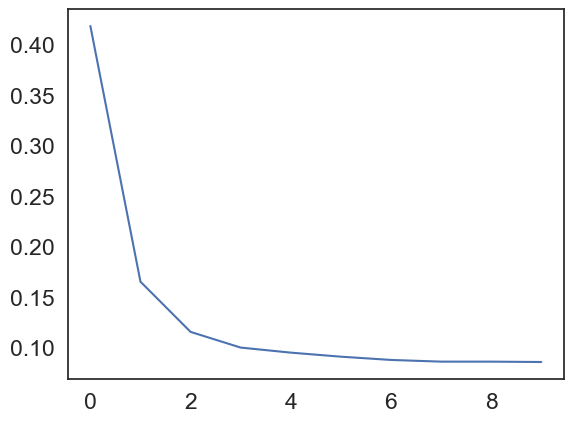

In [83]:
plt.plot(history2b.history['loss'])
#plt.plot(history3.history['loss'])
#plt.plot(history4.history['loss'])
#plt.plot(history5.history['loss'])

# Load

In [ ]:
#import json
#althist_json_file = json.load(open('trainHistoryDictALT_experimental.json', 'r'))
with open('/Users/bradleygay/code/historyALT.json.json', 'rb') as file:
    althistory=pickle.load(file)
with open('/Users/bradleygay/code/trainHistoryDictCH4_experimental', 'rb') as file2:
    ch4history=pickle.load(file2)
with open('/Users/bradleygay/code/trainHistoryDictCO2_experimental', 'rb') as file3:
    co2history=pickle.load(file3)

In [ ]:
# Load Models
from keras.models import model_from_json
from keras.models import load_model
#ALT
# load json file and model
alt_json_file = open('model2_070923_insituALT.json', 'r')
alt_loaded_model_json = alt_json_file.read()
alt_json_file.close()
alt_loaded_model_json = model_from_json(alt_loaded_model_json)
# load weights for new model
alt_loaded_model_json.load_weights("model2_070923_insituALT.h5")
print("Loaded model from disk")
# save and reload
alt_loaded_model_json.save('model2_070923_insituALT.hdf5')
alt_loaded_model_json=load_model('model2_070923_insituALT.hdf5')

#CH4
# load json file and model
ch4_json_file = open('model2_070923_insituCH4.json', 'r')
ch4_loaded_model_json = ch4_json_file.read()
ch4_json_file.close()
ch4_loaded_model_json = model_from_json(ch4_loaded_model_json)
# load weights for new model
ch4_loaded_model_json.load_weights("model2_070923_insituCH4.h5")
print("Loaded model from disk")
# save and reload
ch4_loaded_model_json.save('model2_070923_insituCH4.hdf5')
ch4_loaded_model_json=load_model('model2_070923_insituCH4.hdf5')

#CO2
co2_json_file = open('model2_070923_insituCO2.json', 'r')
co2_loaded_model_json = co2_json_file.read()
co2_json_file.close()
co2_loaded_model_json = model_from_json(co2_loaded_model_json)
# load weights for new model
co2_loaded_model_json.load_weights("model2_070923_insituCO2.h5")
print("Loaded model from disk")
# save and reload
co2_loaded_model_json.save('model2_070923_insituCO2.hdf5')
co2_loaded_model_json=load_model('model2_070923_insituCO2.hdf5')

In [ ]:
#FROM OTHER FILE
########################################################
########################################################
########################################################

In [ ]:
fig,ax = plt.subplots(figsize=(10,6), dpi=1000)
# l1=ax.plot(history2.history['loss'], color='dodgerblue', linestyle='solid', label='ALT Training Loss (cm)')
# l2=ax.plot(history3.history['loss'], color='magenta', linestyle='solid', label='CH4 Flux Training Loss (cm)')
# l3=ax.plot(history4.history['loss'], color='springgreen', linestyle='solid', label='CO2 Flux Training Loss (nmolCH4m-2s-1)')
l1=ax.plot(history2.history['val_loss'], color='dodgerblue', linestyle='solid', label='ALT Validation Loss (cm)')
l2=ax.plot(history3.history['val_loss'], color='magenta', linestyle='solid', label='CH4 Flux Validation Loss (nmolCH4m-2s-1)')
l3=ax.plot(history4.history['val_loss'], color='springgreen', linestyle='solid', label='CO2 Flux Validation Loss (µmolCO2m-2s-1)')
#ax2=ax.twinx();
#ln4=ax2.plot(validPredict, color='coral', linestyle='dotted')

lines = ln1 + ln2 + ln3 #+ ln4 #+ ln5# ln4 + ln5 + ln6# + ln7 + ln8
labs = [line.get_label() for line in lines];
ax.legend(lines, labs, loc='best', fontsize=8)#'lower left', fontsize=8)

ax.grid(linewidth=0.3);
ax.set_xlabel('Epochs', labelpad=8, fontsize=16);
ax.set_ylabel('Training Loss', labelpad=8, fontsize=16)
#ax.set(xticklabels=[])  # remove the tick labels
ax.tick_params(left=False)  # remove the ticks
#plt.ylabel('Active Layer Thickness (cm)')
plt.title('GeoCryoAI In Situ Module | Bidirectional Conv1DLSTM Autoencoder Loss Functions \n ALT, CH4 Flux, and CO2 Flux Simulations (1969-2022)', pad=10)

#plt.xlabel('Year')
#plt.axis([0, 6, 0, 60])
#plt.legend(loc='best')
#plt.show()
#plt.savefig('/Users/bradleygay/Downloads/bilstmae_insitu_CO2_loss.png',dpi=1000)

In [960]:
#reframed_alt.iloc[:,-1]

In [1289]:
fig,ax=plt.subplots(figsize=(10,6), dpi=1000);
lns1=ax.plot(history2.history['mean_squared_error'], color='dodgerblue', linestyle='solid', label='Training, ALT (cm)');
ax2=ax.twinx();
lns2=ax2.plot(history2.history['val_mean_squared_error'], color='tomato', linestyle='solid', label='Validation, ALT (cm)');

lns = lns1+lns2#+lns3+lns4;
labs = [l.get_label() for l in lns];
ax2.legend(lns, labs, loc='best', fontsize=12);

ax.grid(linewidth=0.3);
ax2.grid(linewidth=0.3);
ax.set_xlabel('Full Iterations (epochs)', labelpad=12, fontsize=10);
ax.set_ylabel('Training MSE, Scaled ALT (cm)', labelpad=12, fontsize=10);
ax.tick_params(axis='y', labelcolor='dodgerblue')
ax2.set_ylabel('Validation MSE, Scaled ALT (cm)', labelpad=12, fontsize=10)
ax2.tick_params(axis='y', labelcolor='tomato')
ax.tick_params(left=False)  # remove the ticks
ax2.tick_params(right=False)  # remove the ticks
plt.title('GeoCryoAI Modeling, Cost Function and Validation Loss of ALT | Alaska [1969-2022] \n Number of Thaw Depth Samples/Replicates: 2.441M', pad=15, fontsize=14);
ax.grid(linewidth=0.3);
plt.tight_layout()
plt.savefig('ALTstats_1969-2022_071323.png', dpi=1000)

In [ ]:
fig,ax=plt.subplots(figsize=(10,6), dpi=1000);
lns1=ax.plot(history3.history['mean_squared_error'], color='magenta', linestyle='solid', label='Training, CH4 Flux (nmolCH4m-2s-1)');
ax2=ax.twinx();
lns2=ax2.plot(history3.history['val_mean_squared_error'], color='slateblue', linestyle='solid', label='Validation, CH4 Flux (nmolCH4m-2s-1)');

lns = lns1+lns2#+lns3+lns4;
labs = [l.get_label() for l in lns];
ax2.legend(lns, labs, loc='best', fontsize=12);

ax.grid(linewidth=0.3);
ax2.grid(linewidth=0.3);
ax.set_xlabel('Full Iterations (epochs)', labelpad=12, fontsize=10);
ax.set_ylabel('Training MSE, Scaled Ch4 Flux (nmolCH4m-2s-1)', labelpad=12, fontsize=10);
ax.tick_params(axis='y', labelcolor='magenta')
ax2.set_ylabel('Validation MSE, Scaled CH4 Flux (nmolCH4m-2s-1)', labelpad=12, fontsize=10)
ax2.tick_params(axis='y', labelcolor='slateblue')
ax.tick_params(left=False)  # remove the ticks
ax2.tick_params(right=False)  # remove the ticks
plt.title('GeoCryoAI Modeling, Cost Function and Validation Loss of CH4 Flux | Alaska [2011-2021] \n Number of CH4 Flux Samples/Replicates: 2.083M', pad=15, fontsize=14);
ax.grid(linewidth=0.3);
plt.tight_layout()
#plt.savefig('ALTstats_CNNLSTMSAEmetrics_1969-2022_021323.png', dpi=1000)

In [1293]:
fig,ax=plt.subplots(figsize=(10,6), dpi=1000);
lns1=ax.plot(history5.history['mean_squared_error'], color='midnightblue', linestyle='solid', label='Training, CH4 Flux (nmolCH4m-2s-1)');
ax2=ax.twinx();
lns2=ax2.plot(history5.history['val_mean_squared_error'], color='magenta', linestyle='solid', label='Validation, CH4 Flux (nmolCH4m-2s-1)');

lns = lns1+lns2#+lns3+lns4;
labs = [l.get_label() for l in lns];
ax2.legend(lns, labs, loc='best', fontsize=12);

ax.grid(linewidth=0.3);
ax2.grid(linewidth=0.3);
ax.set_xlabel('Full Iterations (epochs)', labelpad=12, fontsize=10);
ax.set_ylabel('Training MSE, Scaled Ch4 Flux (nmolCH4m-2s-1)', labelpad=12, fontsize=10);
ax.tick_params(axis='y', labelcolor='midnightblue')
ax2.set_ylabel('Validation MSE, Scaled CH4 Flux (nmolCH4m-2s-1)', labelpad=12, fontsize=10)
ax2.tick_params(axis='y', labelcolor='magenta')
ax.tick_params(left=False)  # remove the ticks
ax2.tick_params(right=False)  # remove the ticks
plt.title('GeoCryoAI Modeling, Cost Function and Validation Loss of CH4 Flux | Alaska [2011-2021] \n Number of CH4 Flux Samples/Replicates: 2.083M', pad=15, fontsize=14);
ax.grid(linewidth=0.3);
plt.tight_layout()
plt.savefig('CH4stats_1969-2022_071323.png', dpi=1000)

In [563]:
#plt.plot(reframed_co2.iloc[:,-1]['2006':'2019'].values)
reframed_co2.iloc[:,-1]['2006':'2019']

2006-01-01    377.176000
2006-01-01    375.832000
2006-01-01    376.500000
2006-01-01    377.000000
2006-01-01    376.668000
                 ...    
2019-01-01    414.360631
2019-01-01    414.360631
2019-01-01    414.360631
2019-01-01    414.360631
2019-01-01    414.360631
Name: (CO2_1_2_1, t), Length: 1965628, dtype: float64

In [1294]:
fig,ax=plt.subplots(figsize=(10,6), dpi=1000);
lns1=ax.plot(history4.history['mean_squared_error'], color='indigo', linestyle='solid', label='Training, CO2 Flux (µolCO2m-2s-1)');
ax2=ax.twinx();
lns2=ax2.plot(history4.history['val_mean_squared_error'], color='lime', linestyle='solid', label='Validation, CO2 Flux (µolCO2m-2s-1)');

lns = lns1+lns2#+lns3+lns4;
labs = [l.get_label() for l in lns];
ax2.legend(lns, labs, loc='best', fontsize=12);

ax.grid(linewidth=0.3);
ax2.grid(linewidth=0.3);
ax.set_xlabel('Full Iterations (epochs)', labelpad=12, fontsize=10);
ax.set_ylabel('Training MSE, Scaled CO2 Flux (µolCO2m-2s-1)', labelpad=12, fontsize=10);
ax.tick_params(axis='y', labelcolor='indigo')
ax2.set_ylabel('Validation MSE, Scaled CO2 Flux (µolCO2m-2s-1)', labelpad=12, fontsize=10)
ax2.tick_params(axis='y', labelcolor='lime')
ax.tick_params(left=False)  # remove the ticks
ax2.tick_params(right=False)  # remove the ticks
plt.title('GeoCryoAI Modeling, Cost Function and Validation Loss of CO2 Flux | Alaska [2006-2019] \n Number of CO2 Flux Samples/Replicates: 1.966M', pad=15, fontsize=14);
ax.grid(linewidth=0.3);
plt.tight_layout()
plt.savefig('CO2stats_1969-2022_071323.png', dpi=1000)

In [ ]:
# fig,ax=plt.subplots(figsize=(10,7));
# #lns1=ax.plot(history2.history['loss'], color='dodgerblue', label='Loss, ALT (cm)');
# lns2=ax.plot(history2.history['mean_squared_error'], color='dodgerblue', linestyle='solid', label='RMSE, ALT (cm)');
# ax2=ax.twinx();
# #lns3=ax2.plot(history2.history['val_loss'], color='gold', label='Validation Loss, ALT (cm)');
# lns4=ax2.plot(history2.history['val_mean_squared_error'], color='gold', linestyle='solid', label='Validation RMSE, ALT (cm)');
          
# lns = lns2+lns4; #lns1+lns2+lns3+lns4;
# labs = [l.get_label() for l in lns];
# ax2.legend(lns, labs, loc='best', fontsize=8);

# ax.grid(linewidth=0.3);
# ax.set_xlabel('Full Iterations (epochs)', labelpad=12, fontsize=10);
# ax.set_ylabel('Scaled Depth to Refusal (cm)', labelpad=12, fontsize=10);
# #ax2.set_ylabel('Scaled Depth to Refusal (cm)', labelpad=6, fontsize=9)
# plt.title('Number of Samples/Replicates: 95653', pad=15, fontsize=12, fontweight='ultralight');
# plt.suptitle('Cost Function and Validation Loss from Thaw Depth Modeling, GeoCryoAI Framework in Alaska [1969-2022]', fontsize=14);
# plt.grid(linewidth=0.3);
# #plt.show()
# #plt.savefig('ALTstats_CNNLSTMSAEmetrics_1969-2022_021323.png', dpi=1000)

In [ ]:
score = model.evaluate(X_test_reframed, y_test_reframed, verbose = 1) 

In [ ]:
print('Test MAE:', score[1])
print('Test MSE:', score[2])
print('Test RMSE:', score[3])

In [ ]:
predict = model.predict(X_test_reframed, verbose = 1)

In [ ]:
# fig,ax = plt.subplots(figsize=(10,6), dpi=1000)
# ln1=ax.plot(y_test_reframed.reshape(215137,1), color='magenta', linestyle='solid', label='Observation, Test Set')
# ln2=ax.plot(predict.reshape(215137,1), color='dodgerblue', linestyle='solid', label='Prediction, Test Set')
# #ln3=ax.plot(history.history['mean_absolute_error'], color='springgreen', linestyle='dotted', label='MAE')
# #ln4=ax.plot(history.history['mean_squared_error'], color='springgreen', linestyle='dashed', label='Seward Peninsula')
# #ln4=ax.plot(history.history['root_mean_squared_error'], color='springgreen', linestyle='dashed', label='RMSE')
# #ln5=ax.plot(history.history['val_mean_absolute_error'], color='red', linestyle='dotted', label='Val MAE')
# #ln7=ax.plot(history.history['val_mean_squared_error'], color='red', linestyle='dashed', label='Seward Peninsula')
# #ln6=ax.plot(history.history['val_root_mean_squared_error'], color='red', linestyle='dashed', label='Val RMSE')
# #ln2=ax.plot(sib.iloc[2:,7].replace(-9999,np.nan).dropna()color='springgreen', linestyle='dashed', label='Interior')
# #ln3=ax.plot(sib.iloc[2:,16].replace(-9999,np.nan).dropna(), color='magenta', linestyle='dotted', label='Seward Peninsula')
# #ln4=ax.plot(sib.iloc[2:,39].replace(-9999,np.nan).dropna(), color='dodgerblue', linestyle='dotted', label='Yukon-Kuskokwim Delta')
# #ax2=ax.twinx();
# #ln4=ax2.plot(validPredict, color='coral', linestyle='dotted')

# lines = ln1 + ln2 #+ ln3 + ln4 + ln5 + ln6# + ln7 + ln8
# labs = [line.get_label() for line in lines];
# plt.legend(lines, labs, loc='lower left', fontsize=8)

# ax.grid(linewidth=0.3);
# ax.set_xlabel('Samples, 2003-2021', labelpad=10, fontsize=16);
# ax.set_ylabel('Carbon Dioxide Flux (umolCm2s-1)', labelpad=10, fontsize=16)
# #ax.set(xticklabels=[])  # remove the tick labels
# ax.tick_params(left=False)  # remove the ticks
# #plt.ylabel('Active Layer Thickness (cm)')
# plt.title('GeoCryoAI Modeling, Cost Function and Validation Loss of ALT | Alaska [1969-2022]', pad=15, fontsize=14);
# plt.suptitle('Number of Samples/Replicates, ALT: 2.441M', fontsize=12, fontweight='ultralight');
# #plt.title('GeoCryoAI In Situ Module | Bidirectional LSTM Autoencoder Loss Function \n In Situ Carbon Dioxide Flux Simulations (2003-2021)', pad=10)
# #plt.xlabel('Year')
# #plt.axis([0, 6, 0, 60])
# #plt.legend(loc='best')
# #plt.show()
# plt.savefig('/Users/bradleygay/Downloads/bilstmae_insitu_CO2_loss_predictions_experimental.png',dpi=1000);

In [ ]:
plt.plot(y_testco2_reframed.reshape(215137,1))
plt.plot(predict.reshape(215137,1))
#plt.axis([0, 130000, -2, 5])
plt.show()

In [ ]:
#May need to inverse scale

In [ ]:
########################################################
########################################################
########################################################

In [ ]:
# fig,ax = plt.subplots(figsize=(10,6), dpi=1000)
# #l1=ax.plot(history2.history['loss'], color='dodgerblue', linestyle='solid', label='ALT Training Loss (cm)')
# #l2=ax.plot(history3.history['loss'], color='magenta', linestyle='solid', label='CH4 Flux Training Loss (cm)')
# #l3=ax.plot(history4.history['loss'], color='springgreen', linestyle='solid', label='CO2 Flux Training Loss (nmolCH4m-2s-1)')
# l1=ax.plot(history2.history['val_loss'], color='dodgerblue', linestyle='solid', label='ALT Validation Loss (cm)')
# ax2=ax.twinx();
# l2=ax2.plot(history3.history['val_loss'], color='magenta', linestyle='solid', label='CH4 Flux Validation Loss (nmolCH4m-2s-1)')
# l3=ax2.plot(history4.history['val_loss'], color='springgreen', linestyle='solid', label='CO2 Flux Validation Loss (µmolCO2m-2s-1)')
# #l3=ax.plot(history4.history['loss'], color='springgreen', linestyle='solid', label='CO2 Flux Loss (µmolCO2m-2s-1)')
# #l1=ax.plot(history2.history['val_mean_squared_error'], color='dodgerblue', linestyle='solid', label='ALT Loss (cm)')
# #l2=ax.plot(history3.history['val_mean_squared_error'], color='magenta', linestyle='solid', label='CH4 Flux Loss (nmolCH4m-2s-1)')
# #l3=ax.plot(history4.history['val_mean_squared_error'], color='springgreen', linestyle='solid', label='CO2 Flux Loss (µmolCO2m-2s-1)')
# #ax2=ax.twinx();
# #l2=ax2.plot(althistory['val_mean_squared_error'], color='dodgerblue', linestyle='solid', label='Validation Loss (MSE)')
# #l2=ax2.plot(ch4history['val_mean_squared_error'], color='coral', linestyle='solid', label='Validation Loss (MSE)')
# #l2=ax2.plot(althistory['val_mean_squared_error'], color='coral', linestyle='solid', label='Validation Loss (MSE)')

# lns = l1+l2 +l3
# labs = [l.get_label() for l in lns];
# #ax2.legend(lns, labs, loc='best', fontsize=8);
# ax.legend(lns, labs, loc='best', fontsize=12);


# ax.set_xlabel('Full Iterations (epochs)', labelpad=15, fontsize=12);
# #ax.set_ylabel('Training Loss (units)', labelpad=15, fontsize=12)
# ax.set_ylabel('Validation Loss (units)', labelpad=15, fontsize=12)
# ax2.set_ylabel('Validation Loss (units)', labelpad=15, fontsize=10)
# #ax2.set_ylabel('Validation Loss, MSE (cm)', labelpad=15, fontsize=10)
# #ax.set_ylabel('Training Loss (units)', labelpad=15, fontsize=12)
# #ax2.set_ylabel('Validation Loss, MSE (nmolCH4m2s-1)', labelpad=15, fontsize=10)
# #ax.set_ylabel('Loss, MSE (µmolCO2m2s-1)', labelpad=15, fontsize=10)
# #ax2.set_ylabel('Validation Loss, MSE (µmolCO2m2s-1)', labelpad=15, fontsize=10)
# #ax.set(xticklabels=[])  # remove the tick labels
# ax.tick_params(left=False)  # remove the ticks
# ax2.tick_params(left=False)  # remove the ticks
# #plt.ylabel('Active Layer Thickness (cm)')
# ax.grid(linewidth=0.3);
# plt.title('GeoCryoAI Modeling, Cost Function and Validation Loss of ALT | Alaska [1969-2022] \n Number of Samples/Replicates, ALT: 2.441M', pad=15, fontsize=14);
# #plt.suptitle('Number of Samples/Replicates, ALT: 2.441M', fontsize=12, fontweight='ultralight');
# #plt.title('GeoCryoAI Training and Validation Loss | In Situ Thaw Depth Simulations [1969-2022]', pad=15, fontsize=14)
# #plt.title('GeoCryoAI Model Simulations | Cost Functions \n ALT, CH4 Flux, and CO2 Flux [1969-2022]', pad=15, fontsize=14)
# #plt.title('GeoCryoAI Training and Validation Loss | In Situ CO2 Flux Simulations [2006-2019]', pad=15, fontsize=14)
# #plt.xlabel('Year')
# #plt.axis([0, 6, 0, 60])
# #plt.grid(linewidth=0.3);
# #plt.show()
# #plt.savefig('/Users/bradleygay/Downloads/bilstmae_insitu_ALT_loss.png',dpi=1000)

In [ ]:
alt_model=alt_loaded_model_json
ch4_model=ch4_loaded_model_json
co2_model=co2_loaded_model_json

In [ ]:
loss_function = 'mean_squared_error'
alt_metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscaltref.shape[1],))]
alt_model.compile(optimizer = tf.keras.optimizers.legacy.RMSprop(learning_rate = 0.0001, **{"clipvalue" : 1000}),
                  loss = loss_function, metrics = alt_metrics)
ch4_metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscch4ref.shape[1],))]
ch4_model.compile(optimizer = tf.keras.optimizers.legacy.RMSprop(learning_rate = 0.001, **{"clipvalue" : 1000}),
                  loss = loss_function, metrics = ch4_metrics)
co2_metrics=['mean_squared_error', 'mean_absolute_error', RSquare().build(input_shape = (trainyscco2ref.shape[1],))]
co2_model.compile(optimizer = tf.keras.optimizers.legacy.RMSprop(learning_rate = 0.0001, **{"clipvalue" : 1000}),
                  loss = loss_function, metrics = co2_metrics)

In [ ]:
#score1=alt_model.evaluate(testXscaltref,testyscaltref,verbose=1)
#score2=co2_model.evaluate(testXscco2ref,testyscco2ref,verbose=1)
score3=ch4_model.evaluate(testXscch4ref,testyscch4ref,verbose=1)

In [566]:
score_2, score_3b, score_4#score_3

([5.851143836975098, 5.851143836975098, 1.760823369026184],
 [0.6170855760574341, 0.6170855760574341, 0.5118510127067566],
 [0.24705152213573456, 0.24705152213573456, 0.4858781397342682])

In [ ]:
#ALT
print('Test MAE:', score1[1])
print('Test MSE:', score1[2])
print('Test RMSE:', np.sqrt(score1[2]))

In [ ]:
#CO2
print('Test MAE:', score2[1])
print('Test MSE:', score2[2])
print('Test RMSE:', np.sqrt(score2[2]))

In [ ]:
#CH4
print('Test MAE:', score3[1])
print('Test MSE:', score3[2])
print('Test RMSE:', np.sqrt(score3[2]))

In [ ]:
trainyscaltpred = alt_model.predict(trainXscaltref)
validyscaltpred = alt_model.predict(validXscaltref)
testyscaltpred = alt_model.predict(testXscaltref)

In [ ]:
with open('trainyscaltpred', 'wb') as file_theta:
    pickle.dump(trainyscaltpred, file_theta)
with open('validyscaltpred', 'wb') as file_alpha:
    pickle.dump(validyscaltpred, file_alpha)
with open('testyscaltpred', 'wb') as file_zeta:
    pickle.dump(testyscaltpred, file_zeta)

with open('/Users/bradleygay/code/trainyscaltpred', 'rb') as file_theta:
    trainyscaltpred=pickle.load(file_theta)
with open('/Users/bradleygay/code/validyscaltpred', 'rb') as file_alpha:
    validyscaltpred=pickle.load(file_alpha)
with open('/Users/bradleygay/code/testyscaltpred', 'rb') as file_zeta:
    testyscaltpred=pickle.load(file_zeta)

In [ ]:
trainyscco2pred = co2_model.predict(trainXscco2ref)
validyscco2pred = co2_model.predict(validXscco2ref)
testyscco2pred = co2_model.predict(testXscco2ref)

In [ ]:
with open('trainyscco2pred', 'wb') as file_a:
    pickle.dump(trainyscco2pred, file_a)
with open('validyscco2pred', 'wb') as file_b:
    pickle.dump(validyscco2pred, file_b)
with open('testyscco2pred', 'wb') as file_c:
    pickle.dump(testyscco2pred, file_c)

with open('/Users/bradleygay/code/trainyscco2pred', 'rb') as file_a:
    trainyscco2pred=pickle.load(file_a)
with open('/Users/bradleygay/code/validyscco2pred', 'rb') as file_b:
    validyscco2pred=pickle.load(file_b)
with open('/Users/bradleygay/code/testyscco2pred', 'rb') as file_c:
    testyscco2pred=pickle.load(file_c)

In [ ]:
trainyscch4pred = ch4_model.predict(trainXscch4ref)
validyscch4pred = ch4_model.predict(validXscch4ref)
testyscch4pred = ch4_model.predict(testXscch4ref)

In [ ]:
with open('trainyscch4pred', 'wb') as file_i:
    pickle.dump(trainyscch4pred, file_i)
with open('validyscch4pred', 'wb') as file_ii:
    pickle.dump(validyscch4pred, file_ii)
with open('testyscch4pred', 'wb') as file_iii:
    pickle.dump(testyscch4pred, file_iii)

with open('/Users/bradleygay/code/trainyscch4pred', 'rb') as file_i:
    trainyscch4pred=pickle.load(file_i)
with open('/Users/bradleygay/code/validyscch4pred', 'rb') as file_ii:
    validyscch4pred=pickle.load(file_ii)
with open('/Users/bradleygay/code/testyscch4pred', 'rb') as file_iii:
    testyscch4pred=pickle.load(file_iii)

In [ ]:
#model2 == ALT (history2)
#model3b == CH4 (history5)
#model4 == CO2 (history4)

### Archive

In [1000]:
#altlist=[]
#altlist=np.append(altlist,p)
#altlist=np.append(altlist,pp)
altlist=np.append(altlist,ppp)

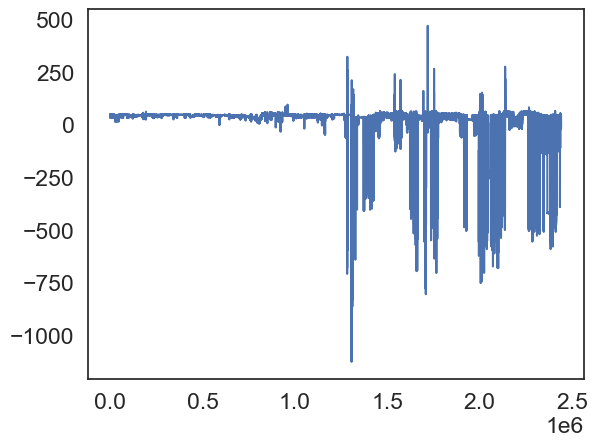

In [1007]:
plt.plot(yscaleralt.inverse_transform(altlist.reshape(-1,1)))

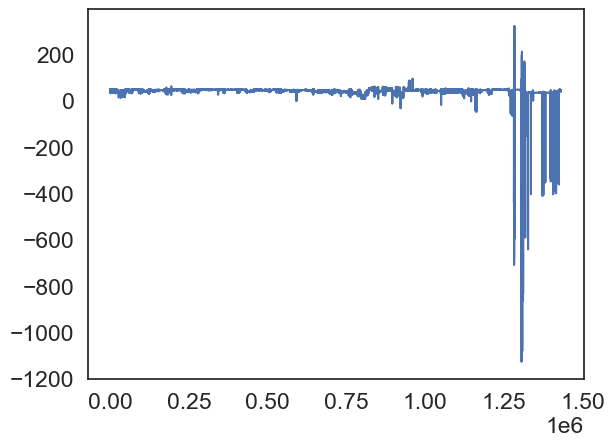

In [994]:
plt.plot(yscaleralt.inverse_transform(p.reshape(1432318,1)))

In [ ]:
data_val = X_scaler.fit_transform(df.tail(48))
   val_rescaled = data_val.reshape(1, data_val.shape[0], data_val.shape[1])
 pred = lstm_model.predict(val_rescaled)
 pred_Inverse = Y_scaler.inverse_transform(pred)
 pred_Inverse 

In [987]:
type(p.reshape(1432318, 1))

numpy.ndarray

In [988]:
type(testXscaltref.reshape((testXscaltref.shape[0], testXscaltref.shape[2])))

numpy.ndarray

In [ ]:
# make a prediction
yhat = model2.predict(testXscalt)
test_X = testXscalt.reshape((test_X.shape[0], test_X.shape[2]))
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

In [591]:
trainXaltdf=pd.DataFrame(trainXalt).to_numpy().reshape(1432318, 1, 273)

In [594]:
#y_pred = model2.predict(trainXaltdfres)
y_pred_scaled = model2.predict(testXscaltref)

6724/6724 [==============================] - 130s 19ms/step


In [596]:
y_pred.shape

(1432318, 1, 1)

In [599]:
y_pred_scaled.shape

(215137, 1, 1)

In [607]:
testXalt.shape

(215137, 273)

In [624]:
testyalt.iloc[:,0]

2021-01-01    83.0
2021-01-01    83.0
2021-01-01    83.0
2021-01-01    83.0
2021-01-01    83.0
              ... 
2022-01-01    32.0
2022-01-01    32.0
2022-01-01    32.0
2022-01-01    32.0
2022-01-01    32.0
Name: (ALT, t), Length: 215137, dtype: float64

In [655]:
testyscaltpd=pd.DataFrame(testyscalt)
testyscaltpd.index=testyalt.iloc[:,0].index
testyscaltpd.index=pd.to_datetime(testyscaltpd.index, format='%Y')
testyscaltpd.index.name = None

In [678]:
#testyscaltpd.to_numpy().reshape(215137,1,1)

In [670]:
testyscaltpd.columns=[testyalt.iloc[:,-1].name]

In [741]:
testyscaltpd

,"(ALT, t)"
2021-01-01,3.589856
2021-01-01,3.589856
2021-01-01,3.589856
2021-01-01,3.589856
2021-01-01,3.589856
...,...
2022-01-01,-1.016606
2022-01-01,-1.016606
2022-01-01,-1.016606
2022-01-01,-1.016606


In [684]:
validyscaltpd=pd.DataFrame(validyscalt)
validyscaltpd.index=validyalt.iloc[:,0].index
validyscaltpd.index=pd.to_datetime(validyscaltpd.index, format='%Y')
validyscaltpd.index.name = None

In [677]:
#validyscaltpd.to_numpy().reshape(793782,1,1)

In [686]:
validyscaltpd.columns=[validyalt.iloc[:,-1].name]

In [687]:
validyscaltpd

,"(ALT, t)"
2018-01-01,-0.926283
2018-01-01,-0.926283
2018-01-01,-0.926283
2018-01-01,-0.926283
2018-01-01,-0.926283
...,...
2020-01-01,3.589856
2020-01-01,3.589856
2020-01-01,3.589856
2020-01-01,3.589856


In [690]:
trainyscaltpd=pd.DataFrame(trainyscalt)
trainyscaltpd.index=trainyalt.iloc[:,0].index
trainyscaltpd.index=pd.to_datetime(trainyscaltpd.index, format='%Y')
trainyscaltpd.index.name = None

In [691]:
trainyscaltpd.columns=[trainyalt.iloc[:,-1].name]

In [692]:
trainyscaltpd

,"(ALT, t)"
1970-01-01,1.602755
1970-01-01,1.422109
1970-01-01,0.880173
1971-01-01,1.693078
1971-01-01,1.602755
...,...
2017-01-01,-0.926283
2017-01-01,-0.926283
2017-01-01,-0.926283
2017-01-01,-0.926283


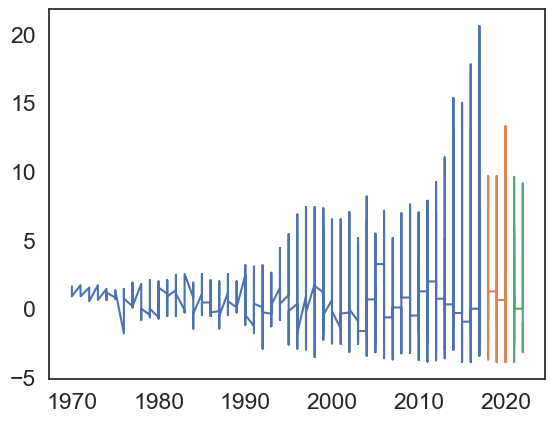

In [693]:
plt.plot(trainyscaltpd)
plt.plot(validyscaltpd)
plt.plot(testyscaltpd)

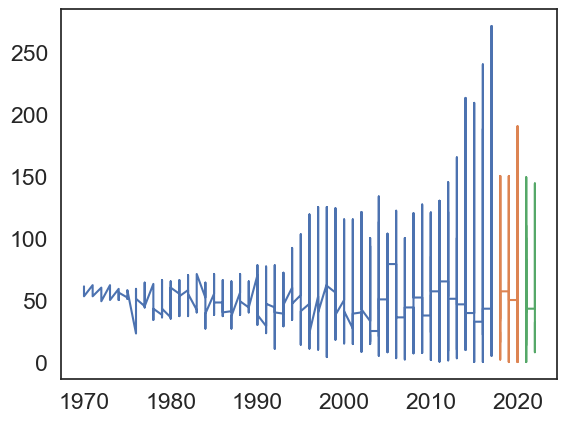

In [694]:
plt.plot(trainyalt)
plt.plot(validyalt)
plt.plot(testyalt)

In [749]:
#trainXalt

In [726]:
#testyscaltpd.to_numpy().reshape(215137,1,1)
#testyscalt.reshape(215137,1,1)
t=trainXalt.iloc[:,-1].resample('Y').mean()
v=validXalt.iloc[:,-1].resample('Y').mean()
r=testXalt.iloc[:,-1].resample('Y').mean()#.reshape(215137,1, 273)

In [757]:
trainXalt.iloc[:,-183]

1970-01-01    50.0
1970-01-01    55.0
1970-01-01    52.0
1971-01-01    61.0
1971-01-01    59.0
              ... 
2017-01-01    33.0
2017-01-01    33.0
2017-01-01    33.0
2017-01-01    33.0
2017-01-01    33.0
Name: (ALT, t-3), Length: 1432318, dtype: float64

In [754]:
t2=trainXalt.iloc[:,-92].resample('Y').mean()
v2=validXalt.iloc[:,-92].resample('Y').mean()
r2=testXalt.iloc[:,-92].resample('Y').mean()#.reshape(215137,1, 273)

In [758]:
t3=trainXalt.iloc[:,-183].resample('Y').mean()
v3=validXalt.iloc[:,-183].resample('Y').mean()
r3=testXalt.iloc[:,-183].resample('Y').mean()#.reshape(215137,1, 273)

In [731]:
yup=[]
yup=np.append(yup,t.values)
yup=np.append(yup,v.values)
yup=np.append(yup,r.values)

In [759]:
yup2=[]
yup2=np.append(yup2,t2.values)
yup2=np.append(yup2,v2.values)
yup2=np.append(yup2,r2.values)

In [760]:
yup3=[]
yup3=np.append(yup3,t3.values)
yup3=np.append(yup3,v3.values)
yup3=np.append(yup3,r3.values)

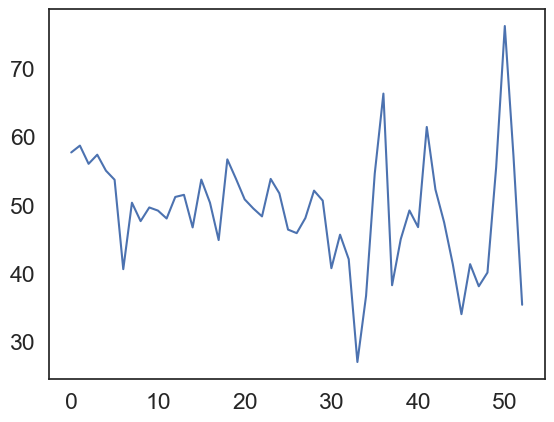

In [775]:
plt.plot(reframed_alt.iloc[:,-1].resample('Y').mean().values)

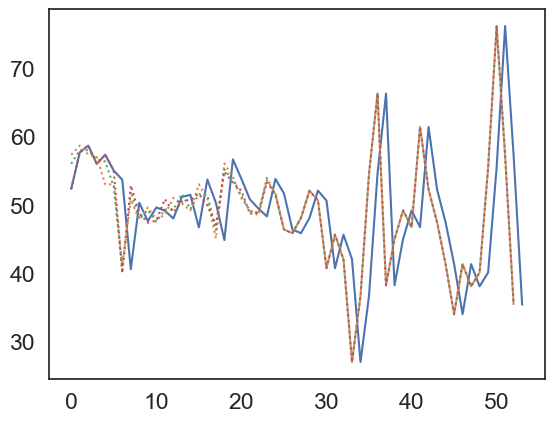

In [777]:
plt.plot(df['ALT'].resample('Y').mean().values)
#plt.plot(reframed_alt.iloc[:,-1].resample('Y').mean().values)
plt.plot(yup, linestyle='dotted')
plt.plot(yup2, linestyle='dotted')
plt.plot(yup3, linestyle='dotted')
plt.show()

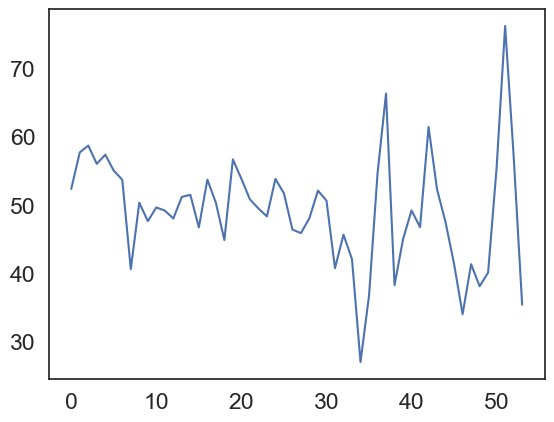

In [766]:
plt.plot(df['ALT'].resample('Y').mean().values)

In [ ]:
plt.plot(yup, linestyle='dotted')
plt.plot(yup2, linestyle='dotted')
plt.plot(yup3, linestyle='dotted')

In [ ]:
#trainXaltdfres=pd.DataFrame(trainXalt).to_numpy().reshape(1432318, 1, 273)

### ALT

In [1038]:
trainXscalt.shape

(1432318, 273)

In [1030]:
trainXscaltdfres=pd.DataFrame(trainXscalt).to_numpy().reshape(1432318, 1, 273)

In [1032]:
trainXscaltdfres.shape

(1432318, 1, 273)

In [ ]:
#p=model2.predict(trainXaltdfres)

In [1033]:
p=model2.predict(trainXscaltdfres)

44760/44760 [==============================] - 929s 21ms/step


In [1035]:
p.shape

(1432318, 1, 1)

In [827]:
# plt.plot(trainXalt.to_numpy().reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXalt.to_numpy().reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXalt.to_numpy().reshape(215137, 1, 273)[:,-1,-1])
# plt.plot(trainXscalt.reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXscalt.reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXscalt.reshape(215137, 1, 273)[:,-1,-1])

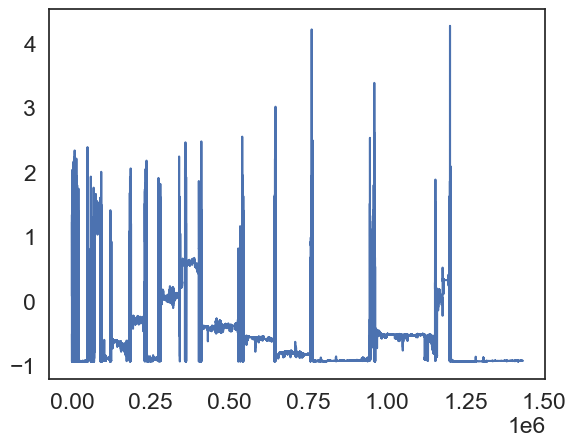

In [1036]:
plt.plot(p.reshape(1432318,1))
plt.show()

In [1037]:
validXscalt.shape

(793782, 273)

In [1039]:
validXscaltdfres=pd.DataFrame(validXscalt).to_numpy().reshape(793782, 1, 273)

In [1040]:
validXscaltdfres.shape

(793782, 1, 273)

In [1041]:
pp=model2.predict(validXscaltdfres)

24806/24806 [==============================] - 482s 19ms/step


In [1042]:
pp.shape

(793782, 1, 1)

In [827]:
# plt.plot(trainXalt.to_numpy().reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXalt.to_numpy().reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXalt.to_numpy().reshape(215137, 1, 273)[:,-1,-1])
# plt.plot(trainXscalt.reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXscalt.reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXscalt.reshape(215137, 1, 273)[:,-1,-1])

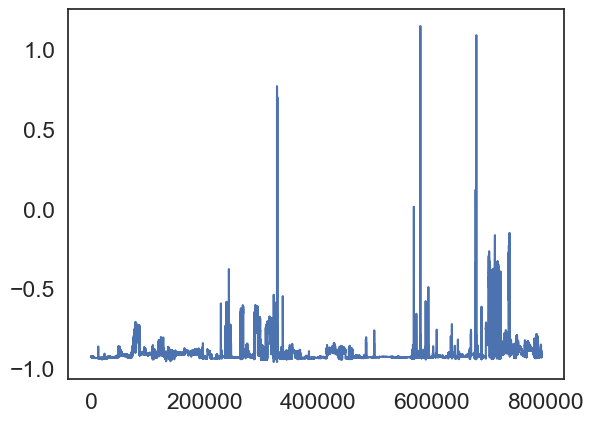

In [1044]:
plt.plot(pp.reshape(793782,1))
plt.show()

In [1050]:
testXscalt.shape

(215137, 273)

In [1051]:
testXscaltdfres=pd.DataFrame(testXscalt).to_numpy().reshape(215137, 1, 273)

In [1052]:
testXscaltdfres.shape

(215137, 1, 273)

In [1053]:
ppp=model2.predict(testXscaltdfres)

6724/6724 [==============================] - 131s 20ms/step


In [1055]:
ppp.shape

(215137, 1, 1)

In [827]:
# plt.plot(trainXalt.to_numpy().reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXalt.to_numpy().reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXalt.to_numpy().reshape(215137, 1, 273)[:,-1,-1])
# plt.plot(trainXscalt.reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXscalt.reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXscalt.reshape(215137, 1, 273)[:,-1,-1])

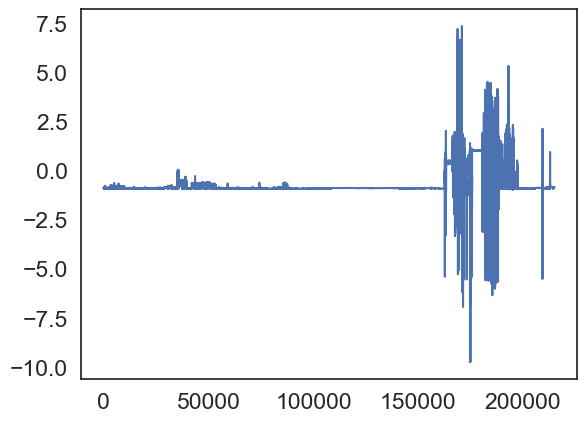

In [1056]:
plt.plot(ppp.reshape(215137,1))
plt.show()

In [1057]:
arr=[]
arr=np.append(arr,p.reshape(1432318,))
arr=np.append(arr,pp.reshape(793782,))
arr=np.append(arr,ppp.reshape(215137,))

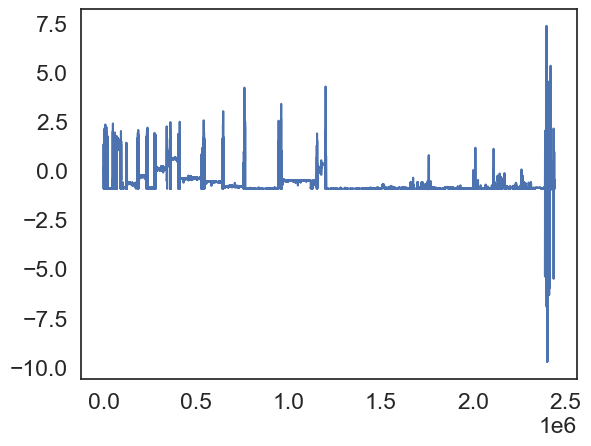

In [1058]:
plt.plot(arr)

In [1065]:
arr2=[]
arr2=np.append(arr2,trainyalt.values.reshape(1432318,))
arr2=np.append(arr2,validyalt.values.reshape(793782,))
arr2=np.append(arr2,testyalt.values.reshape(215137,))

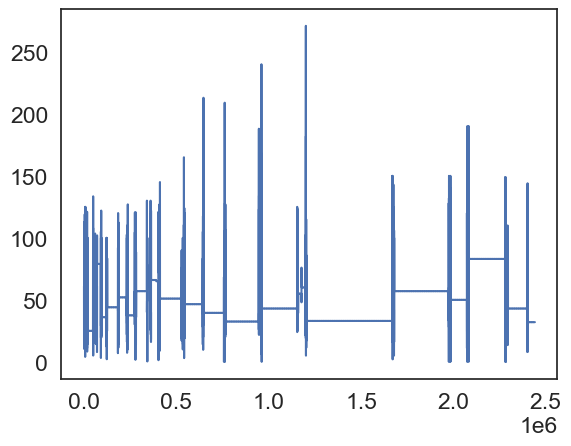

In [1067]:
plt.plot(arr2)

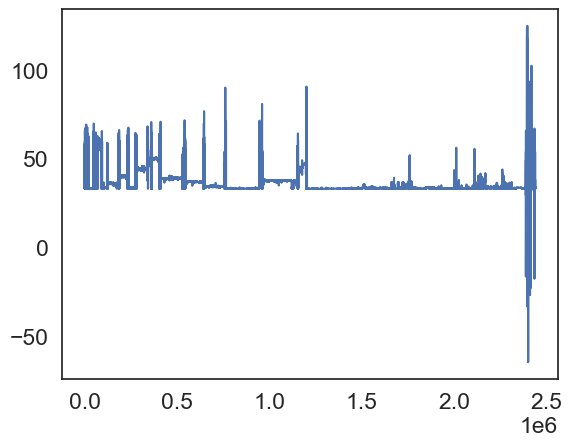

In [1073]:
plt.plot(yscaleralt.inverse_transform(arr.reshape(2441237,1)))

In [1099]:
2441237-215137
#testXscalt.shape

2226100

In [1273]:
arr2.shape

(2441237,)

In [1282]:
fig,ax=plt.subplots(figsize=(10,6), dpi=1000);
lns1=ax.plot(arr2.reshape(2441237,1), color='dodgerblue', linestyle='solid', label='Thaw Depth Observations, ALT (cm)');
#ax2=ax.twinx();
lns2=ax.plot(yscaleralt.inverse_transform(arr.reshape(2441237,1)), color='tomato', alpha=0.5, linestyle='solid', label='Thaw Depth Predictions, ALT (cm)');

lns = lns1+lns2#+lns3+lns4;
labs = [l.get_label() for l in lns];
ax.legend(lns, labs, loc='best', fontsize=12);

ax.grid(linewidth=0.3);
#ax2.grid(linewidth=0.3);
ax.set_xlabel('Full Iterations (epochs)', labelpad=12, fontsize=10);
ax.set_ylabel('Active Layer Thickness (cm)', labelpad=12, fontsize=10);
#ax.tick_params(axis='y', labelcolor='springgreen')
#ax2.set_ylabel('Validation MSE, Scaled CO2 Flux (µolCO2m-2s-1)', labelpad=12, fontsize=10)
#ax2.tick_params(axis='y', labelcolor='yellowgreen')
ax.tick_params(left=False)  # remove the ticks
#ax2.tick_params(right=False, labelright=False)  # remove the ticks
plt.title('GeoCryoAI Modeling, ALT Observations v. Predictions | Alaska [1969-2022] \n Number of ALT Samples/Replicates: 2.441M', pad=15, fontsize=14);
ax.grid(linewidth=0.3);
plt.axis([0, 2441237, 0, 300])
#plt.axis([2226100, 2441237, 0, 200])
plt.tight_layout()
plt.savefig('ALT_ObsVPred_1969-2022_071323.svg', dpi=1000)
plt.savefig('ALT_ObsVPred_1969-2022_071323.png', dpi=1000)

### CO2

In [1114]:
trainXscco2.shape

(1432318, 273)

In [1115]:
trainXscco2dfres=pd.DataFrame(trainXscco2).to_numpy().reshape(1432318, 1, 273)

In [1116]:
trainXscco2dfres.shape

(1432318, 1, 273)

In [ ]:
#p=model2.predict(trainXaltdfres)

In [1117]:
q=model4.predict(trainXscco2dfres)

44760/44760 [==============================] - 950s 21ms/step


In [1120]:
q.shape

(1432318, 1, 1)

In [827]:
# plt.plot(trainXalt.to_numpy().reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXalt.to_numpy().reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXalt.to_numpy().reshape(215137, 1, 273)[:,-1,-1])
# plt.plot(trainXscalt.reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXscalt.reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXscalt.reshape(215137, 1, 273)[:,-1,-1])

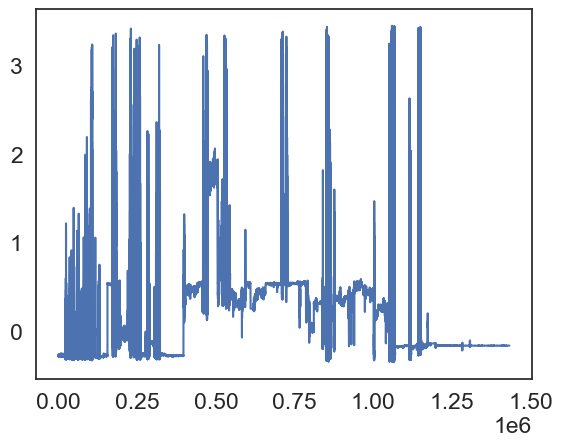

In [1121]:
plt.plot(q.reshape(1432318,1))
plt.show()

In [1122]:
validXscco2.shape

(793782, 273)

In [1123]:
validXscco2dfres=pd.DataFrame(validXscco2).to_numpy().reshape(793782, 1, 273)

In [1124]:
validXscco2dfres.shape

(793782, 1, 273)

In [1125]:
qq=model4.predict(validXscco2dfres)

24806/24806 [==============================] - 556s 22ms/step


In [1127]:
qq.shape

(793782, 1, 1)

In [827]:
# plt.plot(trainXalt.to_numpy().reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXalt.to_numpy().reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXalt.to_numpy().reshape(215137, 1, 273)[:,-1,-1])
# plt.plot(trainXscalt.reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXscalt.reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXscalt.reshape(215137, 1, 273)[:,-1,-1])

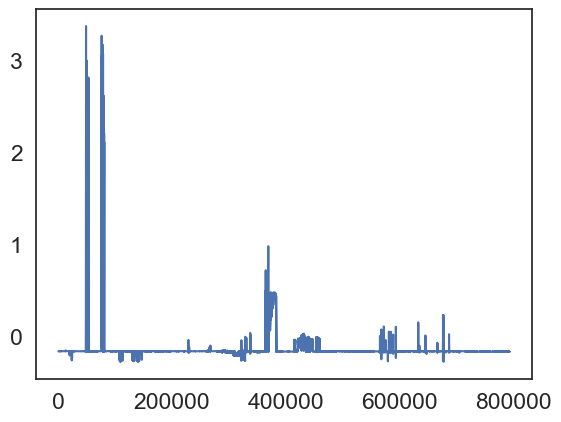

In [1128]:
plt.plot(qq.reshape(793782,1))
plt.show()

In [1129]:
testXscco2.shape

(215137, 273)

In [1130]:
testXscco2dfres=pd.DataFrame(testXscco2).to_numpy().reshape(215137, 1, 273)

In [1131]:
testXscco2dfres.shape

(215137, 1, 273)

In [1132]:
qqq=model4.predict(testXscco2dfres)

6724/6724 [==============================] - 165s 25ms/step


In [1134]:
qqq.shape

(215137, 1, 1)

In [827]:
# plt.plot(trainXalt.to_numpy().reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXalt.to_numpy().reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXalt.to_numpy().reshape(215137, 1, 273)[:,-1,-1])
# plt.plot(trainXscalt.reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXscalt.reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXscalt.reshape(215137, 1, 273)[:,-1,-1])

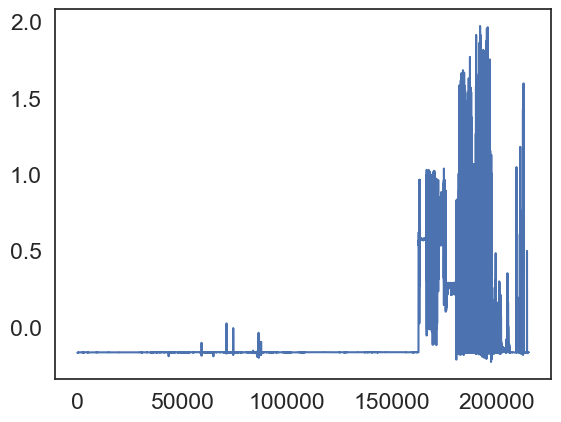

In [1135]:
plt.plot(qqq.reshape(215137,1))
plt.show()

In [1136]:
arr3=[]
arr3=np.append(arr3,q.reshape(1432318,))
arr3=np.append(arr3,qq.reshape(793782,))
arr3=np.append(arr3,qqq.reshape(215137,))

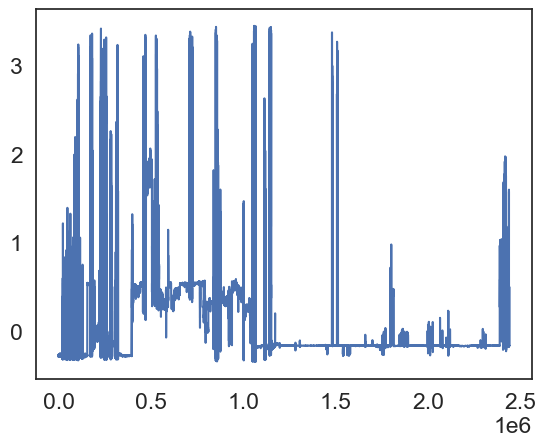

In [1137]:
plt.plot(arr3)

In [1138]:
arr4=[]
arr4=np.append(arr4,trainyco2.values.reshape(1432318,))
arr4=np.append(arr4,validyco2.values.reshape(793782,))
arr4=np.append(arr4,testyco2.values.reshape(215137,))

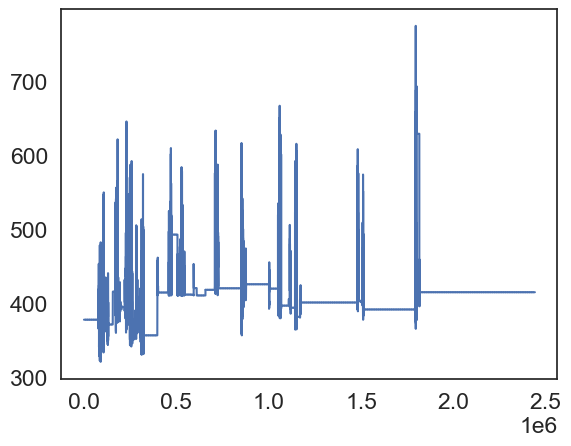

In [1139]:
plt.plot(arr4)

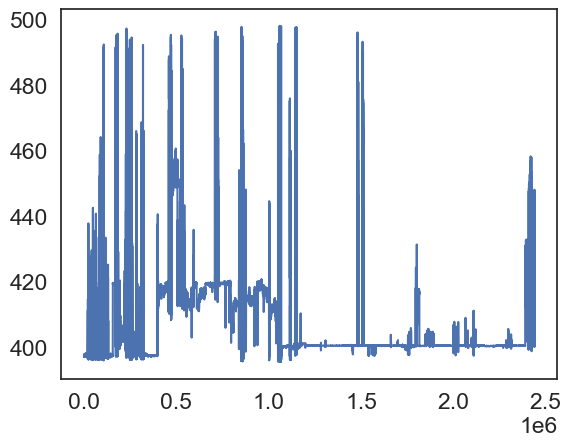

In [1140]:
plt.plot(yscalerco2.inverse_transform(arr3.reshape(2441237,1)))

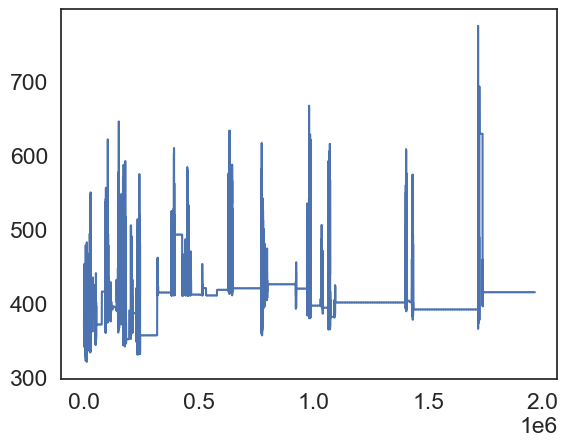

In [1177]:
#reframed_co2.iloc[:,-1].name
#('CO2_1_2_1', 't')
#reframed_co2.iloc[:,-1]['2006':'2019']
#reframed_co2.shape
#2441237-1965628
#78115:2043743
plt.plot(reframed_co2.iloc[78115:2043743,-1].values)#['2005':'2019']
#reframed_co2.iloc[:,-1][:'2019']

In [1284]:
fig,ax=plt.subplots(figsize=(10,6), dpi=1000);
lns1=ax.plot(arr4.reshape(2441237,1), color='indigo', linestyle='solid', label='Flux Observations, CO2 (µmolCO2m-2s-1)');
ax2=ax.twinx();
lns2=ax2.plot(yscalerco2.inverse_transform(arr3.reshape(2441237,1)), alpha=0.5, color='lime', linestyle='solid', label='Flux Predictions, CO2 (µmolCO2m-2s-1)');

lns = lns1+lns2#+lns3+lns4;
labs = [l.get_label() for l in lns];
ax.legend(lns, labs, loc='upper right', fontsize=12);

ax.grid(linewidth=0.3);
#ax2.grid(linewidth=0.3);
ax.set_xlabel('Full Iterations (epochs)', labelpad=12, fontsize=10);
ax.set_ylabel('Carbon Dioxide Flux (µmolCO2m-2s-1)', labelpad=12, fontsize=10);
#ax.tick_params(axis='y', labelcolor='springgreen')
#ax2.set_ylabel('Validation MSE, Scaled CO2 Flux (µolCO2m-2s-1)', labelpad=12, fontsize=10)
#ax2.tick_params(axis='y', labelcolor='yellowgreen')
ax.tick_params(left=False, labelright=False)  # remove the ticks
ax2.tick_params(right=False, labelright=False)  # remove the ticks
plt.title('GeoCryoAI Modeling, CO2 Flux Observations v. Predictions | Alaska [2006-2019] \n Number of CO2 Flux \
Samples/Replicates: 1.966M', pad=15, fontsize=14);
ax.grid(linewidth=0.3);
#plt.axis([78115, 2043743, 0, 800])
#plt.axis([2226100, 2441237, 0, 200])
plt.tight_layout()
plt.savefig('CO2_ObsVPred_2006-2019_071323.svg', dpi=1000)
plt.savefig('CO2_ObsVPred_2006-2019_071323.png', dpi=1000)

### CH4

In [1180]:
trainXscch4.shape

(1432318, 273)

In [1181]:
trainXscch4dfres=pd.DataFrame(trainXscch4).to_numpy().reshape(1432318, 1, 273)

In [1182]:
trainXscch4dfres.shape

(1432318, 1, 273)

In [ ]:
#p=model2.predict(trainXaltdfres)

In [1183]:
o=model3b.predict(trainXscch4dfres)

44760/44760 [==============================] - 921s 21ms/step


In [1184]:
o.shape

(1432318, 1, 1)

In [1185]:
# plt.plot(trainXalt.to_numpy().reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXalt.to_numpy().reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXalt.to_numpy().reshape(215137, 1, 273)[:,-1,-1])
# plt.plot(trainXscalt.reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXscalt.reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXscalt.reshape(215137, 1, 273)[:,-1,-1])

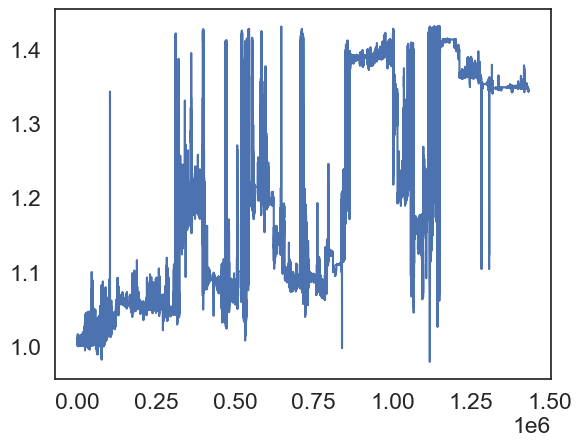

In [1186]:
plt.plot(o.reshape(1432318,1))
plt.show()

In [1187]:
validXscch4.shape

(793782, 273)

In [1188]:
validXscch4dfres=pd.DataFrame(validXscch4).to_numpy().reshape(793782, 1, 273)

In [1189]:
validXscch4dfres.shape

(793782, 1, 273)

In [1190]:
oo=model3b.predict(validXscch4dfres)

24806/24806 [==============================] - 505s 20ms/step


In [1192]:
oo.shape

(793782, 1, 1)

In [827]:
# plt.plot(trainXalt.to_numpy().reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXalt.to_numpy().reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXalt.to_numpy().reshape(215137, 1, 273)[:,-1,-1])
# plt.plot(trainXscalt.reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXscalt.reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXscalt.reshape(215137, 1, 273)[:,-1,-1])

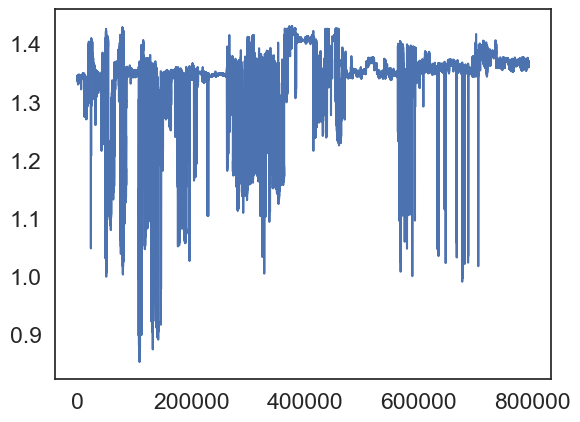

In [1193]:
plt.plot(oo.reshape(793782,1))
plt.show()

In [1194]:
testXscch4.shape

(215137, 273)

In [1195]:
testXscch4dfres=pd.DataFrame(testXscch4).to_numpy().reshape(215137, 1, 273)

In [1196]:
testXscch4dfres.shape

(215137, 1, 273)

In [1197]:
ooo=model3b.predict(testXscch4dfres)

6724/6724 [==============================] - 142s 21ms/step


In [1199]:
ooo.shape

(215137, 1, 1)

In [827]:
# plt.plot(trainXalt.to_numpy().reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXalt.to_numpy().reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXalt.to_numpy().reshape(215137, 1, 273)[:,-1,-1])
# plt.plot(trainXscalt.reshape(1432318, 1, 273)[:,-1,-1])
# plt.plot(validXscalt.reshape(793782, 1, 273)[:,-1,-1])
# plt.plot(testXscalt.reshape(215137, 1, 273)[:,-1,-1])

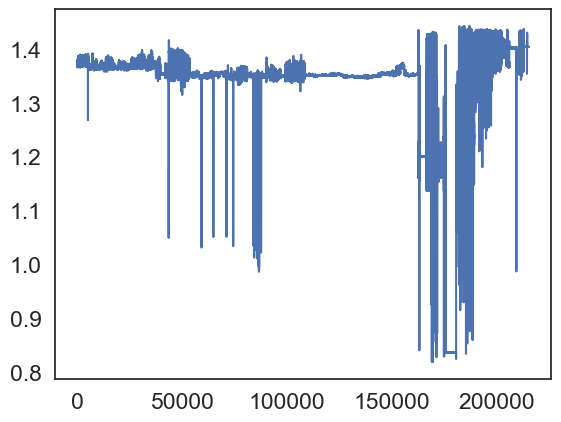

In [1200]:
plt.plot(ooo.reshape(215137,1))
plt.show()

In [1201]:
arr5=[]
arr5=np.append(arr5,o.reshape(1432318,))
arr5=np.append(arr5,oo.reshape(793782,))
arr5=np.append(arr5,ooo.reshape(215137,))

In [1227]:
arr5.shape

(2441237,)

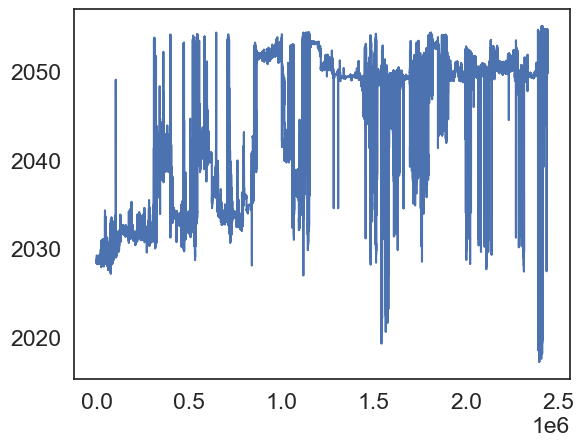

In [1228]:
plt.plot(yscalerch4.inverse_transform(arr5.reshape(2441237,1)))

In [1203]:
arr6=[]
arr6=np.append(arr6,trainych4.values.reshape(1432318,))
arr6=np.append(arr6,validych4.values.reshape(793782,))
arr6=np.append(arr6,testych4.values.reshape(215137,))

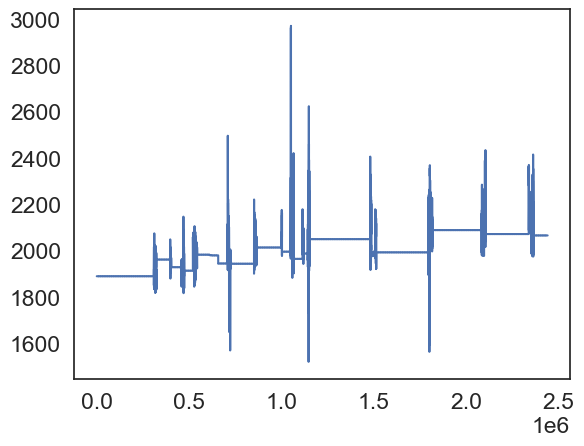

In [1204]:
plt.plot(arr6)

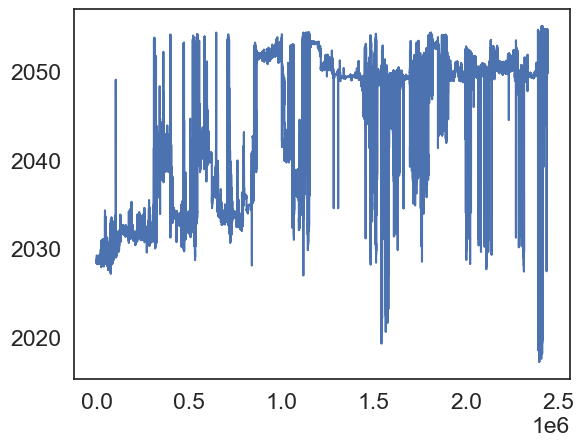

In [1205]:
plt.plot(yscalerch4.inverse_transform(arr5.reshape(2441237,1)))

In [1208]:
#reframed_ch4.iloc[:,-1].name
#('CH4_1_1_2', 't')
#reframed_ch4.iloc[:,-1]['2011':'2021']#2.083M
#reframed_ch4.iloc[:,-1][:'2021']
#reframed_ch4.iloc[:,-1][:'2021']
#reframed_ch4.iloc[:304966,-1]
reframed_ch4.iloc[304966:2387849,-1]

(2441237, 274)

In [1259]:
#arr6.reshape(2441237,1)

In [1285]:
fig,ax=plt.subplots(figsize=(10,6), dpi=1000);
lns1=ax.plot(arr6.reshape(2441237,1), color='midnightblue', linestyle='solid', label='Flux Observations, CH4 (nmolCO2m-2s-1)');
ax2=ax.twinx();
lns2=ax2.plot(yscalerch4.inverse_transform(arr5.reshape(2441237,1)), color='magenta', alpha=0.5, linestyle='solid', label='Flux Predictions, CH4 (nmolCO2m-2s-1)');

lns = lns1+lns2#+lns3+lns4;
labs = [l.get_label() for l in lns];
ax2.legend(lns, labs, loc='best', fontsize=12);

ax.grid(linewidth=0.3);
#ax2.grid(linewidth=0.3);
ax.set_xlabel('Full Iterations (epochs)', labelpad=12, fontsize=10);
ax.set_ylabel('Methane Flux (nmolCO2m-2s-1)', labelpad=12, fontsize=10);
#ax.tick_params(axis='y', labelcolor='springgreen')
#ax2.set_ylabel('Validation MSE, Scaled CO2 Flux (µolCO2m-2s-1)', labelpad=12, fontsize=10)
#ax2.tick_params(axis='y', labelcolor='yellowgreen')
ax.tick_params(left=False)  # remove the ticks
ax2.tick_params(right=False, labelright=False)  # remove the ticks
plt.title('GeoCryoAI Modeling, CH4 Flux Observations v. Predictions | Alaska [2011-2021] \n Number of CH4 Flux Samples/Replicates: 2.083M', pad=15, fontsize=14);
ax.grid(linewidth=0.3);
#plt.axis([304966, 2387849, 0, 2060])
#plt.axis([0, 2441237, 0, 2060])
plt.tight_layout()
plt.savefig('CH4_ObsVPred_2006-2019_071323.svg', dpi=1000)
plt.savefig('CH4_ObsVPred_2006-2019_071323.png', dpi=1000)

### Archive

In [836]:
validXaltdfres=pd.DataFrame(validXalt).to_numpy().reshape(793782, 1, 273)

In [838]:
pp=model2.predict(validXaltdfres)

24806/24806 [==============================] - 485s 20ms/step


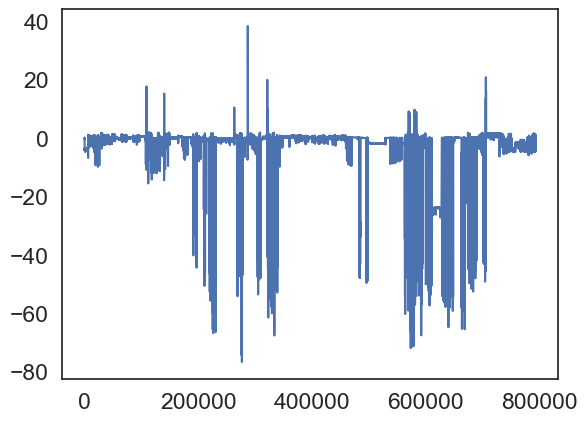

In [842]:
plt.plot(pp.reshape(793782,1))
plt.show()

In [843]:
testXaltdfres=pd.DataFrame(testXalt).to_numpy().reshape(215137, 1, 273)

In [844]:
ppp=model2.predict(testXaltdfres)

6724/6724 [==============================] - 134s 20ms/step


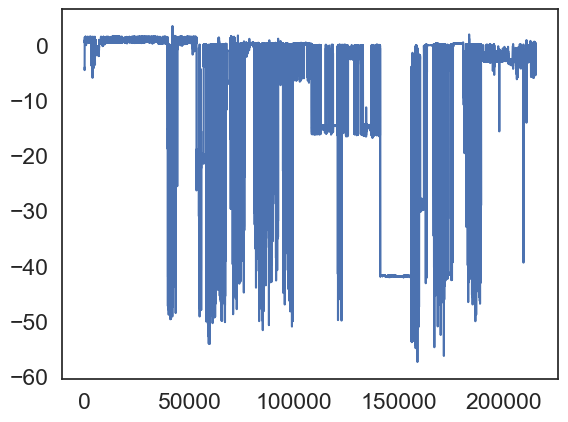

In [845]:
plt.plot(ppp.reshape(215137,1))
plt.show()

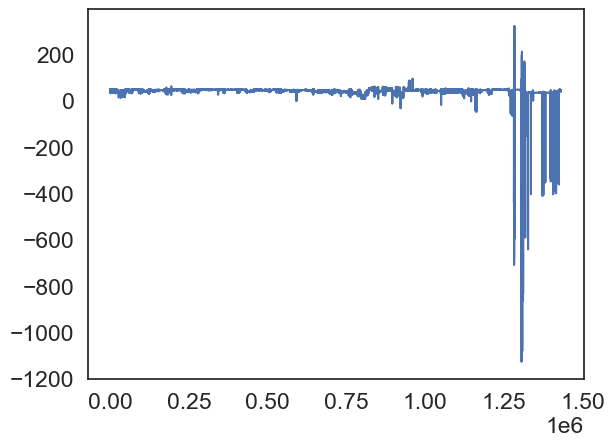

In [853]:
plt.plot(yscaleralt.inverse_transform(p.reshape(1432318,1)))

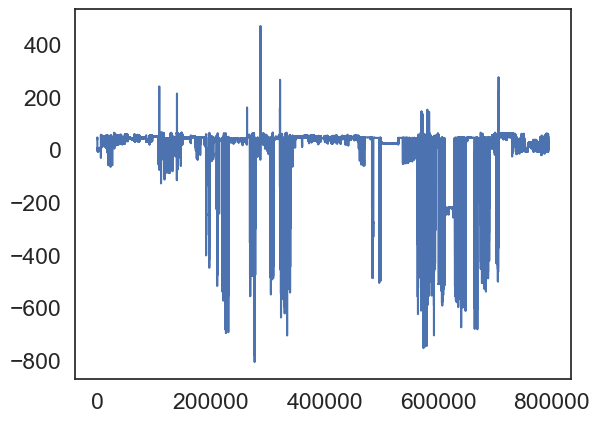

In [857]:
plt.plot(yscaleralt.inverse_transform(pp.reshape(793782,1)))

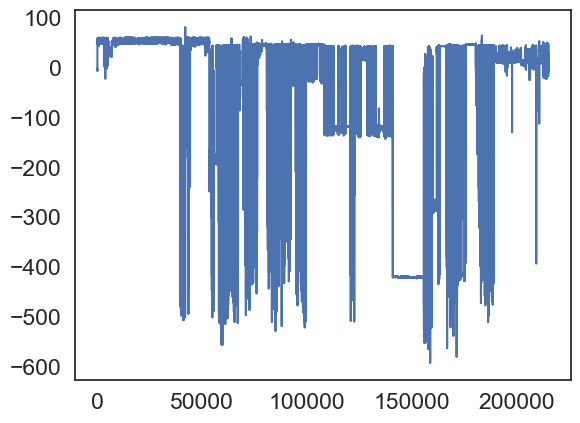

In [858]:
plt.plot(yscaleralt.inverse_transform(ppp.reshape(215137,1)))

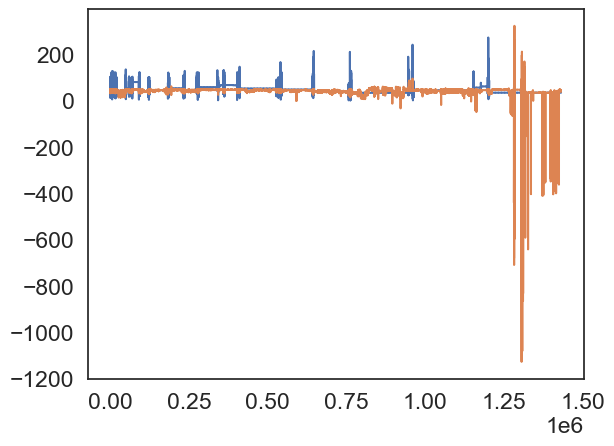

In [1025]:
#pd.DataFrame(yscaleralt.inverse_transform(p.reshape(1432318,1)))
plt.plot(trainyalt.values)
plt.plot(yscaleralt.inverse_transform(p.reshape(1432318,1)))

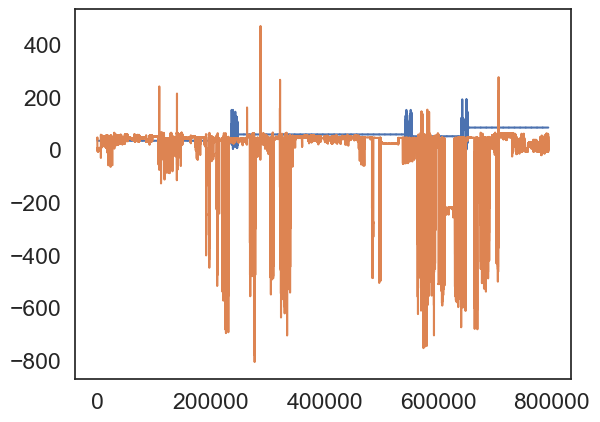

In [873]:
#pd.DataFrame(yscaleralt.inverse_transform(p.reshape(1432318,1)))
plt.plot(validyalt.values)
plt.plot(yscaleralt.inverse_transform(pp.reshape(793782,1)))

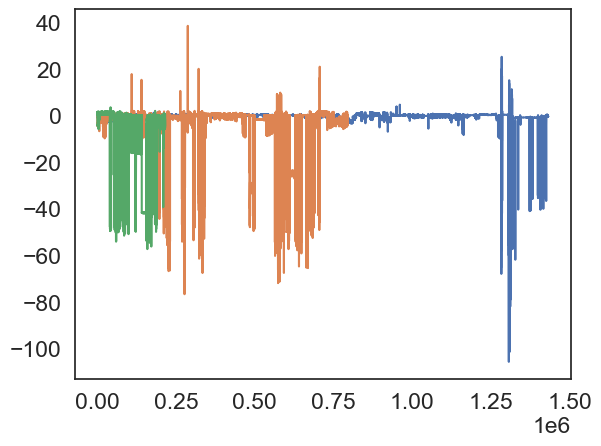

In [847]:
plt.plot(p.reshape(1432318,1))
plt.plot(pp.reshape(793782,1))
plt.plot(ppp.reshape(215137,1))
plt.show()

In [906]:
newp=p.reshape(1432318,1)
newpp=pp.reshape(793782,1)
newppp=ppp.reshape(215137,1)

In [908]:
# invert predictions
sc1=StandardScaler().fit(newp)
newTrain=sc1.inverse_transform(newp)
sc2=StandardScaler().fit(newpp)
newValid = sc2.inverse_transform(newpp)
sc3=StandardScaler().fit(newppp)
newTest = sc3.inverse_transform(newppp)

In [909]:
newTrain.shape == newp.shape, newValid.shape == newpp.shape, newTest.shape == newppp.shape

(True, True, True)

In [910]:
trainXaltdfres.shape, newp.shape, newTrain.shape

((1432318, 1, 273), (1432318, 1), (1432318, 1))

In [943]:
testyalt.to_numpy().reshape(215137,)

array([83., 83., 83., ..., 32., 32., 32.])

In [935]:
# calculate root mean squared error
trainScore = np.sqrt(keras.losses.mean_squared_error(trainyalt.to_numpy().reshape(1432318,), newp[:,0]))
print('Train Score: %.6f RMSE' % (trainScore))

Train Score: 44.923687 RMSE


In [941]:
validScore = np.sqrt(keras.losses.mean_squared_error(validyalt.to_numpy().reshape(793782,), newpp[:,0]))
print('Valid Score: %.6f RMSE' % (validScore))

Valid Score: 59.868305 RMSE


In [944]:
testScore = np.sqrt(keras.losses.mean_squared_error(testyalt.to_numpy().reshape(215137,), newppp[:,0]))
print('Test Score: %.6f RMSE' % (testScore))

Test Score: 62.304176 RMSE


In [945]:
testScore2 = np.sqrt(keras.losses.mean_squared_error(newppp[0], newTest[:,0]))
print('Test Score: %.6f RMSE' % (testScore2))

Test Score: 193.597366 RMSE


In [ ]:
fig, ax = plt.subplots(figsize=(10,5))
ln1=ax.plot(y_train, color='royalblue', linestyle='solid', label='Observed ALT')
ln2=ax.plot(y_test, color='springgreen', linestyle='dashed', label='Tested ALT')
ln3=ax.plot(y_valid, color='magenta', linestyle='dotted', label='Validated ALT')
ax2=ax.twinx();
ln4=ax2.plot(testPredict, color='yellow', linestyle='dotted', label='Test_Predicted ALT')

lines = ln1 + ln2 + ln3 + ln4
labs = [line.get_label() for line in lines];
ax2.legend(lines, labs, loc='best')

ax.grid(linewidth=0.3);
ax.set_xlabel('Epochs', labelpad=6, fontsize=9);
ax.set_ylabel('Loss', labelpad=6, fontsize=9)
ax2.set_ylabel('Forecasted ALT')
plt.title('LSTM+CNN+VAE Model (GeoCryoAI): \n Observed v. Forecasted Active Layer Thickness (cm)')
plt.ylabel('Scaled Active Layer Thickness (cm)')
plt.xlabel('Epoch')
plt.axis([0, 12000, -0.1, 1])
#plt.legend(loc='best')
plt.show()



# fig,ax=plt.subplots(figsize=(10,5));
# lns1=ax.plot(history.history['loss'], color='dodgerblue', label='Loss, Active Layer Thickness (cm)');
# lns2=ax.plot(history.history['root_mean_squared_error'], color='dodgerblue', linestyle='dotted', label='RMSE, Active Layer Thickness (cm)');
# ax2=ax.twinx();
# lns3=ax2.plot(history.history['val_loss'], color='gold', label='Validation Loss, Active Layer Thickness (cm)');
# lns4=ax2.plot(history.history['val_root_mean_squared_error'], color='gold', linestyle='dotted', label='Validation RMSE, Active Layer Thickness (cm)');
          
# lns = lns1+lns2+lns3+lns4;
# labs = [l.get_label() for l in lns];
# ax2.legend(lns, labs, loc='best', fontsize=8);

# ax.grid(linewidth=0.3);
# ax.set_xlabel('Epochs', labelpad=6, fontsize=9);
# #ax.set_ylabel('Loss', labelpad=6, fontsize=9)
# #ax2.set_ylabel('Scaled Depth to Refusal (cm)', labelpad=6, fontsize=9)
# plt.title('Number of Samples/Replicates: 95653', pad=12, fontsize=8, fontweight='ultralight');
# plt.suptitle('Cost Function and Validation Loss from Thaw Depth Modeling in LSTM-AE Framework, Alaska [1969-2022]', fontsize=11);
# plt.grid(linewidth=0.3);
# #plt.show()
# #plt.savefig('ALTstats_LSTM-AEmetrics_1969-2022.png', dpi=1000)


In [875]:
# Get the predicted values
yup_pred_scaled = model2.predict(testXscaltref)

# Unscale the predicted values
yup_pred = yscaleralt.inverse_transform(yup_pred_scaled.reshape(215137,1))
yup_test_unscaled = yscaleralt.inverse_transform(testyscaltref.reshape(-1, 1))


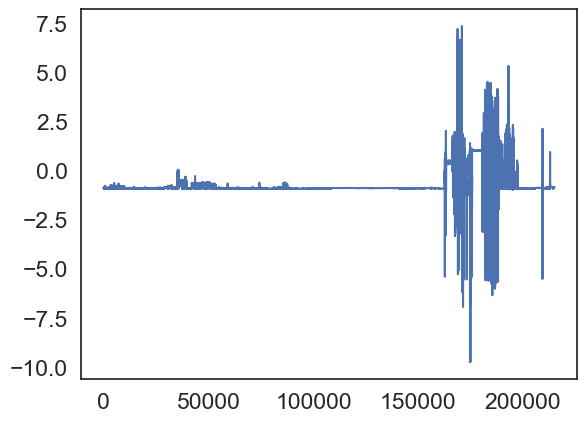

In [882]:
plt.plot(yup_pred_scaled.reshape(215137,1))

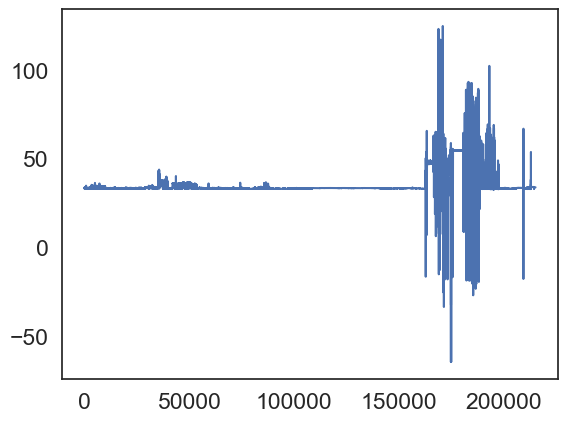

In [888]:
plt.plot(yup_pred)

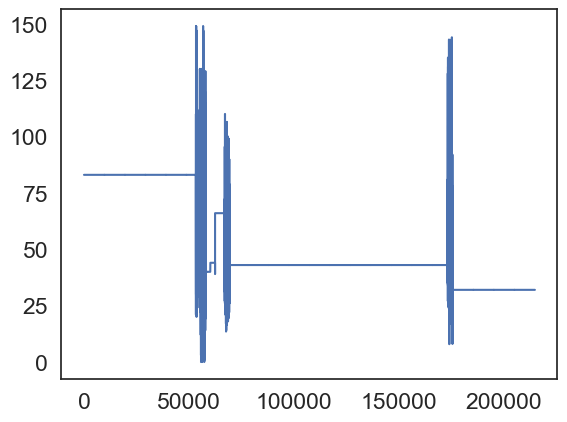

In [878]:
plt.plot(yup_test_unscaled)

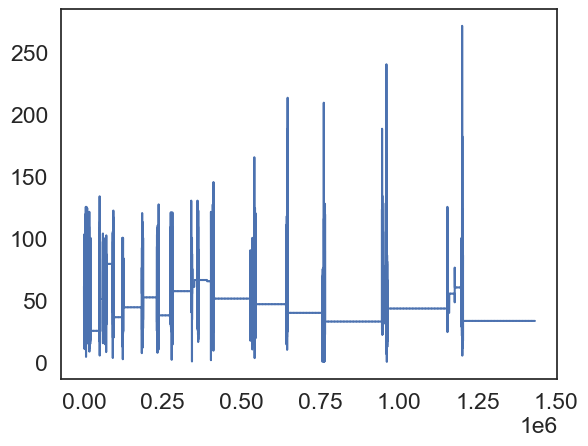

In [896]:
plt.plot(trainyalt.values)

In [ ]:
plt.plot(y_testco2_reframed.reshape(215137,1))
plt.plot(predict.reshape(215137,1))
#plt.axis([0, 130000, -2, 5])
plt.show()

In [ ]:
train, test = X[0:-144], X[-144:]
# walk-forward validation
history = [x for x in train]

In [ ]:
from sklearn.metrics import accuracy_score
print("Test accuracy for the unscaled ALT data")
print(f"{accuracy_score(testyaltdfres, y_pred):.2%}\n")

In [602]:
testyaltdfres=pd.DataFrame(testyalt).to_numpy().reshape(215137, 1, 1)

In [ ]:
from sklearn.metrics import accuracy_score
print("Test accuracy for the unscaled ALT data")
print(f"{accuracy_score(testyaltdfres, y_pred):.2%}\n")
print("Test accuracy for the standardized ALT data")
print(f"{accuracy_score(testyscalt, y_pred_scaled):.2%}\n")

In [591]:
trainXaltdfres=pd.DataFrame(trainXalt).to_numpy().reshape(1432318, 1, 273)

In [ ]:
y_pred = model2.predict(trainXaltdfres)
y_pred_scaled = model2.predict(testXscalt)

23648/44760 [==============>...............] - ETA: 6:53

In [ ]:
testyaltdfres=pd.DataFrame(testyalt).to_numpy().reshape(215137, 1, 1)

In [ ]:
from sklearn.metrics import accuracy_score
print("Test accuracy for the unscaled ALT data")
print(f"{accuracy_score(testyaltdfres, y_pred):.2%}\n")
print("Test accuracy for the standardized ALT data")
print(f"{accuracy_score(testyscalt, y_pred_scaled):.2%}\n")

In [897]:
Y_predicted_reframed = model2.predict(testXaltdfres, verbose = 1, use_multiprocessing = True)

6724/6724 [==============================] - 130s 19ms/step


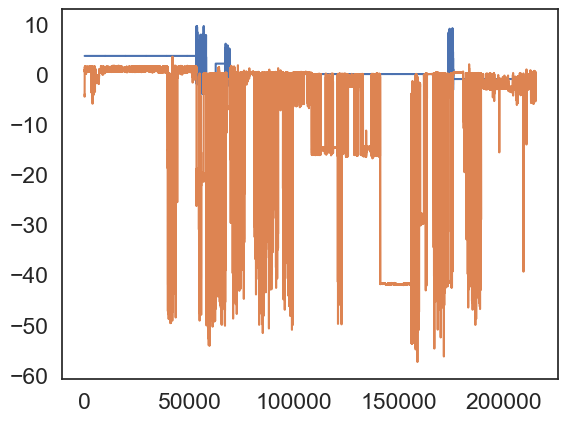

In [901]:
plt.plot(testyscalt)
plt.plot(Y_predicted_reframed.reshape(215137,1))

In [ ]:
Y_predicted_reframed = bayesian_best_model.predict(X_test_reframed,  batch_size = 384, verbose = 1, use_multiprocessing = True)

Y_predicted_scaled = Y_predicted_reframed.reshape(Y_predicted_reframed.shape[0], Y_predicted_reframed.shape[1])

Y_predicted = scaler_Y.inverse_transform(Y_predicted_scaled)

In [ ]:
def plot_results(Y_test, Y_predicted, title = "Test Data and Predictions", index = None):
    if index is None:
        index = range(0, Y_test.shape[0])
    df_index = pd.DataFrame(data = index, index = range(0, Y_test.shape[0]))
    df_index.columns = ["user_index"]  

    shift = Y_test.shape[0] - Y_predicted.shape[0]

    fig, axes = plt.subplots(figsize = (9, 6), sharex = True, nrows = Y_test.shape[1], squeeze = False)
    
    for target, ax in enumerate(axes.flat):
        ax.step(df_index.values, Y_test[:,target], where = "post", label = "Testing Set", color = "blue")
        ax.step(df_index.loc[shift:, "user_index"].values, Y_predicted[:,target], where = "post", 
                label = "Predictions", color = "red")
    
    plt.suptitle(title)
    plt.legend()

In [ ]:
plot_results(scaler_Y.inverse_transform(Y_test.values), Y_predicted, index = Y_test.index, 
             title = "Active Layer Thickness /n Predictions v. Test Data \n via 8-layer C1DLSTMSAE Network")

In [ ]:
Y_predicted=Y_predicted.reshape(397492,)#;Y_test=Y_test.reshape(668168,)

In [ ]:
def qq_plot(Y_test, Y_predicted, title = "Test Data and Predictions", index = None):
    if index is None:
        index = range(0, Y_test.shape[0])
    df_index = pd.DataFrame(data = index, index = range(0, Y_test.shape[0]))
    df_index.columns = ["user_index"]  

    shift = Y_test.shape[0] - Y_predicted.shape[0]

    fig, axes = plt.subplots(figsize = (9, 6), sharex = True, nrows = Y_test.shape[1], squeeze = False)
    
    for target, ax in enumerate(axes.flat):
        ax.scatter(Y_test[shift:,target], Y_predicted[:,target], label = "Predictions", color = "red", s = 5, 
                   alpha = 0.5)
        ax.scatter(Y_test[:,target], Y_test[:,target], label = "Testing Set", color = "blue", s = 5)

    plt.suptitle(title)
    plt.legend()

In [ ]:
qq_plot(Y_test.values, Y_predicted_scaled, index = Y_test.index, 
        title = "Active Layer Thickness /n Predictions v. Test Data via \n 7-layer Sequential Time-Distributed C1DLSTMSAE Network")

In [ ]:
Y_predicted_reframed = model.predict(X_test_reframed)
Y_predicted = Y_predicted_reframed.reshape(Y_predicted_reframed.shape[0], Y_predicted_reframed.shape[1])

In [ ]:
import pandas as pd
testim=pd.read_csv(r'/Users/bradleygay/test_store_ALT_2022.csv')

In [ ]:
testim.index=testim.iloc[:,0]

In [ ]:
testim=testim.drop(testim.columns[0],axis=1)

In [ ]:
testim.index.name = None

In [ ]:
#testim.index=pd.to_datetime(testim.index, format='%Y')

In [ ]:
testim=testim.sort_index()

In [ ]:
testim.index = pd.to_datetime(testim.index)

In [ ]:
testim

In [ ]:
plt.plot(scaler_Y.inverse_transform(testim))

In [ ]:
plot_results(scaler_Y.inverse_transform(Y_test.values), scaler_Y.inverse_transform(Y_predicted),
             index = Y_test.index, title = "Active Layer Thickness - Predicteed v. Test Data")

In [ ]:
test_scores = model.evaluate(X_test_reframed, Y_test[backward_steps:],
                                           batch_size=hp["batch_size"], use_multiprocessing=True,)

In [ ]:
def metrics_print(test_data,test_predict):
    print('Test RMSE: ', round(np.sqrt(sklearn.metrics.mean_squared_error(test_data, test_predict)), 2))
    print('Test R^2 : ', round((sklearn.metrics.r2_score(test_data, test_predict)*100), 2) ,"%")
    print('Test MAPE: ', round(sklearn.metrics.mean_absolute_percentage_error(test_data, test_predict)*100,2), '%')

In [ ]:
print("##************** Linear Regression Results **************##")
metrics_print(prediction_df['Observed'], prediction_df['LR'])
print(" ")
print(" ")

print("##************** Deep Learning Results **************##")
metrics_print(prediction_df['Observed'], prediction_df['DNN'])
print(" ")
print(" ")

In [ ]:
fa = plt.figure(figsize=(16,5))
plt.subplot(1,2,1)
plt.scatter(prediction_df['Observed'],prediction_df['LR'])
plt.xlabel('True Values [snow_depth]', fontsize=15)
plt.ylabel('Predictions [snow_depth]', fontsize=15)
plt.title("Linear Regression")


plt.subplot(1,2,2)
plt.scatter(prediction_df['Observed'],prediction_df['DNN'])
plt.xlabel('True Values [snow_depth]', fontsize=15)
plt.ylabel('Predictions [snow_depth]', fontsize=15)
plt.title("Deep Neural Network")

In [ ]:
LR_error = prediction_df['Observed'] - prediction_df['LR']
DNN_error = prediction_df['Observed'] - prediction_df['DNN']

fa = plt.figure(figsize=(16,5))

plt.subplot(1,2,1)
LR_error.hist()
plt.xlabel('Error', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title("Linear Regression")

plt.subplot(1,2,2)
DNN_error.hist()
plt.xlabel('Error', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title("Deep Neural Network")

In [591]:
trainXaltdfres=pd.DataFrame(trainXalt).to_numpy().reshape(1432318, 1, 273)

In [ ]:
y_pred = model2.predict(trainXaltdfres)
y_pred_scaled = model2.predict(testXscalt)

23648/44760 [==============>...............] - ETA: 6:53

In [ ]:
testyaltdfres=pd.DataFrame(testyalt).to_numpy().reshape(215137, 1, 1)

In [ ]:
from sklearn.metrics import accuracy_score
print("Test accuracy for the unscaled ALT data")
print(f"{accuracy_score(testyaltdfres, y_pred):.2%}\n")
print("Test accuracy for the standardized ALT data")
print(f"{accuracy_score(testyscalt, y_pred_scaled):.2%}\n")

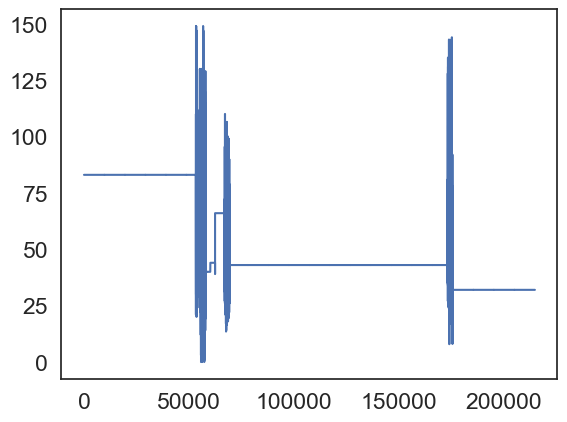

In [570]:
#ALT
plt.plot(yscaleralt.inverse_transform(testyscalt))

In [ ]:
#CH4

In [ ]:
#CO2

In [ ]:
#alt_model.predict(testXscaltref, testyscaltref, verbose=1)

In [ ]:
one=np.concatenate((trainyalt.resample('Y').mean(), validyalt.resample('Y').mean()), axis=0)
two=np.concatenate((one, testyalt.resample('Y').mean()), axis=0)

In [ ]:
abc=pd.DataFrame(yscaler.inverse_transform(testyscaltpredres))
#yscaler.inverse_transform(testyscaltpredres)

In [ ]:
plt.plot(two)

In [ ]:
trainyalt.index

In [ ]:
three=pd.DataFrame(trainyscaltpredinv)
#np.concatenate(trainyscaltpredinv, validyscaltpredinv)

In [ ]:
three.index=trainyalt.index

In [ ]:
plt.plot(three)

In [ ]:
two=np.concatenate(one, validyalt.resample('Y').mean()), axis=0)

In [ ]:
one=np.concatenate((trainyalt.resample('Y').mean(), validyalt.resample('Y').mean()), axis=0)

In [ ]:
plt.plot(one)

In [ ]:
plt.plot(trainyalt.resample('Y').mean())
plt.plot(validyalt.resample('Y').mean())
plt.plot(testyalt.resample('Y').mean())

In [ ]:
# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
#-----Visualize---------- 
# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(dataset)
trainPredictPlot[:, :] = numpy.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = numpy.empty_like(dataset)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(dataset))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

In [ ]:
#df['ALT']['2021':].shape
#1432321/2441240#0.5867186347921548
#793782/2441240#0.325155248971834
#215137/2441240#0.0881261162360112

In [ ]:
# plt.plot(df.ALT['1970':'2017'][1:].to_numpy().reshape(1432317,1), trainyalt)
# plt.plot(df.ALT['2018':'2020'].values, validyalt)
# plt.plot(df.ALT['2021':][1:].to_numpy().reshape(215136,1), testyalt)
# plt.show()

In [ ]:
# plt.figure(figsize=(10,6))
# plt.plot(trainyscalt, label='train')
# plt.plot(trainyscaltpredres, label='trainpred')
# plt.plot(validyscalt, label='valid')
# plt.plot(validyscaltpredres, label='validpred')
# plt.plot(testyscalt, label='test')
# plt.plot(testyscaltpredres, label='testpred')
# plt.legend()
# #plt.axis(xmin=0, xmax=250000)

In [ ]:
testXscalt

In [ ]:
from sklearn import metrics
metrics.r2_score(testyscalt, testyscaltpred)

In [ ]:
#invyhat=np.concatenate((testyscaltpredres,testXscalt[:,-1:]),axis=1)

In [ ]:
#invyhat=yscaler.inverse_transform(invyhat)[:,0]

In [ ]:
#invy=np.concatenate((testyscalt.reshape((len(testyscalt), 1)),testXscalt[:,1:]),axis=1)

In [ ]:
#invy=yscaler.inverse_transform(invy)[:,0]

In [ ]:
#rmse = np.sqrt(mean_squared_error(invy, invyhat))
#print('Test RMSE: %.3f' % rmse)

In [ ]:
# yhat = model3.predict(test_X)
# test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
# # invert scaling for forecast
# inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
# inv_yhat = scaler.inverse_transform(inv_yhat)
# inv_yhat = inv_yhat[:,0]
# # invert scaling for actual
# test_y = test_y.reshape((len(test_y), 1))
# inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
# inv_y = scaler.inverse_transform(inv_y)
# inv_y = inv_y[:,0]
# # calculate RMSE
# rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
# print('Test RMSE: %.3f' % rmse)

In [ ]:
trainXalt.shape, trainXscalt.shape, trainXscaltref.shape

In [ ]:
trainyscaltpredres=trainyscaltpred.reshape(1432317,1)
validyscaltpredres=validyscaltpred.reshape(793782,1)
testyscaltpredres=testyscaltpred.reshape(215136,1)

In [ ]:
#print(list(trainXalt.columns))

In [ ]:
#ind=testyalt.index.values
#ind=trainyalt.index.values
ind=validyalt.index.values

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(ind,yscaler.inverse_transform(trainyscalt))
plt.plot(ind,yscaler.inverse_transform(trainyscaltpredres))
plt.show()

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(ind,yscaler.inverse_transform(validyscalt))
plt.plot(ind,yscaler.inverse_transform(validyscaltpredres))
plt.show()

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(ind,yscaler.inverse_transform(testyscalt))
plt.plot(ind,yscaler.inverse_transform(testyscaltpredres))
plt.show()

In [ ]:
trainyscaltpredinv=yscaler.inverse_transform(trainyscaltpredres)
validyscaltpredinv=yscaler.inverse_transform(validyscaltpredres)

In [ ]:
trainyscaltpredinv.shape, validyscaltpredinv.shape

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
print(mean_squared_error(trainyalt, trainyscaltpredinv))

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
print(mean_squared_error(train, y_train_pred))

## Exploratory Plots (Active Layer Thickness, Carbon Dioxide, Methane)

In [ ]:
# fig,ax=plt.subplots(figsize=(10,7));
# #lns1=ax.plot(history2.history['loss'], color='dodgerblue', label='Loss, ALT (cm)');
# lns2=ax.plot(history2.history['mean_squared_error'], color='dodgerblue', linestyle='solid', label='RMSE, ALT (cm)');
# ax2=ax.twinx();
# #lns3=ax2.plot(history2.history['val_loss'], color='gold', label='Validation Loss, ALT (cm)');
# lns4=ax2.plot(history2.history['val_mean_squared_error'], color='gold', linestyle='solid', label='Validation RMSE, ALT (cm)');
          
# lns = lns2+lns4; #lns1+lns2+lns3+lns4;
# labs = [l.get_label() for l in lns];
# ax2.legend(lns, labs, loc='best', fontsize=8);

# ax.grid(linewidth=0.3);
# ax.set_xlabel('Epochs', labelpad=12, fontsize=10);
# ax.set_ylabel('Scaled Depth to Refusal (cm)', labelpad=12, fontsize=10);
# #ax2.set_ylabel('Scaled Depth to Refusal (cm)', labelpad=6, fontsize=9)
# plt.title('Number of Samples/Replicates: 95653', pad=15, fontsize=12, fontweight='ultralight');
# plt.suptitle('Cost Function and Validation Loss from Thaw Depth Modeling, GeoCryoAI Framework in Alaska [1969-2022]', fontsize=14);
# plt.grid(linewidth=0.3);
# #plt.show()
# #plt.savefig('ALTstats_CNNLSTMSAEmetrics_1969-2022_021323.png', dpi=1000)


In [ ]:
# fig,ax=plt.subplots(figsize=(10,7));
# lns1=ax.plot(history.history['loss'], color='dodgerblue', label='Loss, Carbon Dioxide Mole Fraction (µmolCO2mol-1ms-1)');
# lns2=ax.plot(history.history['root_mean_squared_error'], color='dodgerblue', linestyle='dotted', label='RMSE, Carbon Dioxide Mole Fraction (µmolCO2mol-1m)');
# ax2=ax.twinx();
# lns3=ax2.plot(history.history['val_loss'], color='gold', label='Validation Loss, Active Layer Thickness (cm)');
# lns4=ax2.plot(history.history['val_root_mean_squared_error'], color='gold', linestyle='dotted', label='Validation RMSE, Carbon Dioxide Mole Fraction (µmolCO2mol-1m)');
          
# lns = lns1+lns2+lns3+lns4;
# labs = [l.get_label() for l in lns];
# ax2.legend(lns, labs, loc='best', fontsize=8);

# ax.grid(linewidth=0.3);
# ax.set_xlabel('Epochs', labelpad=6, fontsize=9);
# #ax.set_ylabel('Loss', labelpad=6, fon#tsize=9)
# #ax2.set_ylabel('Scaled Depth to Refusal (cm)', labelpad=6, fontsize=9)
# plt.title('Number of Samples/Replicates: 95653', pad=12, fontsize=8, fontweight='ultralight');
# plt.suptitle('Cost Function and Validation Loss from Carbon Dioxide Mole Fraction Modeling in LSTM-AE Framework, Alaska [1969-2022]', fontsize=11);
# plt.grid(linewidth=0.3);
# #plt.show()
# #plt.savefig('ALTstats_LSTM-AEmetrics_1969-2022-x2.png', dpi=1000)


In [ ]:
# fig,ax=plt.subplots(figsize=(10,5));
# lns1=ax.plot(history.history['loss'], color='dodgerblue', label='Loss, Methane Flux (nmolCO2m-2s)');
# lns2=ax.plot(history.history['root_mean_squared_error'], color='dodgerblue', linestyle='dotted', label='RMSE, Methane Flux (nmolCO2m-2s)');
# ax2=ax.twinx();
# lns3=ax2.plot(history.history['val_loss'], color='gold', label='Validation Loss, Active Layer Thickness (cm)');
# lns4=ax2.plot(history.history['val_root_mean_squared_error'], color='gold', linestyle='dotted', label='Validation RMSE, Methane Flux (nmolCO2m-2s)');
          
# lns = lns1+lns2+lns3+lns4;
# labs = [l.get_label() for l in lns];
# ax2.legend(lns, labs, loc='best', fontsize=8);

# ax.grid(linewidth=0.3);
# ax.set_xlabel('Epochs', labelpad=6, fontsize=9);
# #ax.set_ylabel('Loss', labelpad=6, fon#tsize=9)
# #ax2.set_ylabel('Scaled Depth to Refusal (cm)', labelpad=6, fontsize=9)
# plt.title('Number of Samples/Replicates: 120539', pad=12, fontsize=8, fontweight='ultralight');
# plt.suptitle('Cost Function and Validation Loss from Methane Flux Modeling in LSTM-AE Framework, Alaska [2015-2018]', fontsize=11);
# plt.grid(linewidth=0.3);
# #plt.show()
# #plt.savefig('ALTstats_LSTM-AEmetrics_1969-2022-x2.png', dpi=1000)


In [ ]:
test=alt.loc["2022"].replace(-9999,np.nan).dropna().values

In [ ]:
test=np.reshape(test, (test.shape[0], test.shape[1], 1))

In [ ]:
testX=test

In [ ]:
testy=np.reshape(test, (test.shape[0],))

In [ ]:
#X_test.shape, y_test.shape

In [ ]:
testX.shape, testy.shape

In [ ]:
model.evaluate(X_testsc,y_testsc)
#Not an accurate depiction due to scaling; must invert prior to quantifying error

In [ ]:
# train_Xt=np.array(trainX).reshape(1772962,1)
# train_yt=np.array(trainY).reshape(1772962,)
# valid_Xt=np.array(validX).reshape(453143,1)
# valid_yt=np.array(validY).reshape(453143,)
# test_Xt=np.array(testX).reshape(215135,1)
# test_yt=np.array(testY).reshape(215135,)

In [ ]:
# lin_reg = linear_model.LinearRegression()
# # train model
# lin_reg.fit(train_Xt,train_yt)
# # predict
# y_train_pred = lin_reg.predict(train_Xt)
# y_valid_pred = lin_reg.predict(valid_Xt)
# y_test_pred = lin_reg.predict(test_Xt)
# # Plot predictions
# fig=plt.figure()
# plt.scatter(y_train_pred, train_yt, c = "blue", marker = "s", label = "Training data")
# plt.scatter(y_valid_pred, valid_yt, c = "magenta", marker = "s", label = "Validation data")
# plt.scatter(y_test_pred, test_yt, c = "lightgreen", marker = "s", label = "Testing data")
# plt.legend()
# plt.show()

In [ ]:
# from sklearn.metrics import mean_squared_error
# error =np.sqrt(mean_squared_error(valid_yt, y_valid_pred))
# print(error)

In [ ]:
# prediction=lin_reg.predict(valid_Xt)

In [ ]:
# plt.plot(valid_yt, linestyle='dotted');
# plt.plot(prediction, linestyle='dotted');

In [ ]:
plt.figure()
plt.ylabel('loss'); plt.xlabel('epoch')
plt.semilogy(history.history['loss'])

In [ ]:
axes=plt.axes()
#axes.plot(pd.DataFrame(history.history)['loss'], label='Loss')
axes.plot(pd.DataFrame(history.history)['val_loss'], label='Validation Loss')
axes.legend(loc=0)
axes.set_title('Model fitting performance')

In [ ]:
#1,#3
axes=plt.axes()
axes.plot(pd.DataFrame(history.history)['loss'], label='Loss')
axes.plot(pd.DataFrame(history.history)['val_loss'], label='Validation Loss')
axes.legend(loc=0)
axes.set_title('Model fitting performance')

In [ ]:
sc=StandardScaler()
sc.fit_transform(alt)
newtest=alt.loc["2020":"2022":,:].values
newtest=sc.transform(np.reshape(alt.loc["2020":"2022":,:].values, (-1, 1)))
newtest=np.reshape(newtest, (newtest.shape[0],newtest.shape[1],1))

In [ ]:
newtest.shape

In [ ]:
preds=model.predict(newtest)

In [ ]:
preds=preds.reshape(11050,1)
unspreds=sc.inverse_transform(preds)

In [ ]:
plt.plot(unspreds, color = '#135485', linestyle='solid', label = "Predictions")
plt.plot(alt.loc["2020":"2022":,:].values, color = 'pink', linestyle='dotted', label = "Real Data")

In [ ]:
newtest=alt.loc["2020":"2022":,:].values
testScore = np.sqrt(keras.losses.mean_squared_error(newtest[0], unspreds[:,0]))
print('Test Score: %.6f RMSE' % (testScore))

In [ ]:
sc=StandardScaler()
sc.fit_transform(alt)
#make predictions
trainPredict = model.predict(trainX)
validPredict = model.predict(validX)
#invert predictions
trainPredict=trainPredict.reshape(68801,1)
validPredict=validPredict.reshape(18902,1)
trainy=trainy.reshape(68801,)
validy=validy.reshape(18902,)
trainPredict = sc.inverse_transform(trainPredict)
trainy = sc.inverse_transform([trainy])
validPredict = sc.inverse_transform(validPredict)
validy = sc.inverse_transform([validy])

In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(keras.losses.mean_squared_error(trainy[0], trainPredict[:,0]))
print('Train Score: %.6f RMSE' % (trainScore))
validScore = np.sqrt(keras.losses.mean_squared_error(validy[0], validPredict[:,0]))
print('Valid Score: %.6f RMSE' % (validScore))

In [ ]:
test=altsc.loc["2020":"2022"]

In [ ]:
test.values

In [ ]:
testPredict=model.predict(test.values.reshape(3363,1,1))
testPredict=testPredict.reshape(3363,1)
testy=test.values.reshape(3363,)
testPredict=sc.inverse_transform(testPredict)
testy=sc.inverse_transform([testy])
testScore = np.sqrt(keras.losses.mean_squared_error(testy[0], testPredict[:,0]))
print('Test Score: %.6f RMSE' % (testScore))

In [ ]:
trainPredict.shape, validPredict.shape, testPredict.shape

In [ ]:
#plt.plot(trainX.reshape(68801,1))
#plt.plot(validX.reshape(18902,1))
plt.plot(trainPredict.reshape(68801,1))
plt.plot(validPredict.reshape(18902,1))
plt.plot(testPredict.reshape(3363,1))

In [ ]:
testPredict=testPredict.reshape(11050,1)

In [ ]:
testScore = np.sqrt(keras.losses.mean_squared_error(testX[0], testPredict[:,0]))
print('Test Score: %.6f RMSE' % (testScore))

In [ ]:
# make predictions
trainPredict = model.predict(trainX)
validPredict = model.predict(validX)
testPredict = model.predict(testX)

In [ ]:
trainPredict.shape, validPredict.shape, testPredict.shape

In [ ]:
# # make predictions
# #test_Xt=np.array(test_X)
# #test_yt=np.array(test_y)
# trainPredict.shape, testPredict.shape
# trainPredict=trainPredict.reshape(68801,1)
# validPredict=validPredict.reshape(18902,1)
# testPredict=testPredict.reshape(11050,1)
# trainPredict.shape, testPredict.shape, validPredict.shape

In [ ]:
# # make predictions
# #test_Xt=np.array(test_X)
# #test_yt=np.array(test_y)
# trainPredict.shape, testPredict.shape
# trainPredict=trainPredict.reshape(298498,1)
# validPredict=validPredict.reshape(144987,1)
# testPredict=testPredict.reshape(103616,1)
# trainPredict.shape, testPredict.shape, validPredict.shape

In [ ]:
# make predictions
#test_Xt=np.array(test_X)
#test_yt=np.array(test_y)
trainPredict=trainPredict.reshape(68801,1)
validPredict=validPredict.reshape(18902,1)
testPredict=testPredict.reshape(11050,1)
trainPredict.shape, validPredict.shape, testPredict.shape

In [ ]:
# invert prediction
sc=StandardScaler()
newTrain=sc.fit_transform(trainPredict)
newTrain=sc.inverse_transform(trainPredict)
sc=StandardScaler()
newValid = sc.fit(validPredict)
newValid = sc.inverse_transform(validPredict)
#sc=StandardScaler().fit_transform(testPredict)
newTest = testPredict

In [ ]:
newTrain.shape == trainPredict.shape, newValid.shape == validPredict.shape, newTest.shape == testPredict.shape

In [ ]:
trainX.shape, trainPredict.shape, newTrain.shape

In [ ]:
#plt.plot(X_train)
#plt.plot(trainPredict)
#plt.plot(newTrain)

In [ ]:
print("Train": 1772964*91)
print("Valid": 614894*91)
print("Test": 53388*91)

In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(keras.losses.mean_squared_error(newTrain[0], trainPredict[:,0]))
print('Train Score: %.6f RMSE' % (trainScore))
validScore = np.sqrt(keras.losses.mean_squared_error(newValid[0], validPredict[:,0]))
print('Valid Score: %.6f RMSE' % (validScore))
testScore = np.sqrt(keras.losses.mean_squared_error(newTest[0], testPredict[:,0]))
print('Test Score: %.6f RMSE' % (testScore))

# VIF

In [ ]:
# load statmodels functions
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# compute the vif for all given features
def compute_vif(features):
    X = features.iloc[:,:]
    X['intercept'] = 1
    vif = pd.DataFrame()
    vif["Variable"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif = vif[vif['Variable']!='intercept']
    return vif

In [ ]:
features = df
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features.columns

#### After removing a feature, compute VIF values iteratively.

In [ ]:
features=features.drop('GPP',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('SWC_1_2_1',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('SWC_1_2_4',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('TS_2_3_5',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('TS_2_3_1',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('TS_2_3_4',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('TS_2_3_2',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('TS_2_2_6',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('CH4_1_2_1',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('LW_IN',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('SW_IN_MEAN',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('TS_STD',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('CO2_STD',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('SWC_1_1_5',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('TS_1_1_1',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('TS_2_3_3',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('WS_STD',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('TS_2_2_3',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('CO2_MEAN',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('SWC_1_2_5',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('TS_MEAN',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('soil_[CO2]_15cm',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features=features.drop('SWC_1_1_2',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('CH4_1_4_1',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('TS_2_2_2',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('SW_OUT',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('SWC_1_2_2',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('SW_IN',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('H2O_STD',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('SW_IN_STD',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('CO2_1_3_1',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('TS_1_1_2',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('SWC_1_2_6',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('G_1_1_2',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('RECO',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('WD_STD',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
####STOPPED HERE - FROM HERE DOWN, COPY OUTPUT TO PAPER#####
####STOPPED HERE - FROM HERE DOWN, COPY OUTPUT TO PAPER#####

In [ ]:
features=features.drop('SWC_1_1_4',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('soil_[CO2]_5cm',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('TA_1_4_1',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('SWC_1_2_3',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('TA_1_3_1',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('G_1_1_4',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('CH4_STD',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
features=features.drop('TS_2_2_1',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
# features=features.drop('G_1_1_1',axis=1)
compute_vif(features).sort_values('VIF', ascending=False)

In [ ]:
features

In [ ]:
#features

In [ ]:
filepath = Path('/Users/bradleygay/Downloads/data_ak_vif.csv')
filepath.parent.mkdir(parents=True, exist_ok=True)
features.to_csv(filepath)

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/data_ak_vif.csv')
newdf = pd.read_csv(file)
#df.tail(5)

In [ ]:
newdf.index=newdf.iloc[:,0]
newdf.index.name = None
newdf=newdf.drop(newdf.columns[0],axis=1)
newdf=newdf.sort_index()

In [ ]:
df.rename(columns = {'CH4_MIXING_RATIO_MEAN':'CH4_MR_MEAN'}, inplace = True)
newdf.rename(columns = {'CH4_MIXING_RATIO_MEAN':'CH4_MR_MEAN'}, inplace = True)

In [ ]:
df.rename(columns = {'CH4_MIXING_RATION_STD':'CH4_MR_STD'}, inplace = True)
newdf.rename(columns = {'CH4_MIXING_RATION_STD':'CH4_MR_STD'}, inplace = True)

In [ ]:
newdf=newdf.drop(newdf.columns[-1], axis=1) #Get rid of rightmost 'intercept' column (1's) from previous VIF method

In [ ]:
print(newdf.columns.values.tolist())

In [ ]:
newdf.replace(-9999,np.nan).describe()

In [ ]:
# highCorrList =[]
# corrDFCorr = df.corr()
# columns = df.columns

# for i in range(0, 10):
#     for j in range(i+1, 10):
#         tempCorr = corrDFCorr.iloc[i, j]
#         if (tempCorr >= 0.5 and tempCorr < 1) or (tempCorr < 0 and tempCorr <= -0.5):
#             highCorrList.append([tempCorr, i, j])

# highCorrList = sorted(highCorrList, key=lambda x: -abs(x[0]))

# for x, y, z in highCorrList:
#     print("{0} , {1} : {2}".format(columns[y], columns[z], x))
    

# from statsmodels.stats.outliers_influence import variance_inflation_factor
  
# # the independent variables set
# X = df2.values
  
# # VIF dataframe
# vif_data = pd.DataFrame()
# vif_data["feature"] = X.columns
  
# # calculating VIF for each feature
# vif_data["VIF"] = [variance_inflation_factor(X.values, i)
#                           for i in range(len(X.columns))]
  
# print(vif_data)

In [ ]:
corrDF = df.iloc[:, :]
plt.figure(figsize = (20, 18))
#legend=sns.color_palette("hls", 94)
sns.heatmap(df.replace(np.nan, -9999).corr(), cmap='icefire', linewidths=0.45, linecolor='black', annot=False)
plt.savefig('df91f_hm.svg', dpi=1000, bbox_inches='tight')

In [ ]:
corrDF = newdf.iloc[:, :]
plt.figure(figsize = (20, 18))
#legend=sns.color_palette("hls", 94)
sns.heatmap(newdf.corr(), cmap='icefire', linewidths=0.45, linecolor='black', annot=False)
plt.savefig('newdf46f_hm.svg', dpi=1000, bbox_inches='tight')

# Forecast

In [ ]:
#X_test_reframed_sup.shape
#Xscaler.inverse_transform(X_test_reframed_sup)
#X_test_reframed_sup.reshape(
#215134*376#80890384
#80890384/94#860536.0
#Xscaler.inverse_transform(X_test_reframed_sup.reshape(860536,94))

In [ ]:
#X_train_reframed_sup.shape
#1772957*376#666631832
#666631832/94#7091828.0
#Xscaler.inverse_transform(X_train_reframed_sup.reshape(7091828,94))

In [ ]:
#X_valid_reframed_sup.shape
#453141*376#170381016
#170381016/94#1812564.0
#Xscaler.inverse_transform(X_valid_reframed_sup.reshape(1812564,94))

In [ ]:
98102016/32/456

In [ ]:
6723*32*456

In [ ]:
215136*455

In [ ]:
97886880-98102016

In [ ]:
testXscch4ref.shape

In [ ]:
#X_test_reframed.reshape(215136,1,456).shape
testXscch4refres=testXscch4ref.reshape(161749,1,456)

In [ ]:
score = model2.evaluate(testXscch4ref, testyscch4ref, verbose = 1) 

In [ ]:
score

In [ ]:
print('Test MAE:', score[1])
print('Test MSE:', score[2])
#print('Test RMSE:', score_experimental[3])

In [ ]:
X_test_reframed.shape

In [ ]:
predict_experimental = model2.predict(X_test_reframed, verbose = 1)

In [ ]:
predict_experimental.shape, X_test_reframed.shape

In [ ]:
predict_experimental=yscaler.inverse_transform(predict_experimental.reshape(215136,1))

In [ ]:
X_t_experimental=Xscaler.inverse_transform(X_test_reframed.reshape(215136,286))

In [ ]:
yhat_experimental=np.concatenate((X_t_experimental,predict_experimental),axis=1)

In [ ]:
#np.concatenate(X_train_reframed.reshape(7574,299))
plt.plot(yscaler.inverse_transform(y_test_reframed.reshape(215136,1)))
plt.plot(predict_experimental)
#plt.plot(yhat.reshape(423000,1))
#plt.axis([0,1450,0,2])
plt.show()

In [ ]:
#y_test_reframed.shape
np.sqrt(mean_squared_error(y_test_reframed.reshape(215136,1),predict_experimental))

In [ ]:
mean_absolute_percentage_error(y_test_reframed.reshape(215136,1),predict_experimental)

In [ ]:
r2_score(y_test_reframed.reshape(215136,1),predict_experimental)

In [ ]:
plt.plot(y_test_reframed.reshape(215136,1))
plt.plot(predict_experimental.reshape(215136,1))
#plt.axis([0, 80000, -5, 5])
plt.show()

In [ ]:
fig,ax = plt.subplots(figsize=(10,6), dpi=1000)
ln1=ax.plot(history.history['loss'], color='magenta', linestyle='solid', label='Loss (MSE)')
ln2=ax.plot(history.history['val_loss'], color='dodgerblue', linestyle='solid', label='Val Loss (MSE)')
ln3=ax.plot(history.history['mean_absolute_error'], color='springgreen', linestyle='dotted', label='MAE')
#ln4=ax.plot(history.history['mean_squared_error'], color='springgreen', linestyle='dashed', label='Seward Peninsula')
ln4=ax.plot(history.history['root_mean_squared_error'], color='springgreen', linestyle='dashed', label='RMSE')
ln5=ax.plot(history.history['val_mean_absolute_error'], color='red', linestyle='dotted', label='Val MAE')
#ln7=ax.plot(history.history['val_mean_squared_error'], color='red', linestyle='dashed', label='Seward Peninsula')
ln6=ax.plot(history.history['val_root_mean_squared_error'], color='red', linestyle='dashed', label='Val RMSE')
#ln2=ax.plot(sib.iloc[2:,7].replace(-9999,np.nan).dropna()color='springgreen', linestyle='dashed', label='Interior')
#ln3=ax.plot(sib.iloc[2:,16].replace(-9999,np.nan).dropna(), color='magenta', linestyle='dotted', label='Seward Peninsula')
#ln4=ax.plot(sib.iloc[2:,39].replace(-9999,np.nan).dropna(), color='dodgerblue', linestyle='dotted', label='Yukon-Kuskokwim Delta')
#ax2=ax.twinx();
#ln4=ax2.plot(validPredict, color='coral', linestyle='dotted')

lines = ln1 + ln2 + ln3 + ln4 + ln5 + ln6# + ln7 + ln8
labs = [line.get_label() for line in lines];
plt.legend(lines, labs, loc='lower left', fontsize=8)

ax.grid(linewidth=0.3);
ax.set_xlabel('Epochs', labelpad=10, fontsize=16);
ax.set_ylabel('Loss (cm)', labelpad=10, fontsize=16)
#ax.set(xticklabels=[])  # remove the tick labels
ax.tick_params(left=False)  # remove the ticks
#plt.ylabel('Active Layer Thickness (cm)')
plt.title('GeoCryoAI In Situ Module | Bidirectional LSTM Autoencoder Loss Function \n In Situ Thaw Depth Simulations (1969-2022)', pad=10)
#plt.xlabel('Year')
#plt.axis([0, 6, 0, 60])
#plt.legend(loc='best')
#plt.show()
plt.savefig('/Users/bradleygay/Downloads/bilstmae_insitu_ALT_loss.png',dpi=1000)

In [ ]:
X_test_reframed.shape
Xscaler.fit_transform(X_test_reframed.reshape(215137,285))

In [ ]:
y_test_inv = Xscaler.inverse_transform(y_test_reframed_sup.reshape(860536,1))
y_train_inv = Xscaler.inverse_transform(y_train_reframed_sup.reshape(7091828,1))
y_valid_inv = Xscaler.inverse_transform(y_valid_reframed_sup.reshape(1812564,1))

In [ ]:
y_test_reframed_sup.shape, y_test_inv.shape, y_valid_inv.shape, y_train_inv.shape

In [ ]:
plt.plot(y_train_reframed_sup.reshape(7091828,1))
plt.plot(y_valid_reframed_sup.reshape(1812564,1))
plt.plot(y_test_reframed_sup.reshape(860536,1))
plt.show()

In [ ]:
plt.plot(y_train_inv)
plt.plot(y_valid_inv)
plt.plot(y_test_inv)
plt.show()
#plt.plot(y_test_reframed_sup.reshape(860536,1))

In [ ]:
prediction = model.predict(X_test_reshaped)

In [ ]:
prediction.shape

In [ ]:
#prediction.shape
#prediction = Xscaler.inverse_transform(prediction.reshape(215134,1))

In [ ]:
y_test_reshaped.shape

In [ ]:
plt.plot(scaler.inverse_transform(prediction.reshape(215137,1)))
#plt.plot(y_test_reshaped.reshape(215137,1))

In [ ]:
def plot_results(, Y_predicted, title = "Test Data and Predictions", index = None):
    if index is None:
        index = range(0, Y_test.shape[0])
    df_index = pd.DataFrame(data = index, index = range(0, Y_test.shape[0]))
    df_index.columns = ["user_index"]  

    shift = Y_test.shape[0] - Y_predicted.shape[0]

    fig, axes = plt.subplots(figsize = (9, 6), sharex = True, nrows = Y_test.shape[1], squeeze = False)
    
    for target, ax in enumerate(axes.flat):
        ax.step(df_index.values, Y_test[:,target], where = "post", label = "Testing Set", color = "blue")
        ax.step(df_index.loc[shift:, "user_index"].values, Y_predicted[:,target], where = "post", 
                label = "Predictions", color = "red")
    
    plt.suptitle(title)
    plt.legend()

In [ ]:
y_predict_reframed_sup=model.predict(X_test_reframed_sup, verbose = 1, use_multiprocessing = True)
#y_predict_reframed_sup

In [ ]:
y_predict_reframed_sup.shape

In [ ]:
y_predict_reframed_sup=y_predict_reframed_sup.reshape(215134,1)

In [ ]:
y_predict_reframed_sup = Xscaler.inverse_transform(y_predict_reframed_sup)

In [ ]:
#plt.plot(y_test.values.reshape(215137,))
plt.plot(y_predict_reframed_sup)

In [ ]:
# model_scores = model.evaluate(X_test_reframed_sup, y_test_reframed_sup.iloc[backward_steps:], batch_size = None, verbose = 1, 
#                               use_multiprocessing = True)
# model_scores

In [ ]:
Y_predicted_reframed = bayesian_best_model.predict(X_test_reframed,  batch_size = 384, verbose = 1, use_multiprocessing = True)

Y_predicted_scaled = Y_predicted_reframed.reshape(Y_predicted_reframed.shape[0], Y_predicted_reframed.shape[1])

Y_predicted = scaler_Y.inverse_transform(Y_predicted_scaled)

In [ ]:
def plot_results(y_test_reframed_sup, y_predict_reframed_sup, title = "Test Data and Predictions", index = None):
    if index is None:
        index = range(0, y_test_reframed_sup.shape[0])
    df_index = pd.DataFrame(data = index, index = range(0, y_test_reframed_sup.shape[0]))
    df_index.columns = ["user_index"]  

    shift = y_test_reframed_sup.shape[0] - y_predict_reframed_sup.shape[0]

    fig, axes = plt.subplots(figsize = (9, 6), sharex = True, nrows = y_test_reframed_sup.shape[1], squeeze = False)
    
    for target, ax in enumerate(axes.flat):
        ax.step(df_index.values, y_test_reframed_sup[:,target], where = "post", label = "Testing Set", color = "blue")
        ax.step(df_index.loc[shift:, "user_index"].values, y_predict_reframed_sup[:,target], where = "post", 
                label = "Predictions", color = "red")
    
    plt.suptitle(title)
    plt.legend()

In [ ]:
pd.DataFrame(y_test_reframed_sup.reshape(215134,4)).index

In [ ]:
plot_results(y_test_reframed_sup, y_predict_reframed_sup, 
             title = "Active Layer Thickness /n Predictions v. Test Data \n via 8-layer C1DLSTMSAE Network")

In [ ]:
Y_predicted=Y_predicted.reshape(397492,)#;Y_test=Y_test.reshape(668168,)

In [ ]:
def qq_plot(Y_test, Y_predicted, title = "Test Data and Predictions", index = None):
    if index is None:
        index = range(0, Y_test.shape[0])
    df_index = pd.DataFrame(data = index, index = range(0, Y_test.shape[0]))
    df_index.columns = ["user_index"]  

    shift = Y_test.shape[0] - Y_predicted.shape[0]

    fig, axes = plt.subplots(figsize = (9, 6), sharex = True, nrows = Y_test.shape[1], squeeze = False)
    
    for target, ax in enumerate(axes.flat):
        ax.scatter(Y_test[shift:,target], Y_predicted[:,target], label = "Predictions", color = "red", s = 5, 
                   alpha = 0.5)
        ax.scatter(Y_test[:,target], Y_test[:,target], label = "Testing Set", color = "blue", s = 5)

    plt.suptitle(title)
    plt.legend()

In [ ]:
qq_plot(Y_test.values, Y_predicted_scaled, index = Y_test.index, 
        title = "Active Layer Thickness /n Predictions v. Test Data via \n 7-layer Sequential Time-Distributed C1DLSTMSAE Network")

In [ ]:
Y_predicted_reframed = model.predict(X_test_reframed)
Y_predicted = Y_predicted_reframed.reshape(Y_predicted_reframed.shape[0], Y_predicted_reframed.shape[1])

In [ ]:
import pandas as pd
testim=pd.read_csv(r'/Users/bradleygay/test_store_ALT_2022.csv')

In [ ]:
testim.index=testim.iloc[:,0]

In [ ]:
testim=testim.drop(testim.columns[0],axis=1)

In [ ]:
testim.index.name = None

In [ ]:
#testim.index=pd.to_datetime(testim.index, format='%Y')

In [ ]:
testim=testim.sort_index()

In [ ]:
testim.index = pd.to_datetime(testim.index)

In [ ]:
testim

In [ ]:
plt.plot(scaler_Y.inverse_transform(testim))

In [ ]:
plot_results(scaler_Y.inverse_transform(Y_test.values), scaler_Y.inverse_transform(Y_predicted),
             index = Y_test.index, title = "Active Layer Thickness - Predicteed v. Test Data")

In [ ]:
test_scores = model.evaluate(X_test_reframed, Y_test[backward_steps:],
                                           batch_size=hp["batch_size"], use_multiprocessing=True,)

In [ ]:
def metrics_print(test_data,test_predict):
    print('Test RMSE: ', round(np.sqrt(sklearn.metrics.mean_squared_error(test_data, test_predict)), 2))
    print('Test R^2 : ', round((sklearn.metrics.r2_score(test_data, test_predict)*100), 2) ,"%")
    print('Test MAPE: ', round(sklearn.metrics.mean_absolute_percentage_error(test_data, test_predict)*100,2), '%')

In [ ]:
print("##************** Linear Regression Results **************##")
metrics_print(prediction_df['Observed'], prediction_df['LR'])
print(" ")
print(" ")

print("##************** Deep Learning Results **************##")
metrics_print(prediction_df['Observed'], prediction_df['DNN'])
print(" ")
print(" ")

In [ ]:
fa = plt.figure(figsize=(16,5))
plt.subplot(1,2,1)
plt.scatter(prediction_df['Observed'],prediction_df['LR'])
plt.xlabel('True Values [snow_depth]', fontsize=15)
plt.ylabel('Predictions [snow_depth]', fontsize=15)
plt.title("Linear Regression")


plt.subplot(1,2,2)
plt.scatter(prediction_df['Observed'],prediction_df['DNN'])
plt.xlabel('True Values [snow_depth]', fontsize=15)
plt.ylabel('Predictions [snow_depth]', fontsize=15)
plt.title("Deep Neural Network")

In [ ]:
LR_error = prediction_df['Observed'] - prediction_df['LR']
DNN_error = prediction_df['Observed'] - prediction_df['DNN']

fa = plt.figure(figsize=(16,5))

plt.subplot(1,2,1)
LR_error.hist()
plt.xlabel('Error', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title("Linear Regression")

plt.subplot(1,2,2)
DNN_error.hist()
plt.xlabel('Error', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title("Deep Neural Network")

In [ ]:
network.save('DNN')

## To load model, use;
model = tf.keras.models.load_model('DNN')

In [ ]:
model.evaluate(X_test_reframed, Y_test.iloc[backward_steps:], batch_size = None, verbose = 1, use_multiprocessing = True)

In [ ]:
def estimate_hyperband_load(max_epochs, factor, hyperband_iterations = 1, sec_per_epoch = None):
    total_epochs = round(hyperband_iterations * max_epochs * (math.log(max_epochs, factor) ** 2))
    estimate_runtime = "Unknown, provide sec_per_epoch to compute."
    if not sec_per_epoch == None:
        estimate_runtime = str(timedelta(seconds = round(sec_per_epoch * total_epochs)))
    return total_epochs, estimate_runtime

In [ ]:
estimate_hyperband_load(300, 10, sec_per_epoch = elapsed_time/len(history.history["val_loss"]))

In [ ]:
hyperband_tuner = Hyperband(custom_HyperModel(),
                    hyperparameters = hp,
                    objective = "val_loss", 
                    project_name ="time_hyperband_LSTM_tuning",
                    max_epochs = 300, #maximum number of epochs to train one model
                    hyperband_iterations = 1,  #the number of times to iterate over the full Hyperband algorithm
                    factor = 10, # changed from 3 to 10
                    directory = main_dir,
                    #distribution_strategy = tf.distribute.MirroredStrategy(["/cpu:0","/cpu:1", "/cpu:2", "/cpu:3"]),
                    tuner_id = "Hyperband",
                    overwrite = True, 
                    )

In [ ]:
# perform hyperparameters tuning
hyperband_tuner.search(X_train_reframed, 
                         Y_train, 
                         steps_per_epoch = None, 
                         shuffle = False, 
                         validation_split = 0.20, 
                         verbose = 1, #
                         callbacks = [early_stopping, 
                                      History(), 
                                    TerminateOnNaN()], 
                         use_multiprocessing = True, 
                        )

In [ ]:
hyperband_best_hps = hyperband_tuner.get_best_hyperparameters()[0]
hyperband_best_model = hyperband_tuner.hypermodel.build(hyperband_best_hps)

In [ ]:
hyperband_best_hps.values

In [ ]:
hyperband_best_model.fit(X_train_reframed, Y_train[1:], 
                           epochs = 300,     
                           shuffle = False,
                           steps_per_epoch = None,
                           validation_split = 0,
                           batch_size = hyperband_best_hps["batch_size"],
                           callbacks = [EarlyStopping(monitor='loss', verbose = 0, patience = 3, min_delta = 1e-3, restore_best_weights = True), 
                                          History(), TerminateOnNaN()],
                           verbose = 1,
                           use_multiprocessing = True
                          )

In [ ]:
Y_predicted_reframed = hyperband_best_model.predict(X_test_reframed)

Y_predicted = Y_predicted_reframed.reshape(Y_predicted_reframed.shape[0], Y_predicted_reframed.shape[1])

In [ ]:
plot_results(scaler_Y.inverse_transform(Y_test.values), scaler_Y.inverse_transform(Y_predicted),
             index = Y_test.index, title = "Pollution - predicted vs test data")

In [ ]:
hyperband_test_scores = hyperband_best_model.evaluate(X_test_reframed, Y_test[backward_steps:], batch_size=hyperband_best_hps["batch_size"], 
                                    use_multiprocessing=True,
                                 )
hyperband_test_scores

In [ ]:
from sklearn.metrics import r2_score
r2_score(Y_test[backward_steps:], Y_predicted)

In [ ]:
hyperband_best_model.save("best_model_with_hyperband")

In [ ]:
tf.keras.models.load_model("best_model_with_hyperband")

In [ ]:
################################################
################################################

In [ ]:
from sklearn.model_selection import KFold
scores=[]
kFold=KFold(n_splits=5,shuffle=False)
for train_index,test_index in kFold.split(X):
    print("Train Index: ", train_index, "\n")
    print("Test Index: ", test_index)

In [ ]:
legacy

In [ ]:
import plotly.express as px
fig = px.parallel_coordinates(df, color="species_id",
                              dimensions=['sepal_width', 'sepal_length', 'petal_width',
                                          'petal_length'],
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

In [ ]:
print(list(divisorGenerator(132*8*8291)))

In [ ]:
initinputs=Xtrainsc_sup.values.reshape(8291, 53, 94, 20, 1)#15,30,7129,154,1)

In [ ]:
initinputs.shape

In [ ]:
inputs = keras.Input(shape=(initinputs.shape[0], initinputs.shape[1],initinputs.shape[2], initinputs.shape[3], 
                            initinputs.shape[4]))

In [ ]:
#keras.Input(shape=(inputs.shape[0],inputs.shape[1], inputs.shape[2],inputs.shape[3], inputs.shape[4]))#, df2.shape[5]))
inputs

In [ ]:
# model.layers[0].input_shape

In [ ]:
#########If data_format='channels_first' 6D tensor with shape: (samples, time, channels, rows, cols, depth)
#Input shape:
#If data_format='channels_last' 5D tensor with shape: (samples <inputs takes care of batch_size for us with None>, 
#time, rows, cols, depth, channels)

None, 382, None, 552, 4, 6, 128 </br>
timestep, width, height, number ofthe spectral band, kernel size and depth

In [ ]:
model = tf.keras.Sequential()
model.add(ConvLSTM3D(filters=30, 
                     kernel_size=(3, 3, 3), 
                     strides=(1,1,1),
                     activation='relu', 
                     return_sequences=True,
                     padding='same',
                     data_format='channels_last',
                     input_shape=(inputs.shape[1], inputs.shape[2], inputs.shape[3], inputs.shape[4], inputs.shape[5])))
#model.add(MaxPooling3D(pool_size=(2, 2, 2)))
model.add(layers.TimeDistributed(layers.MaxPooling3D(pool_size=(2,2,2))))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(ConvLSTM3D(filters=16, 
                     kernel_size=(3, 3, 3), 
                     strides=(1,1,1),
                     activation='relu', 
                     return_sequences=True,
                     padding='same'))
                     #data_format='channels_last'))
                     #input_shape=(inputs.shape[0], inputs.shape[2], inputs.shape[3], inputs.shape[4], inputs.shape[5])))
model.add(layers.TimeDistributed(layers.MaxPooling3D(pool_size=(2,2,2))))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(ConvLSTM3D(filters=16, 
                     kernel_size=(3, 3, 3), 
                     strides=(1,1,1),
                     activation='relu', 
                     return_sequences=True,
                     padding='same'))
                     #data_format='channels_last'))
model.add(layers.TimeDistributed(layers.MaxPooling3D(pool_size=(2,2,2))))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(ConvLSTM3D(filters=8, 
                     kernel_size=(1, 1, 128), 
                     strides=(1,1,1),
                     activation='relu', 
                     return_sequences=True,
                     padding='same'))
                     #data_format='channels_last'))
#model.add(MaxPooling3D(pool_size=(2, 2, 2)))
model.add(layers.TimeDistributed(layers.MaxPooling3D(pool_size=(1,1,1))))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Reshape((45, 8291, 19, 8), input_shape=(8291, 6, 11, 2, 8)))
model.add(Conv3DTranspose(8, (4, 4, 4), strides=(2,2,2), padding='same'))
model.add(Conv3DTranspose(16, (4, 4, 4), strides=(2,2,2), padding='same'))
model.add(Conv3DTranspose(16, (4, 4, 4), strides=(2,2,2), padding='same'))
model.add(Conv3DTranspose(32, (4, 4, 4), strides=(2,2,2), padding='same'))
model.add(TimeDistributed(Dense(1)))
model.add(Flatten())
# model.add(TimeDistributed(Dense(y_train[0])))
# model.add(Dense(x_train.shape[1]))
model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.Adam(learning_rate=0.0001),
              metrics=['accuracy'])
model.summary()


In [ ]:
#geocryoai(X_train)
#img_file = '/Users/bradleygay/Downloads/model_arch.jpeg'
img_file = '/Users/bradleygay/Downloads/GeoCryoAI_Arch_042123.jpeg'
tf.keras.utils.plot_model(model, to_file=img_file, show_shapes=True, show_layer_names=True, dpi=1000)

In [ ]:
#like a sore thumb

In [ ]:
#realsc=realsc.reshape(239,37,425,1,744)

In [ ]:
model.layers[0].input_shape

In [ ]:
model.layers[0].output_shape

In [ ]:
inputs.shape

In [ ]:
print(list(divisorGenerator(450)))

In [ ]:
outinputs=initinputs.reshape(15,30,7129, 154,1)

In [ ]:
#outinputs.flatten().reshape(10,45,7129,154,1)
outinputs=outinputs.reshape(15, 30, 7129, 154, 1)

In [ ]:
from sklearn.model_selection import train_test_split

# Separate the test data
x, x_test, y, y_test = train_test_split(outinputs, list(range(outinputs.shape[0])), test_size=0.1, shuffle=False)

# Split the remaining data to train and validation
x_train, x_val, y_train, y_val = train_test_split(x, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, shuffle=False)

In [ ]:
X_train.shape, x_test.shape

In [ ]:
x_train=x_train.reshape(10, 10, 30,7129,154,1)
x_val=x_val.reshape(3, 10, 30, 7129,154,1)
x_test=x_test.reshape(2, 30,7129,154,1)

In [ ]:
# x_train=x_train.reshape(1,324,7129,154,1,1)
# x_val=x_val.reshape(27,3,7129,154,1,1)
# x_test=x_test.reshape(15,3,7129,154,1,1)

In [ ]:
y_train=np.asarray(y_train).reshape(1,10)
y_val=np.asarray(y_val).reshape(1,3)
y_test=np.asarray(y_test).reshape(1,2)

In [ ]:
y_train.shape

In [ ]:
model.layers[0].input_shape

In [ ]:
# inputs2 = keras.Input(shape=(x_train.shape[0], x_train.shape[1],x_train.shape[2], x_train.shape[3], x_train.shape[4]))
# inputs3 = keras.Input(shape=(x_val.shape[0], x_val.shape[1],x_val.shape[2], x_val.shape[3], x_val.shape[4]))
# inputs3y = keras.Input(shape=(yv[0],yv[1],yv[2]))
# inputs4 = keras.Input(shape=(x_test.shape[0], x_test.shape[1],x_test.shape[2], x_test.shape[3], x_test.shape[4]))

In [ ]:
x_traint=tf.convert_to_tensor(x_train)
y_traint=tf.convert_to_tensor(y_train)
x_valt=tf.convert_to_tensor(x_val)
y_valt=tf.convert_to_tensor(y_val)
x_testt=tf.convert_to_tensor(x_test)
x_testt=tf.convert_to_tensor(x_test)

In [ ]:
x_traint.shape, y_traint.shape, x_valt.shape, x_testt.shape

In [ ]:
#model's first layer is looking for this shape: (None, 1, 450, 7129, 154, 1)
# x_traint.shape

In [ ]:
# Fit data to model
history = model.fit(x,y,
            batch_size=256,
            epochs=10,
            verbose=1,
            validation_data=(x_valt,y_valt))

In [ ]:
import rioxarray # for the extension to load
import xarray

%matplotlib inline

In [ ]:
x=xarray.open_dataarray(rast)

In [ ]:
#Scandinavian Bliss

In [ ]:
unw_tns.plot()

# Exploratory

In [ ]:
X=df.loc[:,df.columns!='ALT']; y=df.loc[:,df.columns=='ALT']

In [ ]:
import shap

In [ ]:
def f(X):
    return regression.predict([X[:,i] for i in range(X.shape[1])]).flatten()

In [ ]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.1, random_state=1)
Xtrain, Xvalid, ytrain, yvalid = train_test_split(Xtrain, ytrain, test_size=0.05, random_state=1) # 0.25 x 0.8 = 0.2

In [ ]:
# #CO2 (defined based on CO2 temporal coverage (5-years lag, 3-years lead)
# features=df.loc[:,df.columns != 'CO2_1_1_1']; target=df.loc[:,df.columns == 'CO2_1_1_1']
# Xtrain=features.loc['2003':'2018']; ytrain=target.loc['2003':'2018'] #use for training
# Xvalid=features.loc['2019':'2020']; yvalid=target.loc['2019':'2020'] #use for validation
# Xtest=features.loc['2020':'2021']; ytest=target.loc['2020':'2021'] #use for testing

In [ ]:
# #CH4 (defined based on CH4 temporal coverage (5-years lag, 3-years lead)
# features=df.loc[:,df.columns != 'CH4_1_1_1']; target=df.loc[:,df.columns == 'CH4_1_1_1'] 
# Xtrain=features.loc['2003':'2018']; ytrain=target.loc['2003':'2018'] #use for training
# Xvalid=features.loc['2019':'2020']; yvalid=target.loc['2019':'2020'] #use for validation
# Xtest=features.loc['2019':'2021']; ytest=target.loc['2019':'2021'] #use for testing

In [ ]:
#newXt=Xtrain.values.reshape(34764,51,90)

In [ ]:
#Xtrain.loc[:,'CO2_1_1_1'].replace(-9999,np.nan).dropna() #2003-2018
#Xtrain.loc[:,'CH4_1_1_1'].replace(-9999,np.nan).dropna() #2003-2018, 2019-2020, 2021
#ytrain.loc['2003':'2021','ALT'].replace(-9999,np.nan).dropna() #2003-2021=62078

#df.loc['2003':'2021','ALT'].replace(-9999,np.nan).dropna() #2003-2021=78861
#78861*.8 #63089

In [ ]:
#ytrain.replace(-9999,np.nan).dropna()

In [ ]:
#X_train, X_test, y_train, y_test = train_test_split(features, y, test_size=0.3, shuffle=False)

In [ ]:
df

In [ ]:
Xtrain.shape, ytrain.shape, \
Xvalid.shape, yvalid.shape, \
Xtest.shape, ytest.shape

In [ ]:
Xscaler=StandardScaler()
yscaler=StandardScaler()
Xtrainsc=Xscaler.fit_transform(Xtrain)
ytrainsc=yscaler.fit_transform(ytrain)
Xvalidsc=Xscaler.transform(Xvalid)
yvalidsc=yscaler.transform(yvalid)
Xtestsc=Xscaler.transform(Xtest)
ytestsc=yscaler.transform(ytest)

In [ ]:
def series_to_supervised(data, lags = 1, forecasting_steps = 1, dropna=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    for i in range(lags, 0, -1):
        cols.append(df.shift(i))
        names += [(df.columns[j], str('t-%d') %  i) for j in range(n_vars)]
    for a in range(0, forecasting_steps):
        cols.append(df.shift(-a))
        if a == 0:
            names += [(df.columns[b], str('t')) for b in range(n_vars)]
        else:
            names += [(df.columns[b], str('t+%d') %  a) for b in range(n_vars)]
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    agg = agg.loc[:,~agg.columns.duplicated()]
    if dropna:
        agg.dropna(inplace=True)
    return agg

In [ ]:
Xtrainsc_sup=series_to_supervised(Xtrainsc,lags=3, forecasting_steps=2, dropna=True)

In [ ]:
ytrainsc_sup=series_to_supervised(ytrainsc,lags=3, forecasting_steps=2,dropna=True)

In [ ]:
Xvalidsc_sup=series_to_supervised(Xvalidsc,lags=3, forecasting_steps=2,dropna=True)

In [ ]:
yvalidsc_sup=series_to_supervised(yvalidsc,lags=3, forecasting_steps=2,dropna=True)

In [ ]:
Xtestsc_sup=series_to_supervised(Xtestsc,lags=3, forecasting_steps=2,dropna=True)

In [ ]:
ytestsc_sup=series_to_supervised(ytestsc,lags=3, forecasting_steps=2,dropna=True)

In [ ]:
Xtrainsc_sup.shape, ytrainsc_sup.shape, \
Xvalidsc_sup.shape, yvalidsc_sup.shape, \
Xtestsc_sup.shape, ytestsc_sup.shape

In [ ]:
print(list(divisorGenerator(8788460)))

In [ ]:
Xtrainsc_sup.values.reshape(33164,53,5,94);

In [ ]:
Xtrainsc_sup=Xtrainsc_sup.values.reshape(56,31660,450);
ytrainsc_sup=ytrainsc_sup.values.reshape(56,31660,5);
Xvalidsc_sup=Xvalidsc_sup.values.reshape(13,34857,450);
yvalidsc_sup=yvalidsc_sup.values.reshape(13,34857,5);
Xtestsc_sup=Xtestsc_sup.values.reshape(3,71711,450);
ytestsc_sup=ytestsc_sup.values.reshape(3,71711,5)

In [ ]:
Xtrainsc_sup.shape, ytrainsc_sup.shape, \
Xvalidsc_sup.shape, yvalidsc_sup.shape, \
Xtestsc_sup.shape, ytestsc_sup.shape

In [ ]:
backend.clear_session()

In [ ]:
print(Xtrain.shape)
print(Xtrainsc.shape)
print(Xtrainsc_sup.shape)
print('///')
print(ytrain.shape)
print(ytrainsc.shape)
print(ytrainsc_sup.shape)
print('///')
print(Xvalid.shape)
print(Xvalidsc.shape)
print(Xvalidsc_sup.shape)
print('///')
print(yvalid.shape)
print(yvalidsc.shape)
print(yvalidsc_sup.shape)
print('///')
print(Xtest.shape)
print(Xtestsc.shape)
print(Xtestsc_sup.shape)
print('///')
print(ytest.shape)
print(ytestsc.shape)
print(ytestsc_sup.shape)
#df_trainsc.shape, df_Xtrainsc.shape, df_ytrainsc.shape, df_Xtrainsc_s2s.shape

In [ ]:
# filepatha = Path('/Users/bradleygay/Downloads/CH4_X_trainsc.pkl')
# filepathb = Path('/Users/bradleygay/Downloads/CH4_y_trainsc.pkl')
# filepathc = Path('/Users/bradleygay/Downloads/CH4_X_testsc.pkl')
# filepathd = Path('/Users/bradleygay/Downloads/CH4_y_testsc.pkl')
# with open(filepatha, 'wb') as f:
#     pickle.dump(X_trainsc, f)
# with open(filepathb, 'wb') as f:
#     pickle.dump(y_trainsc, f)
# with open(filepathc, 'wb') as f:
#     pickle.dump(X_testsc, f)
# with open(filepathd, 'wb') as f:
#     pickle.dump(y_testsc, f)

In [ ]:
# filepatha = Path('/Users/bradleygay/Downloads/CO2_X_trainsc.pkl')
# filepathb = Path('/Users/bradleygay/Downloads/CO2_y_trainsc.pkl')
# filepathc = Path('/Users/bradleygay/Downloads/CO2_X_testsc.pkl')
# filepathd = Path('/Users/bradleygay/Downloads/CO2_y_testsc.pkl')
# with open(filepatha, 'wb') as f:
#     pickle.dump(X_trainsc, f)
# with open(filepathb, 'wb') as f:
#     pickle.dump(y_trainsc, f)
# with open(filepathc, 'wb') as f:
#     pickle.dump(X_testsc, f)
# with open(filepathd, 'wb') as f:
#     pickle.dump(y_testsc, f)

In [ ]:
Xtrainsc_sup.shape, type(Xtrainsc_sup), ytrainsc_sup.shape, type(ytrainsc_sup), \
df.shape, type(df)

In [ ]:
#TNS
#68.6068, -149.2958
#68.6058, -149.3110
#INT
#63.8784, -149.2536
#63.8757, -149.2133
#SEW
#64.8618, -163.7002
#YKD
#61.2548, -163.2590
#61.2723, -163.2228

In [ ]:
#ALT
Xtrainsc_sup.shape, ytrainsc_sup.shape, df.shape

# Archive

In [ ]:
# model = keras.Sequential()
# model.add(Bidirectional(LSTM(128, activation='swish', return_sequences=True), input_shape=(inputs.shape[1], inputs.shape[2])))
# model.add(Bidirectional(LSTM(64, activation='swish', return_sequences=True)))
# model.add(Bidirectional(LSTM(32, activation='swish', return_sequences=True)))
# model.add(Bidirectional(LSTM(16, activation='swish', return_sequences=True)))
# model.add(Bidirectional(LSTM(8, activation='swish', return_sequences=False)))
# model.add(RepeatVector(inputs.shape[1]))
# model.add(Bidirectional(LSTM(8, activation='swish', return_sequences=True)))
# model.add(Bidirectional(LSTM(16, activation='swish', return_sequences=True)))
# model.add(Bidirectional(LSTM(32, activation='swish', return_sequences=True)))
# model.add(Bidirectional(LSTM(64, activation='swish', return_sequences=True)))
# model.add(Bidirectional(LSTM(128, activation='swish', return_sequences=True)))
# model.add(TimeDistributed(Dense(inputs.shape[1])))
# model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.001), loss='mse', metrics=['MeanAbsoluteError','MeanSquaredError','RootMeanSquaredError'])
# model.summary()

In [ ]:
# model = tf.keras.Sequential()
# model.add(ConvLSTM1D(filters=376, 
#                      kernel_size=3, 
#                      strides=1,
#                      activation='relu', 
#                      return_sequences=True,
#                      padding='valid',
#                      data_format='channels_last',
#                      input_shape=(inputs.shape[1], inputs.shape[2], inputs.shape[3])))
# #model.add(MaxPool1D(pool_size=1))
# #model.add(layers.TimeDistributed(layers.MaxPooling1D(pool_size=2)))
# model.add(BatchNormalization())
# model.add(Dropout(0.2))
# model.add(ConvLSTM1D(filters=48, 
#                      kernel_size=3, 
#                      strides=1,
#                      activation='relu', 
#                      return_sequences=True,
#                      padding='valid'))
#                      #data_format='channels_last'))
#                      #input_shape=(inputs.shape[0], inputs.shape[2], inputs.shape[3], inputs.shape[4], inputs.shape[5])))
# #model.add(layers.TimeDistributed(layers.MaxPooling3D(pool_size=2)))
# model.add(BatchNormalization())
# model.add(Dropout(0.2))
# model.add(ConvLSTM1D(filters=16, 
#                      kernel_size=3, 
#                      strides=1,
#                      activation='relu', 
#                      return_sequences=True,
#                      padding='valid'))
#                      #data_format='channels_last'))
# #model.add(layers.TimeDistributed(layers.MaxPooling1D(pool_size=2)))
# model.add(BatchNormalization())
# model.add(Dropout(0.2))
# model.add(ConvLSTM1D(filters=8, 
#                      kernel_size=1, 
#                      strides=1,
#                      activation='relu', 
#                      return_sequences=True,
#                      padding='valid'))
#                      #data_format='channels_last'))
# #model.add(MaxPooling3D(pool_size=(2, 2, 2)))
# #model.add(layers.TimeDistributed(layers.MaxPooling1D(pool_size=1)))
# model.add(BatchNormalization())
# model.add(Dropout(0.2))
# model.add(Reshape((14183608, 1), input_shape=(1772957, 1, 8)))
# model.add(Conv1DTranspose(8, 4, strides=2, padding='valid'))
# model.add(Conv1DTranspose(16, 4, strides=2, padding='valid'))
# model.add(Conv1DTranspose(48, 4, strides=2, padding='valid'))
# model.add(Conv1DTranspose(376, 4, strides=2, padding='valid'))
# model.add(TimeDistributed(Dense(1)))
# #model.add(Flatten())
# # model.add(TimeDistributed(Dense(y_train[0])))
# # model.add(Dense(x_train.shape[1]))
# model.compile(loss='mse',#loss='categorical_crossentropy',
#               optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0001),
#               metrics=['MeanAbsoluteError','MeanSquaredError','RootMeanSquaredError'])#metrics=['accuracy'])
# model.summary()


In [ ]:
# print(model.summary())

In [ ]:
#print(list(divisorGenerator(14183656)))

In [ ]:
# Xtrainsc_sup_new=Xtrainsc_sup.reshape(1, 56, 31660, 450)
# ytrainsc_sup_new=ytrainsc_sup.reshape(1, 56, 31660, 5)

In [ ]:
# # Fit data to model
# history = model.fit(Xtrainsc_sup, ytrainsc_sup,
#             batch_size=256,
#             epochs=10,
#             verbose=1,
#                    validation_split=0.2)

In [ ]:
#Baseline model prior to training
#model.evaluate(Xtrainsc_sup,ytrainsc_sup,verbose=1)
#1: [0.9084790349006653, 0.9084790349006653, 0.9531416893005371]
#2: [0.9072189331054688, 0.9072189331054688, 0.9524804353713989]
#3: [0.9084791541099548, 0.9084791541099548, 0.9531500339508057]
#4: [0.9240716099739075, 0.9240716099739075, 0.9612789154052734]
#5: [0.8854997754096985, 0.8854997754096985, 0.9410284161567688]

In [ ]:
#pd.DataFrame(y_test_reframed_sup.reshape(215134,4))
# #Naive Persistence Model
# Y_p = pd.DataFrame(y_test_reframed_sup.reshape(215134,4)).iloc[:, -1]
# np.mean(keras.losses.mean_squared_error(y_test_reframed_sup, Y_p))

In [ ]:
import tensorflow.keras.backend as K
Xtr = K.constant(Xtrainsc_sup)
ytr = K.constant(ytrainsc_sup)
Xv = K.constant(Xvalidsc_sup)
yv = K.constant(yvalidsc_sup)
Xt = K.constant(Xtestsc_sup)
yt = K.constant(ytestsc_sup)

In [ ]:
history = model.fit(K.constant(df.loc['1969':'2018',:]), K.constant(df.loc['1969':'2018','ALT']), 
                    epochs=20, validation_data=(K.constant(df.loc['2019':'2021',:]), 
                                                K.constant(df.loc['2019':'2021','ALT'])))

In [ ]:
insitumodule=model

In [ ]:
inputs

In [ ]:
X_train_reframed.shape, y_train_reframed.shape

In [ ]:
#batch size
#available GPU memory bytes / 4 / (size of tensors + trainable parameters)
#16000 / 4 / (12 + 1)
#~256

In [ ]:
#################

In [ ]:
# from tensorflow.keras.models import Sequential, model_from_json
# json_file = open('model_lstmsae_042323_insituALT.json', 'r')
# loaded_model_json = json_file.read()
# json_file.close()
# loaded_model = model_from_json(loaded_model_json)
# # load weights into new model
# loaded_model.load_weights("model_lstmsae_042323_insituALT.h5")
# print("Loaded model from disk")

In [ ]:
###################

In [ ]:
# with open('trainHistoryDictALT', "rb") as file_pi:
#     history = pickle.load(file_pi)

In [ ]:
# # early stopping implementation
# filepath="weights_bilstmsae_ALT.best_070723_experimental.hdf5"
# tensorboard_cb = keras.callbacks.TensorBoard(run_logdir)
# checkpoint = keras.callbacks.ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
# early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, mode='min') #patience=200, mode='min') 
# callbacks_list = [tensorboard_cb, checkpoint, early_stop]

# history=insitumodule.fit(X_train_reframed, y_train_reframed, validation_data=(X_valid_reframed, y_valid_reframed), epochs=10, batch_size=256, verbose=1, \
#                          shuffle=False, callbacks=callbacks_list)

In [ ]:
# fig,ax = plt.subplots(figsize=(10,6), dpi=1000)
# ln1=ax.plot(history.history['loss'], color='magenta', linestyle='solid', label='Loss (Training Loss)')
# #ln2=ax.plot(history.history['val_loss'], color='dodgerblue', linestyle='solid', label='Val Loss (MSE)')
# ln2=ax.plot(history.history['mean_absolute_error'], color='red', linestyle='dashed', label='Training MAE')
# ln3=ax.plot(history.history['mean_squared_error'], color='green', linestyle='dashed', label='Training MSE')
# ln4=ax.plot(history.history['root_mean_squared_error'], color='blue', linestyle='dashed', label='Training RMSE')
# ln5=ax.plot(history.history['val_loss'], color='springgreen', linestyle='solid', label='Validation Loss')
# ln6=ax.plot(history.history['val_mean_absolute_error'], color='red', linestyle='dotted', label='Validation MAE')
# ln7=ax.plot(history.history['val_mean_squared_error'], color='green', linestyle='dotted', label='Validation MSE')
# ln8=ax.plot(history.history['val_mean_squared_error'], color='blue', linestyle='dotted', label='Validation RMSE')
# #ln2=ax.plot(sib.iloc[2:,7].replace(-9999,np.nan).dropna()color='springgreen', linestyle='dashed', label='Interior')
# #ln3=ax.plot(sib.iloc[2:,16].replace(-9999,np.nan).dropna(), color='magenta', linestyle='dotted', label='Seward Peninsula')
# #ln4=ax.plot(sib.iloc[2:,39].replace(-9999,np.nan).dropna(), color='dodgerblue', linestyle='dotted', label='Yukon-Kuskokwim Delta')
# #ax2=ax.twinx();
# #ln4=ax2.plot(validPredict, color='coral', linestyle='dotted')

# lines = ln1 + ln2 +ln3 + ln4 + ln5 + ln6 + ln7 + ln8
# labs = [line.get_label() for line in lines];
# plt.legend(lines, labs, loc='best', fontsize=8)

# ax.grid(linewidth=0.3);
# ax.set_xlabel('Epochs', labelpad=10, fontsize=16);
# ax.set_ylabel('Error (cm)', labelpad=10, fontsize=16)
# #ax.set(xticklabels=[])  # remove the tick labels
# ax.tick_params(left=False)  # remove the ticks
# #plt.ylabel('Active Layer Thickness (cm)')
# plt.title('GeoCryoAI In Situ Module | Bidirectional LSTM Autoencoder Loss Function \n In Situ Thaw Depth Simulations (1969-2022)', pad=10)
# #plt.xlabel('Year')
# #plt.axis([0, 6, 0, 60])
# #plt.legend(loc='best')
# plt.show()
# #plt.savefig('/Users/bradleygay/Downloads/bilstmae_insitu_ALT_loss.png',dpi=1000)

In [ ]:
X_test_reframed.shape

In [ ]:
Xscaler.inverse_transform(X_test_reframed.reshape(215136,456))

In [ ]:
X_train_reframed.shape

In [ ]:
#X_train_reframed_sup.shape
#1772957*376#666631832
#666631832/94#7091828.0
Xscaler.inverse_transform(X_train_reframed.reshape(1432317,456))

In [ ]:
X_valid_reframed.shape

In [ ]:
#X_valid_reframed_sup.shape
#453141*376#170381016
#170381016/94#1812564.0
Xscaler.inverse_transform(X_valid_reframed.reshape(453144,456))

In [ ]:
#y_test_reframed.shape
215136/32
.reshape(32,6723,1)

In [ ]:
yscaler.inverse_transform(y_test_reframed.reshape(215136,1))

In [ ]:
score_experimental = model2.evaluate(X_test_reframed, y_test_reframed, verbose = 1) 

In [ ]:
y_predicted_reframed = model2.predict(X_test_reframed, verbose = 1, use_multiprocessing = True)

In [ ]:
np.sqrt(mean_squared_error(y_test_reframed.reshape(215136,1), y_predicted_reframed.reshape(215136,1)))

In [ ]:
print("R^2: {}".format(reg_all.score(X_test, y_test)))
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error: {}".format(rmse))

In [ ]:
y_predicted_reframed=y_predicted_reframed.reshape(215136,1,1)

In [ ]:
y_predicted_scaled = y_predicted_reframed.reshape(y_predicted_reframed.shape[0], y_predicted_reframed.shape[1])

In [ ]:
#y_predicted_reframed = yscaler.inverse_transform(y_predicted_reframed)

In [ ]:
y_predicted = yscaler.inverse_transform(y_predicted_scaled)

In [ ]:
y_test_reframed.shape, testy.shape, testysc.shape

In [ ]:
MSE_testpred = sklearn.metrics.mean_squared_error(y_test_reframed, y_predicted_reframed)
MSE_testpred

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test_reframed, y_predicted_reframed)
cm

In [ ]:
from sklearn.model_selection import cross_val_score
accuracies = cross_val_score(estimator = model,X = X_train_reframed,y = y_train_reframed,cv = 10,n_jobs = -1)

In [ ]:
mean = accuracies.mean()
mean

In [ ]:
variance = accuracies.var()
variance

In [ ]:
y_test_reframed.shape, y_predicted_reframed.shape, y_predicted_scaled.shape

In [ ]:
y_test_reframed_inv=yscaler.inverse_transform(y_test_reframed.reshape(215136,1))

In [ ]:
# def plot_results(Y_test, Y_predicted, title = "Test Data and Predictions", index = None):
#     if index is None:
#         index = range(0, Y_test.shape[0])
#     df_index = pd.DataFrame(data = index, index = range(0, Y_test.shape[0]))
#     df_index.columns = ["user_index"]  

#     shift = Y_test.shape[0] - Y_predicted.shape[0]

#     fig, axes = plt.subplots(figsize = (9, 6), sharex = True, nrows = Y_test.shape[1], squeeze = False)
    
#     for target, ax in enumerate(axes.flat):
#         ax.step(df_index.values, Y_test[:,target], where = "post", label = "Testing Set", color = "blue")
#         ax.step(df_index.loc[shift:, "user_index"].values, Y_predicted[:,target], where = "post", 
#                 label = "Predictions", color = "red")
    
#     plt.suptitle(title)
#     plt.legend()

In [ ]:
# plot_results(y_test_reframed_inv, y_predicted_scaled, index = y_test_reframed_inv, 
#              title = "GeoCryoAI Loss | Active Layer Thickness /n Predictions v. Test Data")

In [ ]:
plt.plot(y_train_reframed.reshape(1432317,1))
plt.plot(y_valid_reframed.reshape(453144,1))
plt.plot(y_test_reframed_inv)

In [70]:
################################################################
#Model
################################################################

In [ ]:
#plt.plot(history2.history['mean_absolute_error'])
#plt.plot(history2.history['mean_squared_error'])
#plt.plot(history2.history['val_mean_absolute_error'])
#plt.plot(history2.history['val_mean_squared_error'])

In [ ]:
# fig,ax = plt.subplots(figsize=(10,6), dpi=1000)
# ln1=ax.plot(history2.history['loss'], color='magenta', linestyle='solid', label='Loss (MSE)')
# ln2=ax.plot(history2.history['val_loss'], color='dodgerblue', linestyle='solid', label='Val Loss (MSE)')
# ln3=ax.plot(history2.history['mean_absolute_error'], color='springgreen', linestyle='dotted', label='MAE')
# #ln4=ax.plot(history.history['mean_squared_error'], color='springgreen', linestyle='dashed', label='Seward Peninsula')
# #ln4=ax.plot(history2.history['root_mean_squared_error'], color='springgreen', linestyle='dashed', label='RMSE')
# ln4=ax.plot(history2.history['val_mean_absolute_error'], color='red', linestyle='dotted', label='Val MAE')
# #ln7=ax.plot(history.history['val_mean_squared_error'], color='red', linestyle='dashed', label='Seward Peninsula')
# #ln6=ax.plot(history2.history['val_root_mean_squared_error'], color='red', linestyle='dashed', label='Val RMSE')
# #ln2=ax.plot(sib.iloc[2:,7].replace(-9999,np.nan).dropna()color='springgreen', linestyle='dashed', label='Interior')
# #ln3=ax.plot(sib.iloc[2:,16].replace(-9999,np.nan).dropna(), color='magenta', linestyle='dotted', label='Seward Peninsula')
# #ln4=ax.plot(sib.iloc[2:,39].replace(-9999,np.nan).dropna(), color='dodgerblue', linestyle='dotted', label='Yukon-Kuskokwim Delta')
# #ax2=ax.twinx();
# #ln4=ax2.plot(validPredict, color='coral', linestyle='dotted')

# lines = ln1 + ln2 + ln3 + ln4 #+ ln5 #+ ln6# + ln7 + ln8
# labs = [line.get_label() for line in lines];
# plt.legend(lines, labs, loc='lower left', fontsize=8)

# ax.grid(linewidth=0.3);
# ax.set_xlabel('Epochs', labelpad=10, fontsize=16);
# ax.set_ylabel('Loss (cm)', labelpad=10, fontsize=16)
# #ax.set(xticklabels=[])  # remove the tick labels
# ax.tick_params(left=False)  # remove the ticks
# #plt.ylabel('Active Layer Thickness (cm)')
# plt.title('GeoCryoAI In Situ Module | Bidirectional LSTM Autoencoder Loss Function \n In Situ Thaw Depth Simulations (1969-2022)', pad=10)
# #plt.xlabel('Year')
# #plt.axis([0, 6, 0, 60])
# #plt.legend(loc='best')
# plt.show()
# #plt.savefig('/Users/bradleygay/Downloads/bilstmae_insitu_ALT_loss.png',dpi=1000)

In [ ]:
fig,ax = plt.subplots(figsize=(10,6), dpi=1000)
#ln1=ax.plot(history2.history['mean_absolute_error'], color='magenta', linestyle='solid', label='Loss (MAE)')
#ln1=ax.plot(history2.history['mean_squared_error'], color='dodgerblue', linestyle='solid', label='Loss (MSE)')
#ln1=ax.plot(history2.history['loss'], color='springgreen', linestyle='solid', label='Loss (MSE)')
ln1=ax.plot(history2.history['val_mean_squared_error'], color='coral', linestyle='solid', label='Validation Loss (MSE)')
plt.legend(loc='best', fontsize=8)
ax.grid(linewidth=0.3);
# ax.set_xlabel('Full Iterations (Epochs)', labelpad=15, fontsize=10);
# ax.set_ylabel('Loss, MSE (cm)', labelpad=15, fontsize=10)
# #ax.set_ylabel('Validation Loss, MSE (cm)', labelpad=15, fontsize=10)
ax.set_xlabel('Full Iterations (Epochs)', labelpad=15, fontsize=10);
#ax.set_ylabel('Loss, MSE (nmolCH4m2s-1)', labelpad=15, fontsize=10)
ax.set_ylabel('Validation Loss, MSE (nmolCH4m2s-1)', labelpad=15, fontsize=10)
#ax.set(xticklabels=[])  # remove the tick labels
ax.tick_params(left=False)  # remove the ticks
#plt.ylabel('Active Layer Thickness (cm)')
# plt.title('GeoCryoAI Training Loss | In Situ Thaw Depth Simulations [1969-2022]', pad=15, fontsize=14)
# #plt.title('GeoCryoAI Validation Loss | In Situ Thaw Depth Simulations [1969-2022]', pad=15, fontsize=14)
#plt.title('GeoCryoAI Training Loss | In Situ CH4 Flux Simulations [2011-2019]', pad=15, fontsize=14)
plt.title('GeoCryoAI Validation Loss | In Situ CH4 Flux Simulations [2011-2019]', pad=15, fontsize=14)
#plt.xlabel('Year')
#plt.axis([0, 6, 0, 60])
#plt.legend(loc='best')
plt.show()
#plt.savefig('/Users/bradleygay/Downloads/bilstmae_insitu_ALT_loss.png',dpi=1000)

In [ ]:
ex=history2

In [ ]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(history2.history) 

# save to json:  
#hist_json_file = 'historyALT_experimental.json' 
hist_json_file = 'historyCH4_experimental.json' 
#hist_json_file = 'historyCO2_experimental.json' 
with open(hist_json_file, mode='w') as f:
    hist_df.to_json(f)

# or save to csv: 
#hist_csv_file = 'historyALT_experimental.csv'
hist_csv_file = 'historyCH4_experimental.csv'
#hist_csv_file = 'historyCO2_experimental.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [ ]:
#with open('trainHistoryDictALT_experimental', 'wb') as file_pi:
with open('trainHistoryDictCH4_experimental', 'wb') as file_pi:
#with open('trainHistoryDictCO2_experimental', 'wb') as file_pi:
    pickle.dump(history2.history, file_pi)

In [ ]:
# from statsmodels.tsa.stattools import adfuller
# adfuller(np.array(y_test_reframed_sup).reshape(860536,))

In [ ]:
#Z=X_train_reshaped.reshape(1772957,285)

In [ ]:
# #Spatial Autocorrelation

# # Use your matrix here, instead of this random one
# #Z = np.random.rand(200,150)

# # Create the matrix of weigthts 
# w = lat2W(Z.shape[0], Z.shape[1])

# # Create the pysal Moran object 
# mi = Moran(Z, w)

# # Verify Moran's I results 
# print(mi.I) 
# print(mi.p_norm)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /tmp/tb_logs

# Manuscript Two Material

# SIBBORK

In [ ]:
file = os.path.join('/Volumes/mambo5/modeling/sibbork/sibbork.pkl')
with open(file, 'rb') as f:
    sib = pickle.load(f)

In [ ]:
sib.shape

In [ ]:
sib_dates=sib.iloc[2:,:]

In [ ]:
sib_dates.index=pd.to_datetime(sib_dates.index, format='%Y')
sib_dates.index.name = None
sib_dates=sib_dates.sort_index()

In [ ]:
sibbork=sib_dates

#### Playground

In [ ]:
fig,ax = plt.subplots(figsize=(9,6), dpi=1000)
ln1=ax.plot(sib.iloc[2:,:].replace(-9999,np.nan), linestyle='solid')
#ln2=ax.plot(sib.iloc[2:,7].replace(-9999,np.nan).dropna(), color='springgreen', linestyle='dashed', label='Interior')
#ln3=ax.plot(sib.iloc[2:,16].replace(-9999,np.nan).dropna(), color='magenta', linestyle='dotted', label='Seward Peninsula')
#ln4=ax.plot(sib.iloc[2:,39].replace(-9999,np.nan).dropna(), color='dodgerblue', linestyle='dotted', label='Yukon-Kuskokwim Delta')
#ax2=ax.twinx();
#ln4=ax2.plot(validPredict, color='coral', linestyle='dotted')

lines = ln1 #+ ln2 + ln3 + ln4
labs = [line.get_label() for line in lines];
#ax.legend(lines, labs, loc='best')

ax.grid(linewidth=0.3);
#ax.set_xlabel('Year', labelpad=6, fontsize=9);
ax.set(xticklabels=[])  # remove the tick labels
ax.tick_params(left=False)  # remove the ticks
ax.set_ylabel('Thaw Depth (cm)', labelpad=6, fontsize=9)
plt.title('SIBBORK-TTE Thaw Depth Simulations (1800-2100)')
plt.ylabel('Active Layer Thickness (cm)')
#plt.xlabel('Year')
#plt.axis([0, 6, 0, 60])
#plt.legend(loc='best')
plt.show()
#plt.savefig('/Users/bradleygay/Downloads/sibout.png',dpi=1000)

In [ ]:
import h5py
#filename=os.path.join('/Users/bradleygay/Downloads (original)/HCU/mf10/arcticDEM_HCU_10m_mf10_LCunmasked_585.h5')
#filename=os.path.join('/Users/bradleygay/Downloads (original)/HCU/mf10/arcticDEM_HCU_10m_mf10_LCunmasked_370.h5')
#filename=os.path.join('/Users/bradleygay/Downloads (original)/HCU/mf10/arcticDEM_HCU_10m_mf10_LCunmasked_245.h5')
filename=os.path.join('/Users/bradleygay/Downloads (original)/HCU/mf10/arcticDEM_HCU_10m_mf10_LCunmasked_126.h5')
#filename=os.path.join('/Users/bradleygay/Downloads (original)/

with h5py.File(filename, "r") as f:
    # Print all root level object names (aka keys) 
    # these can be group or dataset names 
    print("Keys: %s" % f.keys())
    # get first object name/key; may or may NOT be a group
    a_group_key = list(f.keys())[0]

    # get the object type for a_group_key: usually group or dataset
    print(type(f[a_group_key])) 

    # If a_group_key is a group name, 
    # this gets the object names in the group and returns as a list
    data = list(f[a_group_key])

    # If a_group_key is a dataset name, 
    # this gets the dataset values and returns as a list
    data = list(f[a_group_key])
    # preferred methods to get dataset values:
    ds_obj = f[a_group_key]      # returns as a h5py dataset object
    ds_arr = f[a_group_key] # returns as a numpy array

In [ ]:
f=h5py.File(filename, "r")

In [ ]:
file=h5py.File(filename,'r')

In [ ]:
ls=np.array([])
for i in range(300):
    date=str(1800+i)
    ls=np.append(ls,np.array(f['FreezeMeltDepth'].get(date)))

In [ ]:
f.close()

In [ ]:
hcu=ls.reshape(300,10,10,12,2)

In [ ]:
hcu2=ls.reshape(300,10,10,12,2)

In [ ]:
hcu3=ls.reshape(300,10,10,12,2)

In [ ]:
hcu4=ls.reshape(300,10,10,12,2)

In [ ]:
file = os.path.join('/Users/bradleygay/Downloads/hcu_245.pkl')
with open(file, 'wb') as f:
    pickle.dump(hcu,f)

In [ ]:
# dates=[]
# for i in range(300):
#     date=int(1800+i)
#     dates=np.append(dates,date)

In [ ]:
#f['FreezeMeltDepth']['2020'][:,:,7,1]

In [ ]:
#fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)
#fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2,figsize=(9,6),dpi=1000)
fig, ((ax1, ax2, ax3)) = plt.subplots(1,3,figsize=(24,6),dpi=1000)
fig.suptitle('SIBBORK-TTE Thaw Depth Simulations, 10m (1800-2100)', size=24, y=1)
l0=ax1.contourf(hcu[0,:,:,7,1], cmap='Spectral_r')
fig.colorbar(l0,ax=ax1)
ax1.set_title('1800')
#plt.colorbar()
l1=ax2.contourf(hcu[180,:,:,7,1], cmap='Spectral_r')
fig.colorbar(l1,ax=ax2)
ax2.set_title('1980')
#ax2.contourf(ls2[219,:,:,7,1])
#ax2.set_title('2019')
l2=ax3.contourf(hcu[-1,:,:,7,1], cmap='Spectral_r')
fig.colorbar(l2,ax=ax3)
ax3.set_title('2100')

for ax in fig.get_axes():
    ax.label_outer()
    
# fig.colorbar(l0, ax=list(ax[1,0:2]),orientation='horizontal', pad=0.2)
# fig.colorbar(l2, ax=ax[1,2],orientation='horizontal', aspect=10, pad=0.2)

In [ ]:
#fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2,figsize=(24,18),dpi=1000)
#fig, ((ax1, ax2, ax3)) = plt.subplots(1,3,figsize=(24,6),dpi=1000)
fig.suptitle('SIBBORK-TTE Thaw Depth Simulations, 10m (Warming-Induced Climate Forcing)', size=24, y=0.925)
l0=ax1.contourf(hcu[-1,:,:,7,1], cmap='Spectral_r')
fig.colorbar(l0,ax=ax1)
ax1.set_title('2100, SSP585')
l1=ax2.contourf(hcu2[-1,:,:,7,1], cmap='Spectral_r')
fig.colorbar(l1,ax=ax2)
ax2.set_title('2100, SSP370')
l2=ax3.contourf(hcu3[-1,:,:,7,1], cmap='Spectral_r')
fig.colorbar(l2,ax=ax3)
ax3.set_title('2100, SSP245')
l3=ax4.contourf(hcu4[-1,:,:,7,1], cmap='Spectral_r')
fig.colorbar(l3,ax=ax4)
ax4.set_title('2100, SSP126')

for ax in fig.get_axes():
    ax.label_outer()
    
# fig.colorbar(l0, ax=list(ax[1,0:2]),orientation='horizontal', pad=0.2)
# fig.colorbar(l2, ax=ax[1,2],orientation='horizontal', aspect=10, pad=0.2)

In [ ]:
arr=[]
for i in range(300):
    arr=np.append(arr,hcu[i,:,:,7,1].max())

In [ ]:
plt.plot(arr)

In [ ]:
#f['FreezeMeltDepth'][1800][:,:,8,1]
#plt.contourf(f['FreezeMeltDepth']['1979'][:,:,8,1])
#plt.contourf(f['FreezeMeltDepth']['2020'][:,:,8,1])
# plt.contourf(f['FreezeMeltDepth']['2100'][:,:,8,1])
# plt.colorbar()
# plt.show()

# TCFM-Arctic

In [ ]:
import rasterio
from rasterio.enums import Resampling

#upscale_factor = 2 #upsample (LR2HR)
upscale_factor = 1/2 #downsample (HR2LR)

with rasterio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2003.tif') as dataset:

    # resample data to target shape
    data = dataset.read(
        out_shape=(
            dataset.count,
            int(dataset.height * upscale_factor),
            int(dataset.width * upscale_factor)
        ),
        resampling=Resampling.bilinear
    )

    # scale image transform
    transform = dataset.transform * dataset.transform.scale(
        (dataset.width / data.shape[-1]),
        (dataset.height / data.shape[-2])
    )

In [ ]:
dataset

In [ ]:
# from osgeo import gdal, gdalconst

# inputfile = '/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2003.tif'
# input = gdal.Open(inputfile, gdalconst.GA_ReadOnly)
# inputProj = input.GetProjection()
# inputTrans = input.GetGeoTransform()

# referencefile = '/Volumes/mambo5/uavsar/tns/toolik_05300_17097-011_18050-008_0345d_s01_L090_01_int_grd/toolik_05300_17097-011_18050-008_0345d_s01_L090VV_01.unw.grd.tiff'
# reference = gdal.Open(referencefile)#, gdalconst.GAReadOnly)
# referenceProj = reference.GetProjection()
# referenceTrans = reference.GetGeoTransform()
# bandreference = reference.GetRasterBand(1)    
# x = reference.RasterXSize 
# y = reference.RasterYSize


# outputfile = '/Volumes/mambo5 2/tcfm_1.tif'
# driver= gdal.GetDriverByName('GTiff')
# output = driver.Create(outputfile,x,y,1,bandreference.DataType)
# output.SetGeoTransform(referenceTrans)
# output.SetProjection(referenceProj)

# gdal.ReprojectImage(input,output,inputProj,referenceProj,gdalconst.GRA_Bilinear)

# del output

In [ ]:
# scale image transform
transform = rast1.transform * rast1.transform.scale(
    (rast1.width / data.shape[-1]),
    (rast1.height / data.shape[-2])
)

In [ ]:
import pickle
filepath = Path('/Users/bradleygay/Downloads/tcfm_2003_HR.pkl')
with open(filepath, 'wb') as f:
    pickle.dump(data2, f)

In [ ]:
#(365, 3398, 5810)

In [ ]:
# plt.imshow(data[180,:,:], cmap='pink')
# plt.show()

In [ ]:
# gdalwarp -s_srs EPSG:3410 -t_srs EPSG:3411 -r bilinear -of GTiff "/Volumes/mambo5 2/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2003.tif" \
# /private/var/folders/v6/ztdc5s752_55x8zzxtfg9qjr0000gn/T/processing_QyNsQk/1bff928a16234fde97f77c85b29c0112/OUTPUT.tif

In [ ]:
#rast1=rio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2003.tif')

In [ ]:
#rast=raster.read('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2003.tif')

In [ ]:
rast1=rio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2003.tif')

In [ ]:
rast2=rio.open('/Volumes/mambo5 2/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2004.tif')

In [ ]:
rast3=rio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2005.tif')

In [ ]:
rast4=rio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2006.tif')

In [ ]:
rast5=rio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2007.tif')

In [ ]:
rast6=rio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2008.tif')

In [ ]:
rast7=rio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2009.tif')

In [ ]:
rast8=rio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2010.tif')

In [ ]:
rast9=rio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2011.tif')

In [ ]:
rast10=rio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2012.tif')

In [ ]:
rast11=rio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2013.tif')

In [ ]:
rast12=rio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2014.tif')

In [ ]:
rast13=rio.open('/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/methane_2015.tif')

In [ ]:
rast1.shape, type(rast1)

In [ ]:
#rast=rast1

In [ ]:
#365*1699*2905

In [ ]:
rast1.profile

In [ ]:
import rasterio
from rasterio.enums import Resampling

upscale_factor = 16 #upsampling (lr2hr)
#upscale_factor = 1/2 #downsampling (hr2lr)

data =  rast1.read(
        out_shape=(
            rast1.count,
            int(rast1.height * upscale_factor),
            int(rast1.width * upscale_factor)
        ),
        resampling=Resampling.bilinear
        )

In [ ]:
#12341/301/41
with rast1 as ds:
    arr = ds.read()  # read all raster values

In [ ]:
rast1.shape, arr.shape

In [ ]:
file = os.path.join('/Volumes/mambo5/files/tcfmrast1_arr.pkl')
with open(file, 'rb') as f:
    arr2=pickle.load(f)

In [ ]:
from rasterio.enums import Resampling

In [ ]:
rioxarray.open_rasterio(rast1).plot()

In [ ]:
arr2.shape

In [ ]:
#1699, 2905 @1000km => goal is to get to 10m => upscale=2 
#3398, 5810 @500m => upscale=2


In [ ]:
#CO2
import netCDF4 as nc
import xarray as xr
fn1 = "/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_AK/2003_CO2_AK.nc"
fn2 = "/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_AK/2004_CO2_AK.nc"
fn3 = "/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_AK/2005_CO2_AK.nc"
fn4 = "/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_AK/2006_CO2_AK.nc"
fn5 = "/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_AK/2007_CO2_AK.nc"
fn6 = "/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_AK/2008_CO2_AK.nc"
fn7 = "/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_AK/2009_CO2_AK.nc"
fn8 = "/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_AK/2010_CO2_AK.nc"
fn9 = "/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_AK/2011_CO2_AK.nc"
fn10 = "/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_AK/2012_CO2_AK.nc"
fn11 = "/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_AK/2013_CO2_AK.nc"
fn12 = "/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_AK/2014_CO2_AK.nc"
fn13 = "/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_AK/2015_CO2_AK.nc"

In [ ]:
ds1 = xr.open_dataset(fn1)
ds2 = xr.open_dataset(fn2)
ds3 = xr.open_dataset(fn3)
ds4 = xr.open_dataset(fn4)
ds5 = xr.open_dataset(fn5)
ds6 = xr.open_dataset(fn6)
ds7 = xr.open_dataset(fn7)
ds8 = xr.open_dataset(fn8)
ds9 = xr.open_dataset(fn9)
ds10 = xr.open_dataset(fn10)
ds11 = xr.open_dataset(fn11)
ds12 = xr.open_dataset(fn12)
ds13 = xr.open_dataset(fn13)

In [ ]:
data=[ds1, ds2, ds3, ds4, ds5, ds6, ds7, ds8, ds9, ds10, ds11, ds12, ds13]

In [ ]:
for i in range(len(data)):
    data[i]['x']=data[i]['x']/100000
    data[i]['y']=data[i]['y']/100000

In [ ]:
lst=[2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015]
for i in range(len(data)):
    data[i].NEE.rio.to_raster("/Volumes/mambo5/modeling/ABoVE_CO2_CH4_Flux_Estimates/CO2_"+str(lst[i])+".tif")

In [ ]:
tns=rioxarray.open_rasterio(tns17i)

In [ ]:
#plt.imshow(tns[398,3925:4050:,230:350])

In [ ]:
ds=rioxarray.open_rasterio('/Volumes/mambo5/aviris/tns/ang20170708t205457_rdn_v2p9/ang20170708t205457_rdn_v2p9_img')

In [ ]:
#pd.DataFrame(ds)

In [ ]:
from osgeo import gdal

# in_path = '/Volumes/mambo5/aviris/tns/ang20170708t205457_rdn_v2p9/'
# input_filename = 'ang20170708t205457_rdn_v2p9_img'
in_path2 = '/Volumes/mambo5/aviris/tns/ang20170708t205457_rdn_v2p9/'
input_filename2 = 'ang20170708t205457_rdn_v2p9_img'

out_path = '/Users/bradleygay/Downloads/tns17tiles/'
output_filename = 'tile_'

tile_size_x = 256
tile_size_y = 256

#ds = gdal.Open(in_path + input_filename)
band = ds.ReadAsArray()
xsize = band.XSize
ysize = band.YSize

for i in range(0, xsize, tile_size_x):
    for j in range(0, ysize, tile_size_y):
        com_string = "gdal_translate -of GTIFF -srcwin " + str(i)+ ", " + str(j) + ", " + str(tile_size_x) + ", " + str(tile_size_y) + " " + str(in_path) + str(input_filename) + " " + str(out_path) + str(output_filename) + str(i) + "_" + str(j) + ".tif"
        os.system(com_string)

In [ ]:
ds=gdal.Open('/Users/bradleygay/Downloads/tns17tiles/tile_0_1792.tif')
band=ds.GetRasterBand(1)

# AVIRIS-NG

In [ ]:
# #W/PCA
# file1 = os.path.join('/Volumes/mambo5/aviris/tns_aviris_df.pkl')
# with open(file1, 'rb') as f1:
#     tnsAvp1 = pickle.load(f1)

# tnsAvp1=pd.DataFrame(tnsAvp1.loc[:,'070817tns_ch4'])

In [ ]:
# #NOPCA
# file='/Users/bradleygay/Downloads/img_vals_tns_07082017.pkl'
# with open(file,'rb') as f:
#     img=pickle.load(f)
    
# img.reshape(5622623,248)
# xs=StandardScaler();
# imgresc=xs.fit_transform(img)
# imgresc=imgresc.reshape(5622623,1,248)

# #A lot of rough edges, very few common multiples to reshape and enrich file(decomposed a bit too far beyond resurrection?))

In [ ]:
file1 = os.path.join('/Volumes/mambo5/aviris/tns/ang20170708t205457_rdn_v2p9/ang20170708t205457_rdn_v2p9_img')
file2 = os.path.join('/Volumes/mambo5/aviris/tns/ang20170709t010449_rdn_v2p9/ang20170709t010449_rdn_v2p9_img')
file3 = os.path.join('/Volumes/mambo5/aviris/tns/ang20170713t202702_rdn_v2p9/ang20170713t202702_rdn_v2p9_img')
file4 = os.path.join('/Volumes/mambo5/aviris/tns/ang20190713t030616_rdn_v2v2/ang20190713t030616_rdn_v2v2_img')

file5 = os.path.join('/Volumes/mambo5/aviris/int/ang20170706t183519_rdn_v2p9/ang20170706t183519_rdn_v2p9_img')
file6 = os.path.join('/Volumes/mambo5/aviris/int/ang20180722t182956_rdn_v2r2/ang20180722t182956_rdn_v2r2_img')
file7 = os.path.join('/Volumes/mambo5/aviris/int/ang20190705t203320_rdn_v2v2/ang20190705t203320_rdn_v2v2_img')

file8 = os.path.join('/Volumes/mambo5/aviris/sew/ang20180814t192458_rdn_v2r2/ang20180814t192458_rdn_v2r2_img')
file9 = os.path.join('/Volumes/mambo5/aviris/sew/ang20180814t193310_rdn_v2r2/ang20180814t193310_rdn_v2r2_img')
file10 = os.path.join('/Volumes/mambo5/aviris/sew/ang20180814t195236_rdn_v2r2/ang20180814t195236_rdn_v2r2_img')
file11 = os.path.join('/Volumes/mambo5/aviris/sew/ang20180815t015701_rdn_v2r2/ang20180815t015701_rdn_v2r2_img')
file12 = os.path.join('/Volumes/mambo5/aviris/sew/ang20180815t210120_rdn_v2r2/ang20180815t210120_rdn_v2r2_img')
file13 = os.path.join('/Volumes/mambo5/aviris/sew/ang20190707t195230_rdn_v2v2/ang20190707t195230_rdn_v2v2_img')
file14 = os.path.join('/Volumes/mambo5/aviris/sew/ang20190707t200027_rdn_v2v2/ang20190707t200027_rdn_v2v2_img')
file15 = os.path.join('/Volumes/mambo5/aviris/sew/ang20190707t201743_rdn_v2v2/ang20190707t201743_rdn_v2v2_img')
file16 = os.path.join('/Volumes/mambo5/aviris/sew/ang20190709t193940_rdn_v2v2/ang20190709t193940_rdn_v2v2_img')
file17 = os.path.join('/Volumes/mambo5/aviris/sew/ang20190709t195734_rdn_v2v2/ang20190709t195734_rdn_v2v2_img')
file18 = os.path.join('/Volumes/mambo5/aviris/sew/ang20190709t201645_rdn_v2v2/ang20190709t201645_rdn_v2v2_img')
file19 = os.path.join('/Volumes/mambo5/aviris/sew/ang20190710t003915_rdn_v2v2/ang20190710t003915_rdn_v2v2_img')
file20 = os.path.join('/Volumes/mambo5/aviris/sew/ang20190710t004802_rdn_v2v2/ang20190710t004802_rdn_v2v2_img')
file21 = os.path.join('/Volumes/mambo5/aviris/sew/ang20190710t010938_rdn_v2v2/ang20190710t010938_rdn_v2v2_img')

file22 = os.path.join('/Volumes/mambo5/aviris/ykd/ang20170707t203340_rdn_v2p9/ang20170707t203340_rdn_v2p9_img')
file23 = os.path.join('/Volumes/mambo5/aviris/ykd/ang20170720t225802_rdn_v2p9/ang20170720t225802_rdn_v2p9_img')
file24 = os.path.join('/Volumes/mambo5/aviris/ykd/ang20180815t222106_rdn_v2r2/ang20180815t222106_rdn_v2r2_img')
file25 = os.path.join('/Volumes/mambo5/aviris/ykd/ang20180815t232013_rdn_v2r2/ang20180815t232013_rdn_v2r2_img')
file26 = os.path.join('/Volumes/mambo5/aviris/ykd/ang20180818t194758_rdn_v2r2/ang20180818t194758_rdn_v2r2_img')

In [ ]:
# # Define the wavelengths and bad bands list
# wavelengths = [377.071821 , 382.081821 , 387.091821 , 392.10182100000003 , 397.10182100000003 , 402.11182099999996 , 407.121821 , 412.131821 , 417.14182100000005 , 422.151821 , 427.161821 , 432.171821 , 437.171821 , 442.18182099999996 , 447.191821 , 452.201821 , 457.21182100000004 , 462.221821 , 467.23182099999997 , 472.23182099999997 , 477.241821 , 482.251821 , 487.261821 , 492.271821 , 497.28182100000004 , 502.291821 , 507.30182099999996 , 512.301821 , 517.3118209999999 , 522.321821 , 527.331821 , 532.3418210000001 , 537.351821 , 542.361821 , 547.361821 , 552.3718210000001 , 557.381821 , 562.3918209999999 , 567.401821 , 572.411821 , 577.4218209999999 , 582.431821 , 587.431821 , 592.441821 , 597.451821 , 602.461821 , 607.471821 , 612.4818210000001 , 617.491821 , 622.491821 , 627.501821 , 632.511821 , 637.521821 , 642.5318209999999 , 647.541821 , 652.551821 , 657.561821 , 662.561821 , 667.571821 , 672.581821 , 677.591821 , 682.601821 , 687.611821 , 692.6218210000001 , 697.6218210000001 , 702.631821 , 707.6418209999999 , 712.651821 , 717.661821 , 722.671821 , 727.681821 , 732.691821 , 737.691821 , 742.701821 , 747.711821 , 752.721821 , 757.7318210000001 , 762.741821 , 767.751821 , 772.751821 , 777.761821 , 782.7718209999999 , 787.781821 , 792.791821 , 797.801821 , 802.811821 , 807.821821 , 812.821821 , 817.831821 , 822.841821 , 827.851821 , 832.861821 , 837.8718210000001 , 842.881821 , 847.881821 , 852.891821 , 857.901821 , 862.9118209999999 , 867.921821 , 872.931821 , 877.941821 , 882.951821 , 887.951821 , 892.961821 , 897.971821 , 902.981821 , 907.991821 , 913.0018210000001 , 918.011821 , 923.0218209999999 , 928.0218209999999 , 933.031821 , 938.041821 , 943.0518209999999 , 948.061821 , 953.071821 , 958.081821 , 963.081821 , 968.091821 , 973.101821 , 978.1118210000001 , 983.121821 , 988.131821 , 993.141821 , 998.151821 , 1003.1518210000002 , 1008.161821 , 1013.171821 , 1018.181821 , 1023.1918209999999 , 1028.2018209999999 , 1033.211821 , 1038.2118209999999 , 1043.2218209999999 , 1048.2318209999999 , 1053.241821 , 1058.251821 , 1063.261821 , 1068.271821 , 1073.2818209999998 , 1078.281821 , 1083.291821 , 1088.301821 , 1093.311821 , 1098.321821 , 1103.331821 , 1108.341821 , 1113.341821 , 1118.351821 , 1123.361821 , 1128.371821 , 1133.381821 , 1138.391821 , 1143.4018210000002 , 1148.4118210000001 , 1153.411821 , 1158.421821 , 1163.4318210000001 , 1168.4418210000001 , 1173.451821 , 1178.4618209999999 , 1183.4718209999999 , 1188.471821 , 1193.481821 , 1198.4918209999998 , 1203.5018209999998 , 1208.511821 , 1213.521821 , 1218.531821 , 1223.541821 , 1228.541821 , 1233.551821 , 1238.561821 , 1243.571821 , 1248.581821 , 1253.5918210000002 , 1258.601821 , 1263.601821 , 1268.611821 , 1273.6218210000002 , 1278.631821 , 1283.641821 , 1288.651821 , 1293.661821 , 1298.671821 , 1303.671821 , 1308.681821 , 1313.691821 , 1318.701821 , 1323.711821 , 1328.721821 , 1333.731821 , 1338.731821 , 1343.741821 , 1348.751821 , 1353.761821 , 1358.771821 , 1363.7818209999998 , 1368.791821 , 1373.801821 , 1378.801821 , 1383.811821 , 1388.821821 , 1393.831821 , 1398.841821 , 1403.851821 , 1408.861821 , 1413.861821 , 1418.871821 , 1423.881821 , 1428.891821 , 1433.9018210000002 , 1438.9118210000001 , 1443.921821 , 1448.931821 , 1453.9318210000001 , 1458.9418210000001 , 1463.9518209999999 , 1468.9618209999999 , 1473.9718209999999 , 1478.981821 , 1483.991821 , 1488.9918209999998 , 1494.0018209999998 , 1499.011821 , 1504.021821 , 1509.031821 , 1514.041821 , 1519.051821 , 1524.061821 , 1529.061821 , 1534.071821 , 1539.081821 , 1544.091821 , 1549.101821 , 1554.111821 , 1559.121821 , 1564.1218210000002 , 1569.131821 , 1574.141821 , 1579.151821 , 1584.161821 , 1589.1718210000001 , 1594.1818210000001 , 1599.1918210000001 , 1604.191821 , 1609.201821 , 1614.211821 , 1619.221821 , 1624.2318209999999 , 1629.2418209999998 , 1634.251821 , 1639.251821 , 1644.261821 , 1649.2718209999998 , 1654.281821 , 1659.291821 , 1664.301821 , 1669.311821 , 1674.321821 , 1679.321821 , 1684.331821 , 1689.341821 , 1694.351821 , 1699.3618210000002 , 1704.371821 , 1709.381821 , 1714.381821 , 1719.3918210000002 , 1724.4018210000002 , 1729.411821 , 1734.421821 , 1739.431821 , 1744.441821 , 1749.451821 , 1754.4518209999999 , 1759.4618209999999 , 1764.471821 , 1769.481821 , 1774.491821 , 1779.501821 , 1784.511821 , 1789.511821 , 1794.521821 , 1799.531821 , 1804.541821 , 1809.5518209999998 , 1814.561821 , 1819.571821 , 1824.581821 , 1829.5818210000002 , 1834.591821 , 1839.601821 , 1844.611821 , 1849.621821 , 1854.631821 , 1859.6418210000002 , 1864.6518210000002 , 1869.651821 , 1874.661821 , 1879.6718210000001 , 1884.6818210000001 , 1889.691821 , 1894.7018209999999 , 1899.7118209999999 , 1904.711821 , 1909.721821 , 1914.7318209999999 , 1919.7418209999998 , 1924.751821 , 1929.761821 , 1934.771821 , 1939.781821 , 1944.781821 , 1949.791821 , 1954.801821 , 1959.811821 , 1964.821821 , 1969.831821 , 1974.841821 , 1979.841821 , 1984.851821 , 1989.8618210000002 , 1994.871821 , 1999.881821 , 2004.8918210000002 , 2009.9018210000002 , 2014.9118210000001 , 2019.911821 , 2024.921821 , 2029.931821 , 2034.941821 , 2039.9518209999999 , 2044.9618209999999 , 2049.971821 , 2054.971821 , 2059.981821 , 2064.991821 , 2070.001821 , 2075.011821 , 2080.021821 , 2085.031821 , 2090.041821 , 2095.0418210000003 , 2100.051821 , 2105.0618210000002 , 2110.071821 , 2115.0818209999998 , 2120.091821 , 2125.1018209999997 , 2130.1018209999997 , 2135.111821 , 2140.121821 , 2145.131821 , 2150.141821 , 2155.151821 , 2160.161821 , 2165.171821 , 2170.171821 , 2175.1818209999997 , 2180.1918210000003 , 2185.201821 , 2190.2118210000003 , 2195.221821 , 2200.231821 , 2205.231821 , 2210.241821 , 2215.251821 , 2220.2618209999996 , 2225.2718210000003 , 2230.281821 , 2235.2918210000003 , 2240.301821 , 2245.301821 , 2250.311821 , 2255.321821 , 2260.3318209999998 , 2265.341821 , 2270.351821 , 2275.361821 , 2280.361821 , 2285.371821 , 2290.381821 , 2295.391821 , 2300.401821 , 2305.4118209999997 , 2310.421821 , 2315.4318209999997 , 2320.431821 , 2325.441821 , 2330.451821 , 2335.461821 , 2340.471821 , 2345.481821 , 2350.491821 , 2355.491821 , 2360.5018210000003 , 2365.511821 , 2370.5218210000003 , 2375.531821 , 2380.541821 , 2385.551821 , 2390.561821 , 2395.561821 , 2400.571821 , 2405.581821 , 2410.591821 , 2415.601821 , 2420.611821 , 2425.621821 , 2430.6218209999997 , 2435.631821 , 2440.6418209999997 , 2445.651821 , 2450.661821 , 2455.6718210000004 , 2460.681821 , 2465.691821 , 2470.691821 , 2475.701821 , 2480.711821 , 2485.7218209999996 , 2490.731821 , 2495.741821 , 2500.7518210000003]
# bblist = np.ones((425,))
# bblist[0:14] = 0
# bblist[189:225] = 0
# bblist[281:336] = 0
# bblist[405:] = 0

# #From ENVI
# bblist[98:128] = 0 #Artifacts (1260-1560nm)
# bblist[148:170] = 0 #Artifacts (1760-1960nm)

In [ ]:
bblist_arr=list()
for i in range(0,425):
    bblist_arr.append(i)

In [ ]:
bblist_arr2=list()
bblist_arr2.append(bblist_arr[15:98])
#bblist_arr2=bblist_arr2.append(bblist_arr[98:128])

In [ ]:
bblist_arr2=np.array(bblist_arr2).flatten()

In [ ]:
bblist_arr2=np.append(bblist_arr2,bblist_arr[128:148])

In [ ]:
bblist_arr2=np.append(bblist_arr2,bblist_arr[170:189])

In [ ]:
bblist_arr2=np.append(bblist_arr2,bblist_arr[225:281])

In [ ]:
bblist_arr2=np.append(bblist_arr2,bblist_arr[336:405])

In [ ]:
goodbandlist=bblist_arr2

In [ ]:
goodbandlist

In [ ]:
#tnsAv1[goodbandlist, :, :]

In [ ]:
tnsAv1_arr=rioxarray.open_rasterio(file1)#[goodbandlist, :, :]
tnsAv2_arr=rioxarray.open_rasterio(file2)#[goodbandlist, :, :]
tnsAv3_arr=rioxarray.open_rasterio(file3)#[goodbandlist, :, :]
tnsAv4_arr=rioxarray.open_rasterio(file4)#[goodbandlist, :, :]

In [ ]:
intAv1_arr=rioxarray.open_rasterio(file5)#[goodbandlist, :, :]
intAv2_arr=rioxarray.open_rasterio(file6)#[goodbandlist, :, :]
intAv3_arr=rioxarray.open_rasterio(file7)#[goodbandlist, :, :]

In [ ]:
sewAv1_arr=rioxarray.open_rasterio(file8)#[goodbandlist, :, :]
sewAv2_arr=rioxarray.open_rasterio(file9)#[goodbandlist, :, :]
sewAv3_arr=rioxarray.open_rasterio(file10)#[goodbandlist, :, :]
sewAv4_arr=rioxarray.open_rasterio(file11)#[goodbandlist, :, :]
sewAv5_arr=rioxarray.open_rasterio(file12)#[goodbandlist, :, :]
sewAv6_arr=rioxarray.open_rasterio(file13)#[goodbandlist, :, :]
sewAv7_arr=rioxarray.open_rasterio(file14)#[goodbandlist, :, :]
sewAv8_arr=rioxarray.open_rasterio(file15)#[goodbandlist, :, :]
sewAv9_arr=rioxarray.open_rasterio(file16)#[goodbandlist, :, :]
sewAv10_arr=rioxarray.open_rasterio(file17)#[goodbandlist, :, :]
sewAv11_arr=rioxarray.open_rasterio(file18)#[goodbandlist, :, :]
sewAv12_arr=rioxarray.open_rasterio(file19)#[goodbandlist, :, :]
sewAv13_arr=rioxarray.open_rasterio(file20)#[goodbandlist, :, :]
sewAv14_arr=rioxarray.open_rasterio(file21)#[goodbandlist, :, :]

In [ ]:
ykdAv1_arr=rioxarray.open_rasterio(file22)#[goodbandlist, :, :]
ykdAv2_arr=rioxarray.open_rasterio(file23)#[goodbandlist, :, :]
ykdAv3_arr=rioxarray.open_rasterio(file24)#[goodbandlist, :, :]
ykdAv4_arr=rioxarray.open_rasterio(file25)#[goodbandlist, :, :]
ykdAv5_arr=rioxarray.open_rasterio(file26)#[goodbandlist, :, :]

In [ ]:
#tnsAv1.plot()
tnsAv1_arr.shape, tnsAv2_arr.shape, tnsAv3_arr.shape, tnsAv4_arr.shape

In [ ]:
intAv1_arr.shape, intAv2_arr.shape, intAv3_arr.shape

In [ ]:
sewAv1_arr.shape, sewAv2_arr.shape, sewAv3_arr.shape, sewAv4_arr.shape, sewAv5_arr.shape, sewAv6_arr.shape, sewAv7_arr.shape, \
sewAv8_arr.shape, sewAv9_arr.shape, sewAv10_arr.shape, sewAv11_arr.shape, sewAv12_arr.shape, sewAv13_arr.shape, sewAv14_arr.shape

In [ ]:
ykdAv1_arr.shape, ykdAv2_arr.shape, ykdAv3_arr.shape, ykdAv4_arr.shape, ykdAv5_arr.shape

In [ ]:
tnsAv1=rio.open(file1)#[goodbandlist, :, :]
tnsAv2=rio.open(file2)#[goodbandlist, :, :]
tnsAv3=rio.open(file3)#[goodbandlist, :, :]
tnsAv4=rio.open(file4)#[goodbandlist, :, :]
intAv1=rio.open(file5)#[goodbandlist, :, :]
intAv2=rio.open(file6)#[goodbandlist, :, :]
intAv3=rio.open(file7)#[goodbandlist, :, :]
sewAv1=rio.open(file8)#[goodbandlist, :, :]
sewAv2=rio.open(file9)#[goodbandlist, :, :]
sewAv3=rio.open(file10)#[goodbandlist, :, :]
sewAv4=rio.open(file11)#[goodbandlist, :, :]
sewAv5=rio.open(file12)#[goodbandlist, :, :]
sewAv6=rio.open(file13)#[goodbandlist, :, :]
sewAv7=rio.open(file14)#[goodbandlist, :, :]
sewAv8=rio.open(file15)#[goodbandlist, :, :]
sewAv9=rio.open(file16)#[goodbandlist, :, :]
sewAv10=rio.open(file17)#[goodbandlist, :, :]
sewAv11=rio.open(file18)#[goodbandlist, :, :]
sewAv12=rio.open(file19)#[goodbandlist, :, :]
sewAv13=rio.open(file20)#[goodbandlist, :, :]
sewAv14=rio.open(file21)#[goodbandlist, :, :]
ykdAv1=rio.open(file22)#[goodbandlist, :, :]
ykdAv2=rio.open(file23)#[goodbandlist, :, :]
ykdAv3=rio.open(file24)#[goodbandlist, :, :]
ykdAv4=rio.open(file25)#[goodbandlist, :, :]
ykdAv5=rio.open(file26)#[goodbandlist, :, :]

In [ ]:
aviris_raster_list=[tnsAv1, tnsAv2, tnsAv3, tnsAv4, intAv1, intAv2, intAv3, sewAv1, sewAv2, sewAv3, sewAv4, sewAv5, sewAv6, sewAv7, sewAv8, sewAv9, sewAv10,
sewAv11, sewAv12, sewAv13, sewAv14, ykdAv1, ykdAv2, ykdAv3, ykdAv4, ykdAv5]

In [ ]:
aviris_arr_list=[tnsAv1_arr, tnsAv2_arr, tnsAv3_arr, tnsAv4_arr, intAv1_arr, intAv2_arr, intAv3_arr, sewAv1_arr, sewAv2_arr, sewAv3_arr, sewAv4_arr, 
                 sewAv5_arr, sewAv6_arr, sewAv7_arr, sewAv8_arr, sewAv9_arr, sewAv10_arr, sewAv11_arr, sewAv12_arr, sewAv13_arr, sewAv14_arr, ykdAv1_arr, 
                 ykdAv2_arr, ykdAv3_arr, ykdAv4_arr, ykdAv5_arr]

In [ ]:
#aviris_raster_list[0].profile
#{'driver': 'ENVI', 'dtype': 'float32', 'nodata': -9999.0, 'width': 744, 'height': 8843, 'count': 425, 'crs': CRS.from_epsg(32606), \
#'transform': Affine(2.5274765848576344, -3.4787730758122737, 419053.583995, -3.4787730758122737, -2.5274765848576344, 7623779.11088), \
#'blockysize': 1, 'tiled': False, 'interleave': 'line'}
aviris_raster_list[0].res

In [ ]:
import rasterio
from rasterio.enums import Resampling

def scale(raster, scale_factor):
    #scale_factor = 2 #upsampling (lr2hr)
    #scale_factor = 1/2 #downsampling (hr2lr)
    data =  raster.read(
            out_shape=(
                raster.count,
                int(raster.height * scale_factor),
                int(raster.width * scale_factor)
            ),
            resampling=Resampling.bilinear
            )
    return(data)

In [ ]:
scale(tnsAv1,scale_factor=2)

In [ ]:
raster_list_scaled=[]
for i in range(len(raster_list)):
    raster_list_scaled.append(scale(raster_list[i], scale_factor=2))

In [ ]:
def resample_raster(raster, scale=2):
    t = raster.transform

    # rescale the metadata
    transform = Affine(t.a / scale, t.b, t.c, t.d, t.e / scale, t.f)
    height = raster.height * scale
    width = raster.width * scale

    profile = src.profile
    profile.update(transform=transform, driver='GTiff', height=height, width=width, crs=src.crs)

    data = raster.read( # Note changed order of indexes, arrays are band, row, col order not row, col, band
            out_shape=(int(raster.count), int(height), int(width)),
            resampling=Resampling.cubic)

    with rasterio.open('image-15cm.tif','w', **profile) as dst:
        dst.write(data)
        yield data

    with rasterio.open(dat) as src:
        with resample_raster(src, 3.5) as resampled:
            print('Orig dims: {}, New dims: {}'.format(src.shape, resampled.shape))
            print(repr(resampled))

In [ ]:
resample_raster(tnsAv1,scale=2)

In [ ]:
inputs = keras.Input(shape=(tnsAv1.shape[1], tnsAv1.shape[2], 1, tnsAv1.shape[0]))
model=keras.Sequential()
model.add(layers.Conv3DTranspose(filters=64,kernel_size=(8,8,8), strides=(8,8,8), padding='same', input_shape=(8843,744,1,425)))

In [ ]:
model.summary()

In [ ]:
initial_learning_rate=0.1;
lr_schedule=tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate, decay_steps=100000, decay_rate=0.96, staircase=True)

In [ ]:
model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=initial_learning_rate, epsilon=1), loss='mean_squared_error', 
              metrics=[tf.keras.losses.MeanSquaredError()])

In [ ]:
print(model.summary())

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model.png', show_shapes=True, show_dtype=False, show_layer_names=True, dpi=1000)

In [ ]:
stop=EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, mode='min', verbose=1)
best=ModelCheckpoint(filepath='best_model_weights.h5', save_best_only=True, save_weights_only=False, monitor='val_loss', mode='min', verbose=1)

In [ ]:
#70744/5952/128/4/425#5.462202522137888e-05
#8843/744/425#0.027966476913345986

In [ ]:
filters=30, 
                     kernel_size=(3, 3, 3), 
                     strides=(1,1,1),
                     activation='relu', 
                     return_sequences=True,
                     padding='same',
                     data_format='channels_last',
                     input_shape=(inputs.shape[1], in

In [ ]:
file=os.path.join('/Volumes/mambo5/files/pcasc.pkl')
with open(file, 'rb') as f:
    pcasc=pickle.load(f)

In [ ]:
file=os.path.join('/Volumes/mambo5/files/nopcasc.pkl')
with open(file, 'rb') as f:
    nopcasc=pickle.load(f)

In [ ]:
file=os.path.join('/Volumes/mambo5/files/realsc.pkl')
with open(file, 'rb') as f:
    realsc=pickle.load(f)

In [ ]:
pcasc.shape, nopcasc.shape, realsc.shape

In [ ]:
real=realsc.reshape(8843, 744, 425,1)

In [ ]:
# file=file1

In [ ]:
# with rio.open(file) as f:
#     f.read((1))

In [ ]:
# example=tnsAv1

In [ ]:
# import rasterio
# from rasterio.enums import Resampling

# upscale_factor = 2

# with rasterio.open("/Volumes/mambo5/aviris/tns/ang20190713t030616_rdn_v2v2/ang20190713t030616_rdn_v2v2_img") as example:
#     # resample data to target shape
#     data = example.read(
#         out_shape=(
#             example.count,
#             int(example.height * upscale_factor),
#             int(example.width * upscale_factor)
#         ),
#         resampling=Resampling.bilinear
#     )
#     print("G2G")
#     #scale image transform
#     transform = example.transform * example.transform.scale(
#        (example.width / data.shape[-1]),
#        (example.height / data.shape[-2]))

In [ ]:
# filepath=Path('/Users/bradleygay/Downloads/tns07132019AvUp2x.pkl')
# with open(filepath, 'wb') as f:
#     pickle.dump(data,f)

In [ ]:
from osgeo import gdal

# in_path = '/Volumes/mambo5/aviris/tns/ang20170708t205457_rdn_v2p9/'
# input_filename = 'ang20170708t205457_rdn_v2p9_img'

out_path = '/Users/bradleygay/Downloads/tns20170708tiles/'
output_filename = 'tile_'

tile_size_x = 256
tile_size_y = 256

# ds = gdal.Open(in_path + input_filename)
ds = gdal.Open(file1)
band = ds.ReadAsArray()
xsize = band.XSize
ysize = band.YSize

for i in range(0, xsize, tile_size_x):
    for j in range(0, ysize, tile_size_y):
        com_string = "gdal_translate -of GTIFF -srcwin " + str(i)+ ", " + str(j) + ", " + str(tile_size_x) + ", " + str(tile_size_y) + " " + str(file1) + " " + str(out_path) + str(output_filename) + str(i) + "_" + str(j) + ".tif"
        #com_string = "gdal_translate -of GTIFF -srcwin " + str(i)+ ", " + str(j) + ", " + str(tile_size_x) + ", " + str(tile_size_y) + " " + str(in_path) + str(input_filename) + " " + str(out_path) + str(output_filename) + str(i) + "_" + str(j) + ".tif"
        os.system(com_string)

In [ ]:
gdal.Open('/Volumes/mambo5/aviris/tns/ang20170708t205457_rdn_v2p9/ang20170708t205457_rdn_v2p9_img')

In [ ]:
# import os
# from itertools import product
# import rasterio as rio
# from rasterio import windows

# in_path = '/path/to/indata/'
# input_filename = 'dtm_5.tif'

# out_path = '/path/to/output_folder/'
# output_filename = 'tile_{}-{}.tif'

# def get_tiles(ds, width=256, height=256):
#     nols, nrows = ds.meta['width'], ds.meta['height']
#     offsets = product(range(0, nols, width), range(0, nrows, height))
#     big_window = windows.Window(col_off=0, row_off=0, width=nols, height=nrows)
#     for col_off, row_off in  offsets:
#         window =windows.Window(col_off=col_off, row_off=row_off, width=width, height=height).intersection(big_window)
#         transform = windows.transform(window, ds.transform)
#         yield window, transform


# with rio.open(os.path.join(in_path, input_filename)) as inds:
#     tile_width, tile_height = 256, 256

#     meta = inds.meta.copy()

#     for window, transform in get_tiles(inds):
#         print(window)
#         meta['transform'] = transform
#         meta['width'], meta['height'] = window.width, window.height
#         outpath = os.path.join(out_path,output_filename.format(int(window.col_off), int(window.row_off)))
#         with rio.open(outpath, 'w', **meta) as outds:
#             outds.write(inds.read(window=window))

# UAVSAR

### Workflow

In [ ]:
file = os.path.join('/Volumes/mambo5/files/img_vals_tns_07082017.pkl')
with open(file, 'rb') as f:
    unw_tns=pickle.load(f)

In [ ]:
file = os.path.join('/Volumes/mambo5/files/unw_tns2.pkl')
with open(file, 'rb') as f:
    unw_tns2=pickle.load(f)

In [ ]:
unw_tns.shape, unw_tns2.shape

In [ ]:
#!pip install georaster

In [ ]:
#file = os.path.join('/Volumes/mambo5 1/uavsar/tns/toolik_05300_17067-009_17097-011_0088d_s01_L090_01_int_grd/toolik_05300_17067-009_17097-011_0088d_s01_L090HH_01.cor.grd.tiff')
#file = os.path.join('/Users/bradleygay/Downloads/log-ratio_layer.tif')
#file = os.path.join('/Volumes/mambo5 1/uavsar/tns/toolik_05300_17097_011_170915_L090_CX_01_hgt.tif')
#file = os.path.join('/Volumes/mambo5/uavsar/tns/toolik_05300_17097-011_18050-008_0345d_s01_L090_01_int_grd/toolik_05300_17097-011_18050-008_0345d_s01_L090HH_01.unw.grd.tiff')
file = os.path.join('/Volumes/mambo5/uavsar/tns/toolik_05300_17067-009_17097-011_0088d_s01_L090_01_int_grd/toolik_05300_17067-009_17097-011_0088d_s01_L090HH_01.cor.grd.tiff')
import georaster
import matplotlib.pyplot as plt
# Use SingleBandRaster() if image has only one band
img = georaster.SingleBandRaster(file)
# img.r gives the raster in [height, width, band] format 
# band no. starts from 0
plt.figure(figsize=(9,6),dpi=100)
plt.imshow(img.r[:,:])
plt.colorbar()
plt.show()

In [ ]:
#file = os.path.join('/Volumes/mambo5 1/uavsar/tns/toolik_05300_17067-009_17097-011_0088d_s01_L090_01_int_grd/toolik_05300_17067-009_17097-011_0088d_s01_L090HH_01.cor.grd.tiff')
#file = os.path.join('/Users/bradleygay/Downloads/log-ratio_layer.tif')
#file = os.path.join('/Volumes/mambo5 1/uavsar/tns/toolik_05300_17097_011_170915_L090_CX_01_hgt.tif')
file27 = os.path.join('/Volumes/mambo5/uavsar/tns/toolik_05300_17097-011_18050-008_0345d_s01_L090_01_int_grd/toolik_05300_17097-011_18050-008_0345d_s01_L090HH_01.unw.grd.tiff')
file28 = os.path.join('/Volumes/mambo5/uavsar/tns/toolik_05300_17067-009_17097-011_0088d_s01_L090_01_int_grd/toolik_05300_17067-009_17097-011_0088d_s01_L090HV_01.unw.grd.tiff')
file29 = os.path.join('/Volumes/mambo5/uavsar/tns/toolik_05300_17067-009_17097-011_0088d_s01_L090_01_int_grd/toolik_05300_17067-009_17097-011_0088d_s01_L090VH_01.unw.grd.tiff')
file30 = os.path.join('/Volumes/mambo5/uavsar/tns/toolik_05300_17067-009_17097-011_0088d_s01_L090_01_int_grd/toolik_05300_17067-009_17097-011_0088d_s01_L090VV_01.unw.grd.tiff')
#
file31 = os.path.join('/Volumes/mambo5/uavsar/tns/toolik_05300_17097-011_18050-008_0345d_s01_L090_01_int_grd/toolik_05300_17097-011_18050-008_0345d_s01_L090HH_01.unw.grd.tiff')
file32 = os.path.join('/Volumes/mambo5/uavsar/tns/toolik_05300_17097-011_18050-008_0345d_s01_L090_01_int_grd/toolik_05300_17097-011_18050-008_0345d_s01_L090HV_01.unw.grd.tiff')
file33 = os.path.join('/Volumes/mambo5/uavsar/tns/toolik_05300_17097-011_18050-008_0345d_s01_L090_01_int_grd/toolik_05300_17097-011_18050-008_0345d_s01_L090VH_01.unw.grd.tiff')
file34 = os.path.join('/Volumes/mambo5/uavsar/tns/toolik_05300_17097-011_18050-008_0345d_s01_L090_01_int_grd/toolik_05300_17097-011_18050-008_0345d_s01_L090VV_01.unw.grd.tiff')
####
file35 = os.path.join('/Volumes/mambo5/uavsar/int/denalN_09115_17066-008_17100-003_0094d_s01_L090_01_int_grd/denalN_09115_17066-008_17100-003_0094d_s01_L090HH_01.unw.grd.tiff')
file36 = os.path.join('/Volumes/mambo5/uavsar/int/denalN_09115_17066-008_17100-003_0094d_s01_L090_01_int_grd/denalN_09115_17066-008_17100-003_0094d_s01_L090HV_01.unw.grd.tiff')
file37 = os.path.join('/Volumes/mambo5/uavsar/int/denalN_09115_17066-008_17100-003_0094d_s01_L090_01_int_grd/denalN_09115_17066-008_17100-003_0094d_s01_L090VH_01.unw.grd.tiff')
file38 = os.path.join('/Volumes/mambo5/uavsar/int/denalN_09115_17066-008_17100-003_0094d_s01_L090_01_int_grd/denalN_09115_17066-008_17100-003_0094d_s01_L090VV_01.unw.grd.tiff')
####
file39 = os.path.join('/Volumes/mambo5/uavsar/sew/counci_32519_17067-002_17097-003_0088d_s01_L090_01_int_grd/counci_32519_17067-002_17097-003_0088d_s01_L090HH_01.unw.grd.tiff')
#
file40 = os.path.join('/Volumes/mambo5/uavsar/sew/counci_32519_17067-002_17097-003_0088d_s01_L090_02_int_grd/counci_32519_17067-002_17097-003_0088d_s01_L090HH_02.unw.grd.tiff')
file41 = os.path.join('/Volumes/mambo5/uavsar/sew/counci_32519_17067-002_17097-003_0088d_s01_L090_02_int_grd/counci_32519_17067-002_17097-003_0088d_s01_L090HV_02.unw.grd.tiff')
file42 = os.path.join('/Volumes/mambo5/uavsar/sew/counci_32519_17067-002_17097-003_0088d_s01_L090_02_int_grd/counci_32519_17067-002_17097-003_0088d_s01_L090VH_02.unw.grd.tiff')
file43 = os.path.join('/Volumes/mambo5/uavsar/sew/counci_32519_17067-002_17097-003_0088d_s01_L090_02_int_grd/counci_32519_17067-002_17097-003_0088d_s01_L090VV_02.unw.grd.tiff')                  
####
file44 = os.path.join('/Volumes/mambo5/uavsar/ykd/ykdelA_26905_17066-002_17099-006_0092d_s01_L090_01_int_grd/ykdelA_26905_17066-002_17099-006_0092d_s01_L090HH_01.unw.grd.tiff')
#
file45 = os.path.join('/Volumes/mambo5/uavsar/ykd/ykdelA_26905_17066-002_17099-006_0092d_s01_L090_02_int_grd/ykdelA_26905_17066-002_17099-006_0092d_s01_L090HH_02.unw.grd.tiff')
file46 = os.path.join('/Volumes/mambo5/uavsar/ykd/ykdelA_26905_17066-002_17099-006_0092d_s01_L090_02_int_grd/ykdelA_26905_17066-002_17099-006_0092d_s01_L090HV_02.unw.grd.tiff')
file47 = os.path.join('/Volumes/mambo5/uavsar/ykd/ykdelA_26905_17066-002_17099-006_0092d_s01_L090_02_int_grd/ykdelA_26905_17066-002_17099-006_0092d_s01_L090VH_02.unw.grd.tiff')
file48 = os.path.join('/Volumes/mambo5/uavsar/ykd/ykdelA_26905_17066-002_17099-006_0092d_s01_L090_02_int_grd/ykdelA_26905_17066-002_17099-006_0092d_s01_L090VV_02.unw.grd.tiff')

In [ ]:
ex1=rioxarray.open_rasterio(file27)
ex2=rioxarray.open_rasterio(file28)
ex3=rioxarray.open_rasterio(file29)
ex4=rioxarray.open_rasterio(file30)
#
ex5=rioxarray.open_rasterio(file31)
ex6=rioxarray.open_rasterio(file32)
ex7=rioxarray.open_rasterio(file33)
ex8=rioxarray.open_rasterio(file34)
####
ex9=rioxarray.open_rasterio(file35)
ex10=rioxarray.open_rasterio(file36)
ex11=rioxarray.open_rasterio(file37)
ex12=rioxarray.open_rasterio(file38)
####
ex13=rioxarray.open_rasterio(file39)
#
ex14=rioxarray.open_rasterio(file40)
ex15=rioxarray.open_rasterio(file41)
ex16=rioxarray.open_rasterio(file42)
ex17=rioxarray.open_rasterio(file43)
####
ex18=rioxarray.open_rasterio(file44)
#
ex19=rioxarray.open_rasterio(file45)
ex20=rioxarray.open_rasterio(file46)
ex21=rioxarray.open_rasterio(file47)
ex22=rioxarray.open_rasterio(file48)

In [ ]:
uavsar_arr_list=[ex1, ex2, ex3, ex4, \
                 ex5, ex6, ex7, ex8, \
                 ex9, ex10, ex11, ex12, \
                 ex13, \
                 ex14, ex15, ex16, ex17, \
                 ex18, \
                 ex19, ex20, ex21, ex22]

In [ ]:
#ex1[0].to_netcdf('tns1_HH.nc')

#### Continue

In [ ]:
#HH, HV, VH, VV

In [ ]:
tnsUAV1=xr.concat([ex1,ex2,ex3,ex4],dim='band')

In [ ]:
tnsUAV2=xr.concat([ex5,ex6,ex7,ex8], dim="band")

In [ ]:
intUAV1=xr.concat([ex9,ex10,ex11,ex12], dim="band")

In [ ]:
sewUAV1=xr.concat([ex13],dim="band")

In [ ]:
sewUAV2=xr.concat([ex14,ex15,ex16,ex17],dim="band")

In [ ]:
ykdUAV1=xr.concat([ex18],dim="band")

In [ ]:
ykdUAV2=xr.concat([ex19,ex20,ex21,ex22],dim="band")

In [ ]:
#plt.contourf(ex1[0,:,:].data)
#ex1

In [ ]:
#plt.contourf(tnsUAV1.stack(allv=('polarization', 'band')).reset_index('allv').drop(['polarization', 'band'])[:,:,0])

In [ ]:
#tnsUAV1=tnsUAV1.stack(allv=('polarization', 'band')).reset_index('allv').drop(['polarization', 'band'])
filea = os.path.join('/Users/bradleygay/Downloads/tnsUAV1unw.pkl')
with open(filea, 'wb') as f:
    pickle.dump(tnsUAV1,f)

In [ ]:
del tnsUAV1

In [ ]:
#tnsUAV2=tnsUAV2.stack(allv=('polarization', 'band', 'x', 'y')).reset_index('allv').drop(['polarization', 'band', 'x', 'y'])
fileb = os.path.join('/Users/bradleygay/Downloads/tnsUAV2unw.pkl')
with open(fileb, 'wb') as f:
    pickle.dump(tnsUAV2,f)

In [ ]:
del tnsUAV2

In [ ]:
#intUAV1=intUAV1.stack(allv=('polarization', 'band', 'x', 'y')).reset_index('allv').drop(['polarization', 'band', 'x', 'y'])
filec = os.path.join('/Users/bradleygay/Downloads/intUAV1unw.pkl')
with open(filec, 'wb') as f:
    pickle.dump(intUAV1,f)

In [ ]:
del intUAV1

In [ ]:
#sewUAV1=sewUAV1.stack(allv=('polarization', 'band', 'x', 'y')).reset_index('allv').drop(['polarization', 'band', 'x', 'y'])
filed = os.path.join('/Users/bradleygay/Downloads/sewUAV1unw.pkl')
with open(filed, 'wb') as f:
    pickle.dump(sewUAV1,f)

In [ ]:
del sewUAV1

In [ ]:
#sewUAV2=sewUAV2.stack(allv=('polarization', 'band', 'x', 'y')).reset_index('allv').drop(['polarization', 'band', 'x', 'y'])
filee = os.path.join('/Users/bradleygay/Downloads/sewUAV2unw.pkl')
with open(filee, 'wb') as f:
    pickle.dump(sewUAV2,f)

In [ ]:
del sewUAV2

In [ ]:
#ykdUAV1=ykdUAV1.stack(allv=('polarization', 'band', 'x', 'y')).reset_index('allv').drop(['polarization', 'band', 'x', 'y'])
filef = os.path.join('/Users/bradleygay/Downloads/ykdUAV1unw.pkl')
with open(filef, 'wb') as f:
    pickle.dump(ykdUAV1,f)

In [ ]:
del ykdUAV1

In [ ]:
#ykdUAV2=ykdUAV2.stack(allv=('polarization', 'band', 'x', 'y')).reset_index('allv').drop(['polarization', 'band', 'x', 'y'])
fileg = os.path.join('/Users/bradleygay/Downloads/ykdUAV2unw.pkl')
with open(fileg, 'wb') as f:
    pickle.dump(ykdUAV2,f)

In [ ]:
del ykdUAV2

In [ ]:
#plt.plot(rand)

#### Load

In [ ]:
filea = os.path.join('/Users/bradleygay/Downloads/tnsUAV1unw.pkl')
with open(filea, 'rb') as f:
    tns1=pickle.load(f)

In [ ]:
#ex1.shape, ex2.shape, ex3.shape, ex4.shape
#((1, 11027, 16175), (1, 11025, 16171), (1, 11025, 16171), (1, 11025, 16171))

In [ ]:
#plt.plot(tns1)

In [ ]:
fileb = os.path.join('/Users/bradleygay/Downloads/tnsUAV2unw.pkl')
with open(fileb, 'rb') as f:
    tns2=pickle.load(f)

In [ ]:
#ex5.shape, ex6.shape, ex7.shape, ex8.shape
#((1, 11027, 16175), (1, 11027, 16175), (1, 11027, 16175), (1, 11027, 16175))

In [ ]:
#plt.plot(tns2)

In [ ]:
filec = os.path.join('/Users/bradleygay/Downloads/intUAV1unw.pkl')
with open(filec, 'rb') as f:
    int1=pickle.load(f)

In [ ]:
#ex9.shape, ex10.shape, ex11.shape, ex12.shape
#((1, 4811, 29396), (1, 4811, 29396), (1, 4811, 29396), (1, 4811, 29396))

In [ ]:
#plt.plot(int1)

In [ ]:
filed = os.path.join('/Users/bradleygay/Downloads/sewUAV1unw.pkl')
with open(filed, 'rb') as f:
    sew1=pickle.load(f)

In [ ]:
#ex13.shape
#(1, 23670, 20520)

In [ ]:
#plt.plot(sew1)

In [ ]:
filee = os.path.join('/Users/bradleygay/Downloads/sewUAV2unw.pkl')
with open(filee, 'rb') as f:
    sew2=pickle.load(f)

In [ ]:
#ex14.shape, ex15.shape, ex16.shape, ex17.shape
#((1, 23669, 20518), (1, 23669, 20518), (1, 23669, 20518), (1, 23669, 20518))

In [ ]:
#plt.plot(sew2)

In [ ]:
filef = os.path.join('/Users/bradleygay/Downloads/ykdUAV1unw.pkl')
with open(filef, 'rb') as f:
    ykd1=pickle.load(f)

In [ ]:
#ex18.shape
#(1, 4788, 21523)

In [ ]:
#plt.plot(ykd1)

In [ ]:
fileg = os.path.join('/Users/bradleygay/Downloads/ykdUAV2unw.pkl')
with open(fileg, 'rb') as f:
    ykd2=pickle.load(f)

In [ ]:
#ex19.shape, ex20.shape, ex21.shape, ex22.shape
#((1, 4781, 21523), (1, 4781, 21523), (1, 4781, 21523), (1, 4781, 21523))

In [ ]:
#plt.plot(ykd2)

#### Plots

In [ ]:
plt.imshow(ex1[0])

In [ ]:
plt.imshow(ex2[0])

In [ ]:
plt.imshow(ex3[0])

In [ ]:
plt.imshow(ex4[0])

In [ ]:
import georaster
import matplotlib.pyplot as plt
# Use SingleBandRaster() if image has only one band
img = georaster.SingleBandRaster(file27)
# img.r gives the raster in [height, width, band] format 
# band no. starts from 0
plt.figure(figsize=(9,6))#,dpi=1000)
plt.imshow(img.r[:,:], vmax=arr.max(), vmin=arr.min(), cmap='magma')
plt.colorbar()
plt.show()

In [ ]:
#img.coordinates()[0].shape
#(11025, 16171)
#img.get_extent_latlon()
#(-150.20305351, -149.30459274999998, 68.40536088, 69.01790988)
#img.xres, img.yres
#(5.556e-05, -5.556e-05)
#img.trans
#(-150.20305351, 5.556e-05, 0.0, 69.01790988, 0.0, -5.556e-05)
#img.dtype
#Float32

In [ ]:
dataset = gdal.Open(file27, gdal.GA_ReadOnly) 
# Note GetRasterBand() takes band no. starting from 1 not 0
band = dataset.GetRasterBand(1)
arr = band.ReadAsArray()
plt.figure(figsize=(9,6))#,dpi=1000)
plt.imshow(arr, vmax=arr.max(), vmin=arr.min(), cmap='magma')
plt.colorbar()
plt.show()

In [ ]:
import rasterio as rio
import spectral
import spectral.io.aviris as aviris
from osgeo import gdal

In [ ]:
from colorsys import hls_to_rgb
def colorize(z):
    n,m = z.shape
    c = np.zeros((n,m,3))
    c[np.isinf(z)] = (1.0, 1.0, 1.0)
    c[np.isnan(z)] = (0.5, 0.5, 0.5)

    idx = ~(np.isinf(z) + np.isnan(z))
    A = (np.angle(z[idx]) + np.pi) / (2*np.pi)
    A = (A + 0.5) % 1.0
    B = 1.0 - 1.0/(1.0+abs(z[idx])**0.3)
    c[idx] = [hls_to_rgb(a, b, 0.8) for a,b in zip(A,B)]
    return c

In [ ]:
#colorize(arr)

In [ ]:
#no. of bands and resolution
dataset.RasterCount, dataset.RasterXSize, dataset.RasterYSize
#(1, 16171, 11025)

In [ ]:
# stats about image
#min, max, mean, stdev
band.GetStatistics( True, True )
#[0.0, 0.9965390563011169, 0.1913547177001481, 0.2973577545684973]

In [ ]:
# file = os.path.join('/Users/bradleygay/Downloads/17097uavHH.pkl')
# with open(file, 'wb') as f:
#     pickle.dump(arr,f)

In [ ]:
#in situ
Xtrainsc_sup.shape, ytrainsc_sup.shape, df.shape

In [ ]:
#remote sensing
unw_tns.shape, unw_tns2.shape

In [ ]:
#sibbork
sib.shape

In [ ]:
1097866*450, 1097866*5, 2441246*91

In [ ]:
print(list(divisorGenerator(494039700)))

In [ ]:
print(list(divisorGenerator(5489330)))

In [ ]:
print(list(divisorGenerator(222153386)))

In [ ]:
realsc=realsc.reshape(239,37, 744, 1, 425)

In [ ]:
#geocryoai(X_train)
#img_file = '/Users/bradleygay/Downloads/model_arch.jpeg'
img_file = '/Users/bradleygay/Downloads/GeoCryoAI_Arch_032723_CL3UTC.jpeg'
tf.keras.utils.plot_model(model, to_file=img_file, show_shapes=True, show_layer_names=True, dpi=1000)